# Diagnostic Models made on data comprising of clinical biomarkers and cognitive assessments

In [1]:
from diagnostic_models import build_advanced_neural_network, build_stacking_ensemble, build_bayesian_model, build_decision_tree_model, build_knn_model, build_neural_network_model, build_random_forest_model, build_svm_model, build_xgboost_model, compare_models
import pandas as pd

In [2]:
def main(data_path, target_column, feature_columns=None, models_to_run=None, 
          test_size=0.3, use_adasyn=True, adasyn_neighbors=6, random_state=42):
    """
    Main function to run multiple classification models and compare their performance.
    
    Parameters:
    -----------
    data_path : str
        Path to the dataset file (Excel or CSV)
    target_column : str
        Column name of the target variable
    feature_columns : list, optional
        List of column names to use as features, if None will use all numeric columns
    models_to_run : list, optional
        List of model names to run. Options: 'xgboost', 'rf', 'dt', 'svm', 'nn', 'knn',
        'stack', 'bayes', 'gpc', 'gnb', 'tabnet', 'snn', 'att'.
        If None, all basic models will be run.
    test_size : float, default=0.3
        Proportion of data to use for testing
    use_adasyn : bool, default=True
        Whether to use ADASYN oversampling for imbalanced classes
    adasyn_neighbors : int, default=6
        Number of neighbors to use in ADASYN algorithm
    random_state : int, default=42
        Random seed for reproducibility
    
    Returns:
    --------
    dict
        Dictionary of model results
    pandas.DataFrame
        Comparison of model performance
    """
    # Initialize results dictionary
    models_results = {}
    
    # Set default models list if not provided
    if models_to_run is None:
        # By default, run only the basic models, not the advanced ones
        models_to_run = ['xgboost', 'rf', 'dt', 'svm', 'nn', 'knn', 'stack', 'gpc', 'gnb', 'tabnet', 'snn', 'att']
    else:
        models_to_run = [model.lower() for model in models_to_run]
    
    # Run XGBoost model
    if 'xgboost' in models_to_run:
        models_results['XGBoost'] = build_xgboost_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Random Forest model
    if 'rf' in models_to_run:
        models_results['RandomForest'] = build_random_forest_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Decision Tree model
    if 'dt' in models_to_run:
        models_results['DecisionTree'] = build_decision_tree_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run SVM model
    if 'svm' in models_to_run:
        models_results['SVM'] = build_svm_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Neural Network model
    if 'nn' in models_to_run:
        models_results['NeuralNetwork'] = build_neural_network_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run KNN model
    if 'knn' in models_to_run:
        models_results['KNN'] = build_knn_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Stacking Ensemble model
    if 'stack' in models_to_run:
        models_results['StackingEnsemble'] = build_stacking_ensemble(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Bayesian model (Gaussian Process Classifier)
    if 'bayes' in models_to_run or 'gpc' in models_to_run:
        models_results['GaussianProcess'] = build_bayesian_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            model_type='gpc',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="GaussianProcess",
            random_state=random_state
        )
    
    # Run Bayesian model (Gaussian Naive Bayes)
    if 'gnb' in models_to_run:
        models_results['GaussianNaiveBayes'] = build_bayesian_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            model_type='gnb',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="GaussianNaiveBayes",
            random_state=random_state
        )
    
    # Run Advanced Neural Network (Self-Normalizing Neural Network)
    if 'snn' in models_to_run:
        models_results['SelfNormalizingNN'] = build_advanced_neural_network(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            nn_type='snn',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="SelfNormalizingNN",
            random_state=random_state
        )
    
    # Run Advanced Neural Network (Attention-based)
    if 'att' in models_to_run:
        models_results['AttentionNN'] = build_advanced_neural_network(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            nn_type='att',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="AttentionNN",
            random_state=random_state
        )
    
    # Compare models if more than one model was run
    if len(models_results) > 1:
        # Compare by accuracy
        comparison_acc = compare_models(models_results, metric='accuracy')
        print("\nModel Comparison (Accuracy):")
        print(comparison_acc)
        
        # Compare by ROC AUC
        comparison_roc = compare_models(models_results, metric='roc_auc')
        print("\nModel Comparison (ROC AUC):")
        print(comparison_roc)
        
        return models_results, comparison_acc
    elif len(models_results) == 1:
        print("\nOnly one model was run, no comparison performed.")
        return models_results, None
    else:
        print("\nNo models were run.")
        return {}, None

Removed 16 rows from Completed Diagnosis where value was No diagnosis

Building XGBoost Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ................................ score: (test=0.914) total time=   0.3s
[CV] END ................................ score: (test=0.928) total time=   0.2s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s


[CV] END ................................ score: (test=0.887) total time=   0.2s
[CV] END ................................ score: (test=0.887) total time=   0.2s
[CV] END ................................ score: (test=0.887) total time=   0.2s
Cross-validation accuracy (default params): 0.9009 ± 0.0170

Performing hyperparameter tuning...
Fitting 5 folds for each of 96 candidates, totalling 480 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.0s finished


Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 1.0}
Best cross-validation score: 0.9194

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.7976
ROC AUC: 0.9708

Confusion Matrix:
[[20  0  0  0  0  0  0  0  0  2  0  1]
 [ 0  0  0  0  0  0  0  0  0  0  0  1]
 [ 0  0  5  0  0  0  0  0  0  0  0  0]
 [ 2  0  0  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  5  0  0  1  0  0  0  0]
 [ 0  0  0  0  0  2  0  0  0  0  0  0]
 [ 0  0  0  0  1  0  6  0  0  1  0  0]
 [ 0  0  1  0  0  0  1  8  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  2  0  1  0]
 [ 0  0  0  0  0  0  1  0  0  5  1  1]
 [ 0  0  0  0  0  0  0  2  0  0  2  0]
 [ 0  0  0  0  0  0  0  0  0  0  0 11]]

Classification Report:
                          precision    recall  f1-score   support

                      AD       0.91      0.87      0.89        23
                     CBD       0.00      0.00      0.00         1
       

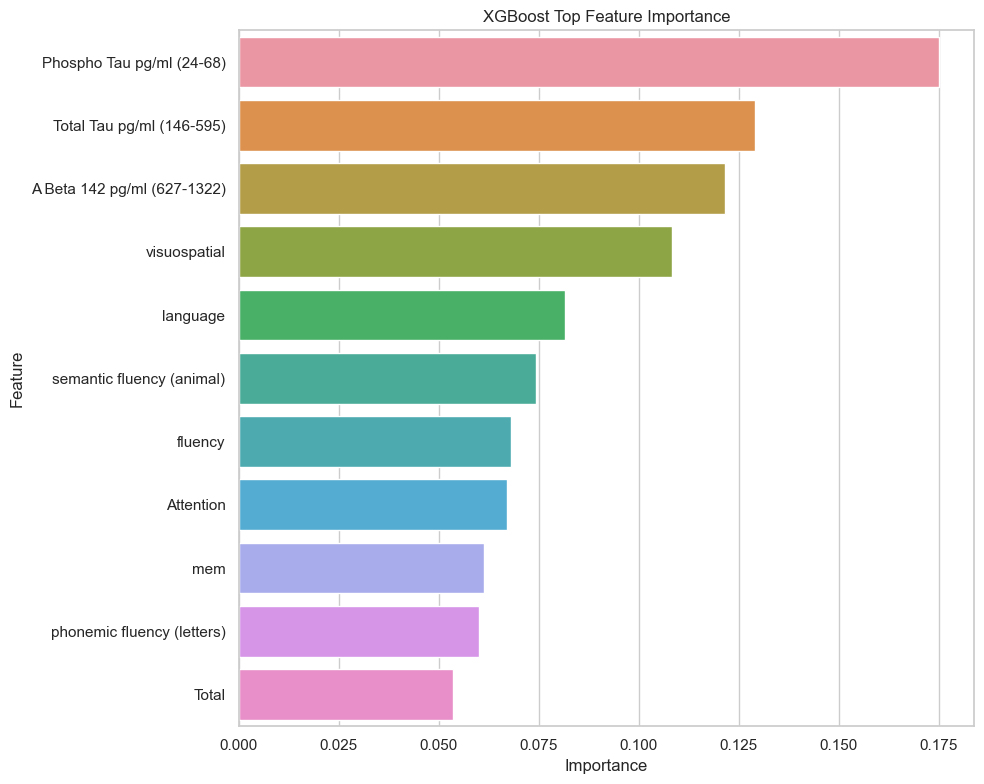

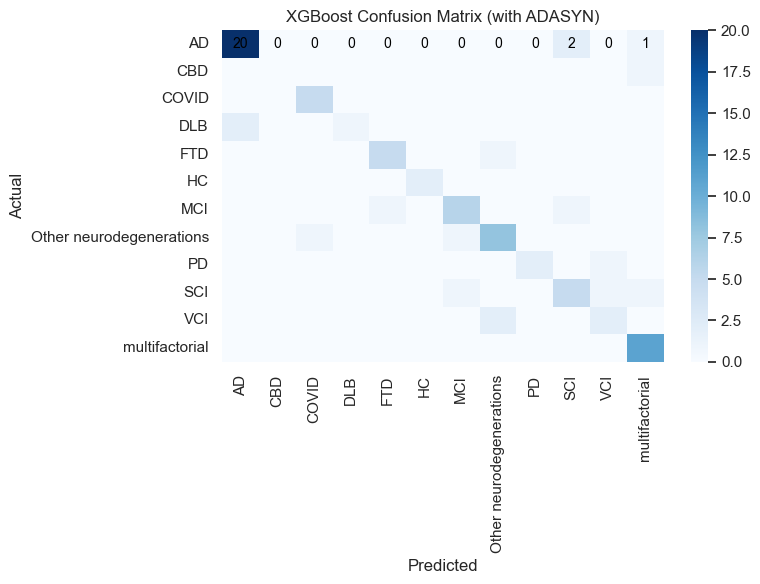

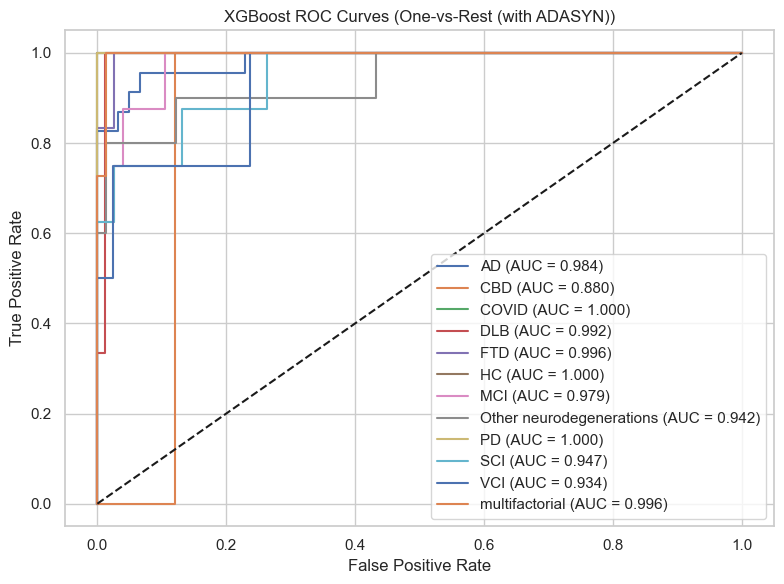

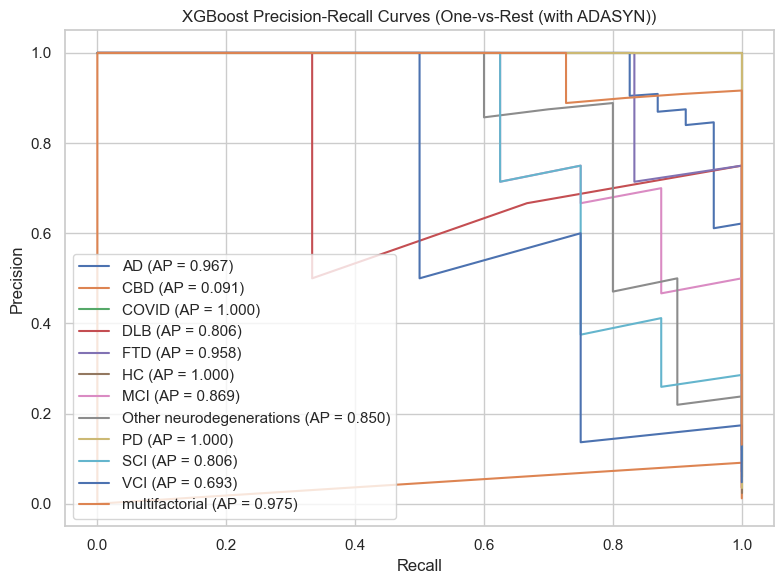


XGBoost model training and evaluation complete.

Building RandomForest Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]
Cross-validation accuracy (default params): 0.9234 ± 0.0137

Performing hyperparameter tuning...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'bootstrap': False, 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation score: 0.9366

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.8214
ROC AUC: 0.9418

Confusion Matri

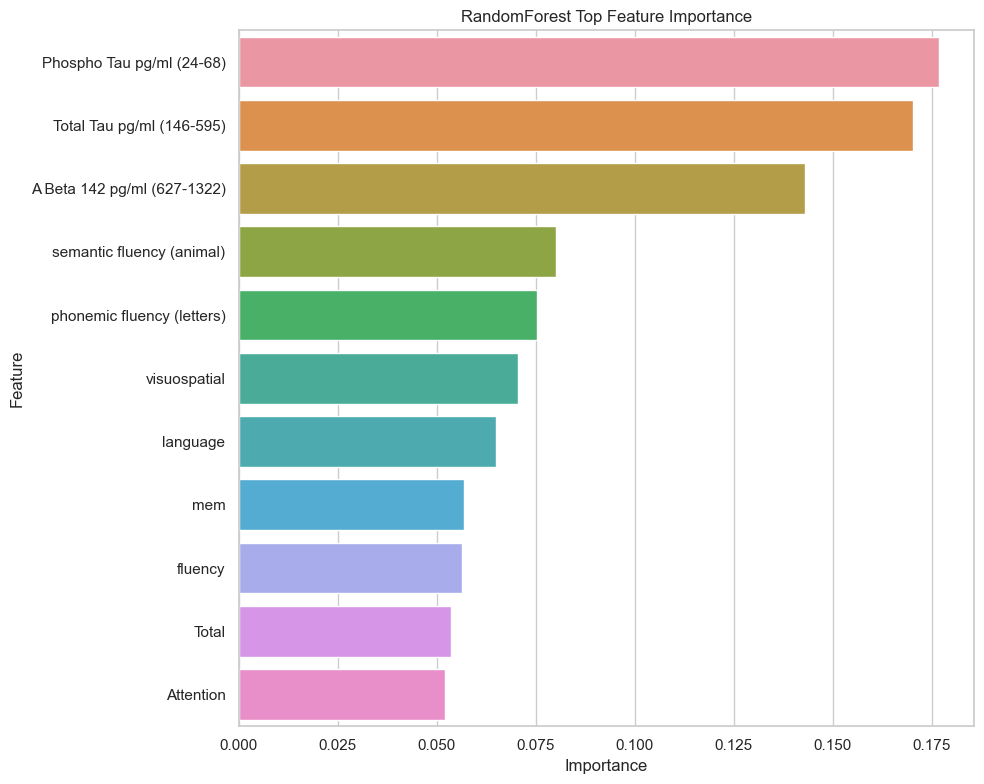

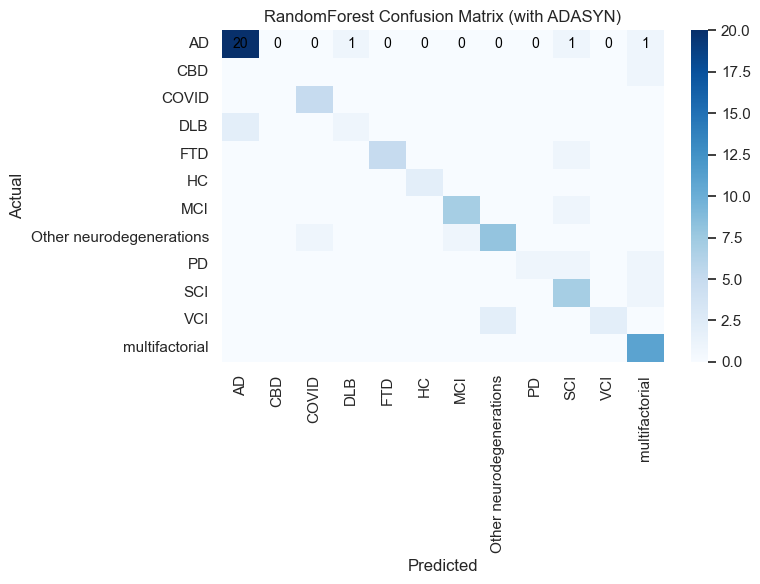

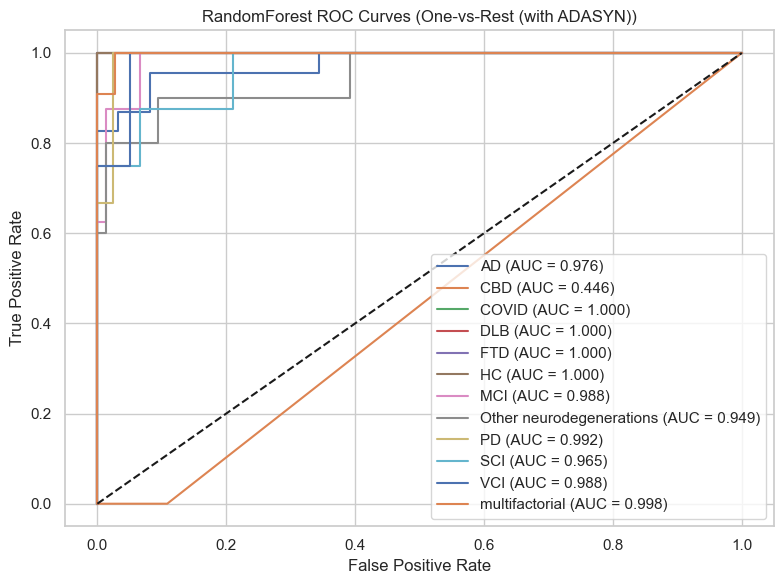

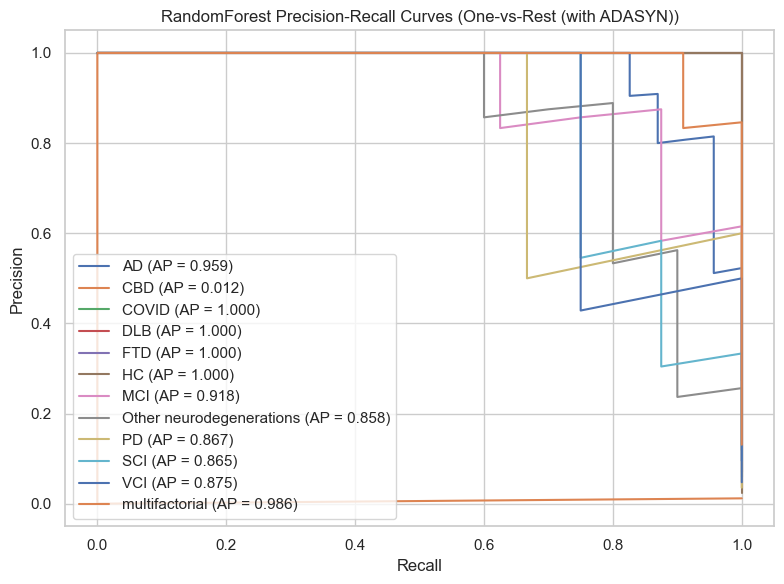


RandomForest model training and evaluation complete.

Building DecisionTree Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]
Cross-validation accuracy (default params): 0.8124 ± 0.0188

Performing hyperparameter tuning...
Fitting 5 folds for each of 90 candidates, totalling 450 fits
Best parameters: {'criterion': 'gini', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best cross-validation score: 0.8190

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.7143
ROC AUC: 0.8105

Confusion Matrix:
[[17  0  0  

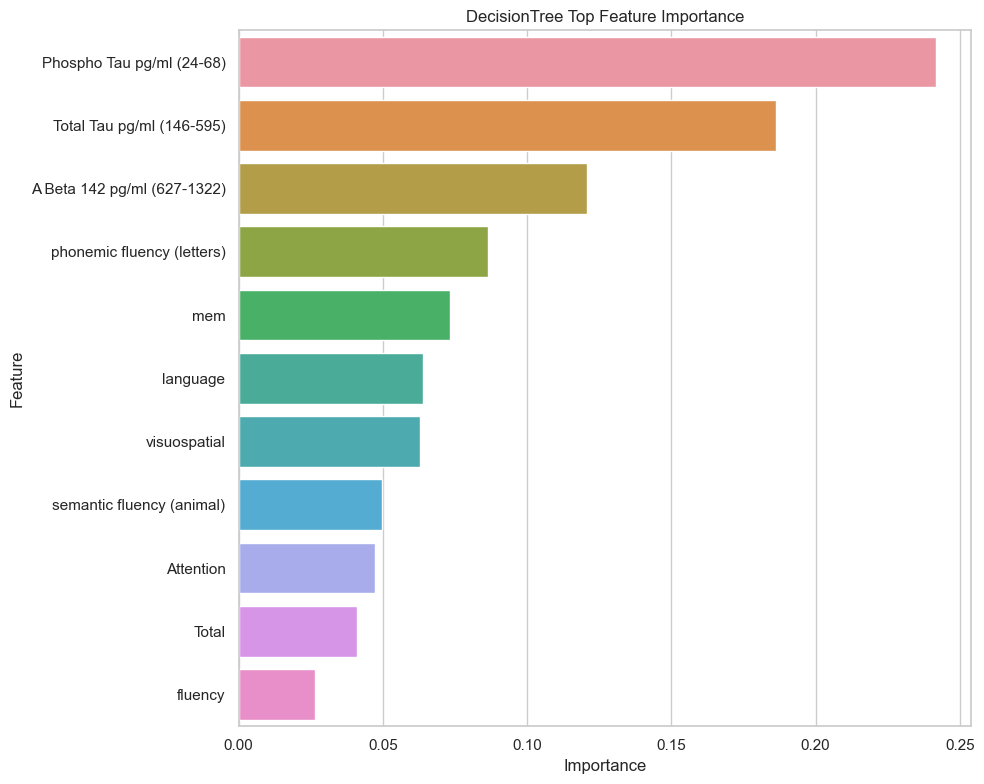

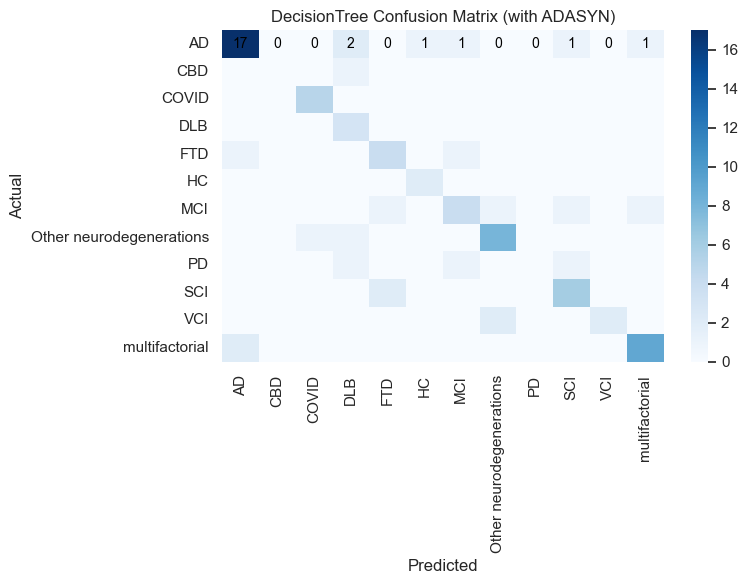

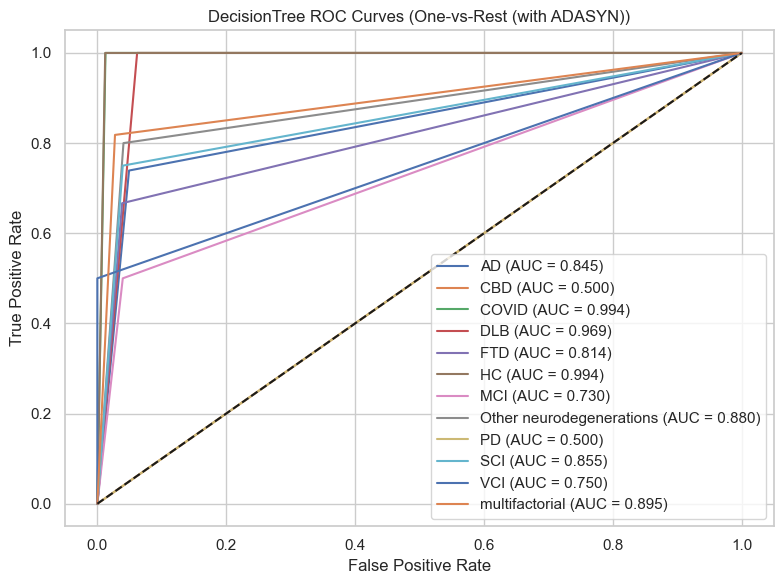

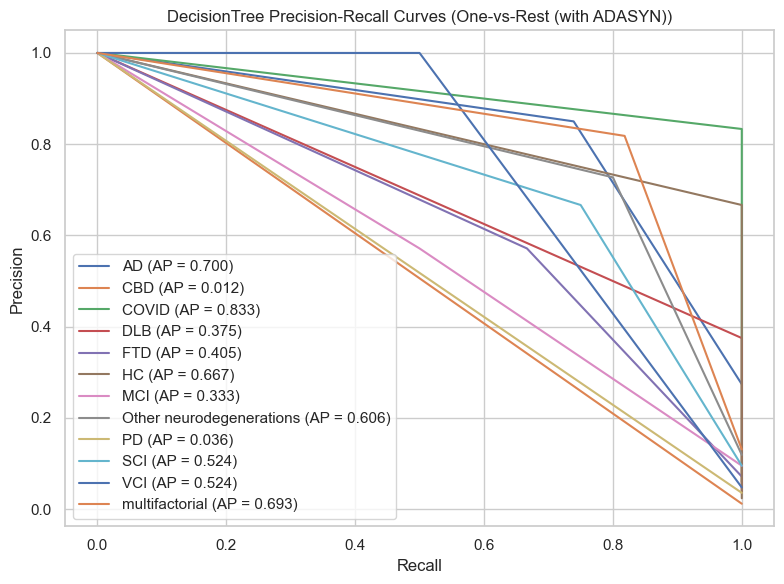


DecisionTree model training and evaluation complete.

Building SVM Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]
Cross-validation accuracy (default params): 0.7847 ± 0.0155

Performing hyperparameter tuning...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters: {'C': 100, 'gamma': 'scale', 'kernel': 'rbf', 'probability': True}
Best cross-validation score: 0.9498

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.7381
ROC AUC: 0.9563

Confusion Matrix:
[[20  0  0  0  0  0  0  1  0  1  0  1]
 

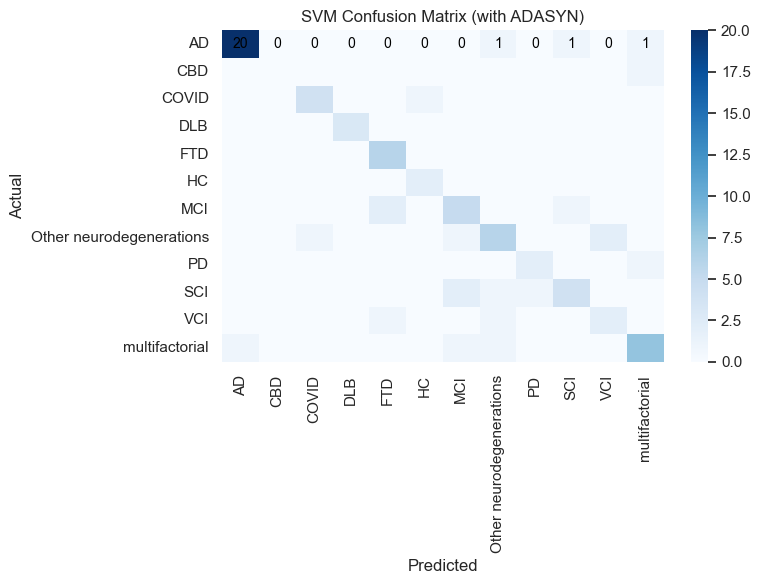

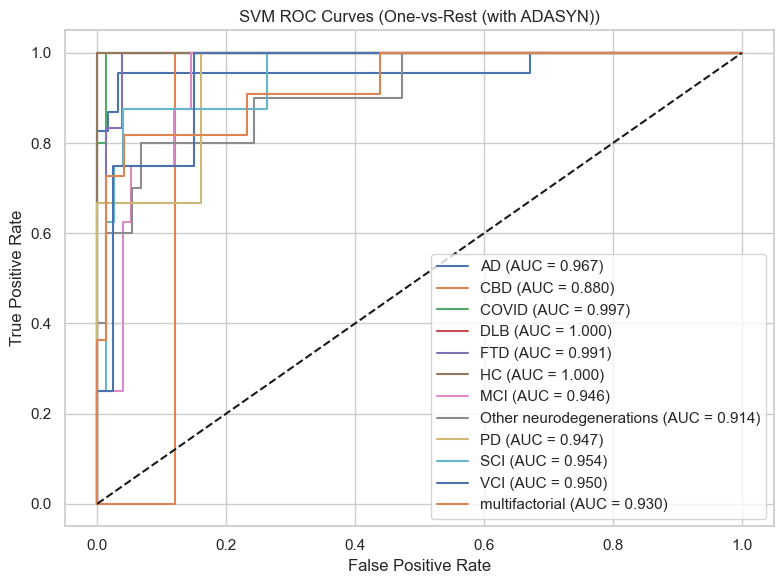

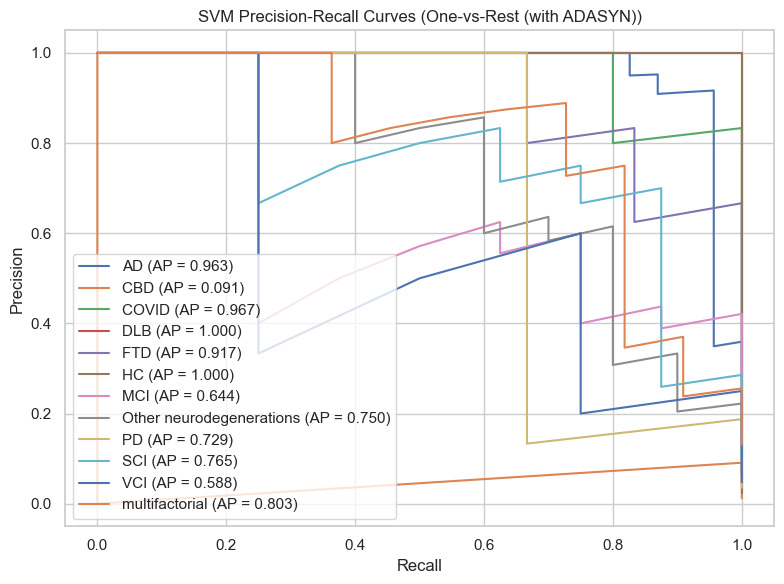


SVM model training and evaluation complete.

Building NeuralNetwork Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]
Cross-validation accuracy (default params): 0.6156 ± 0.0474

Performing hyperparameter tuning...
Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best parameters: {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'solver': 'adam'}
Best cross-validation score: 0.6628

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.5357
ROC AUC: 0.9041

Confusi

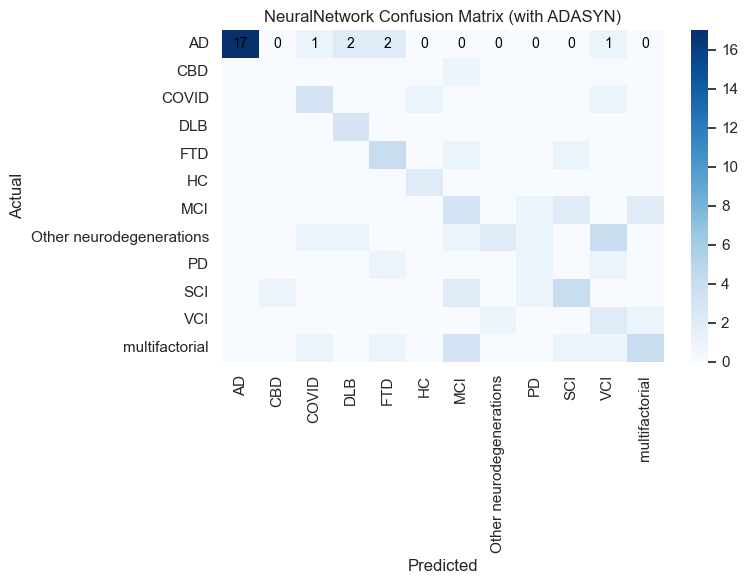

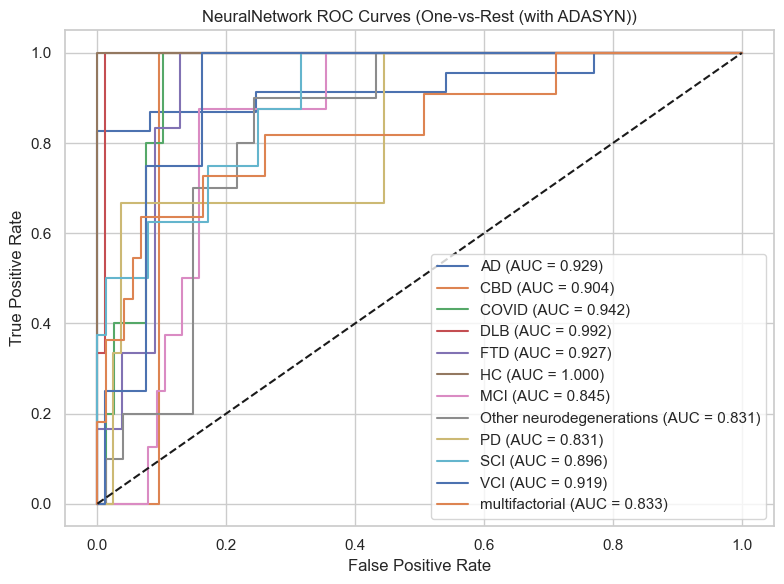

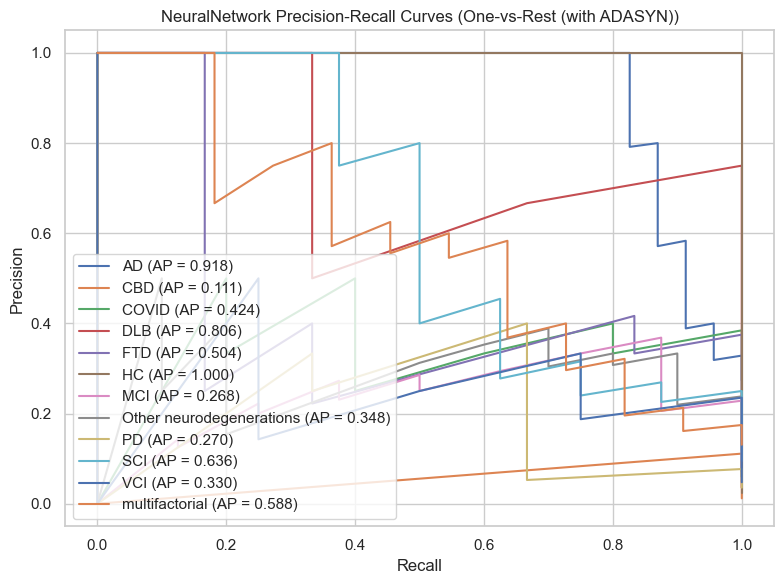


NeuralNetwork model training and evaluation complete.

Building KNN Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]
Cross-validation accuracy (default params): 0.7622 ± 0.0316

Performing hyperparameter tuning...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'metric': 'manhattan', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best cross-validation score: 0.8983

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.7619
ROC AUC: 0.8918

Confusion Matrix:
[[18  0  0  1  0  0  3  1  0  0  

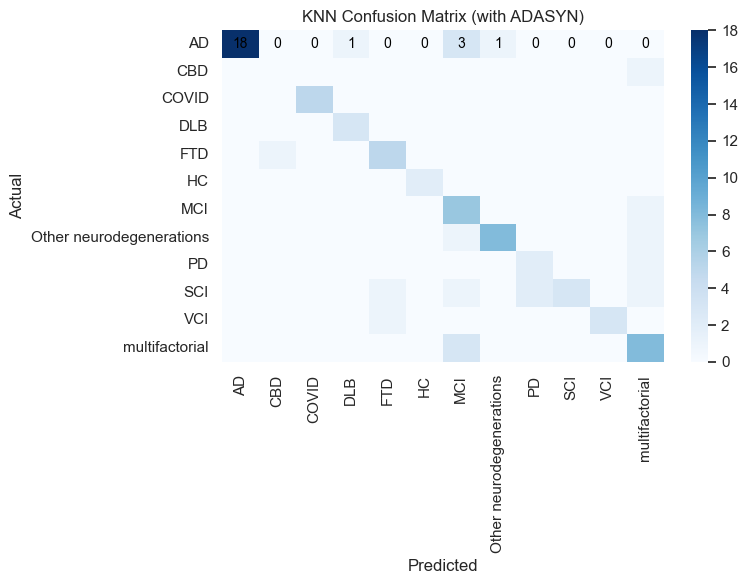

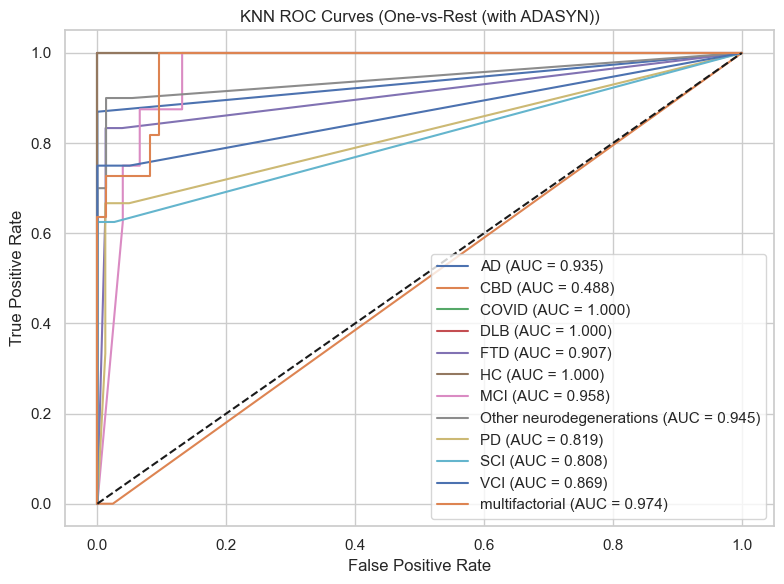

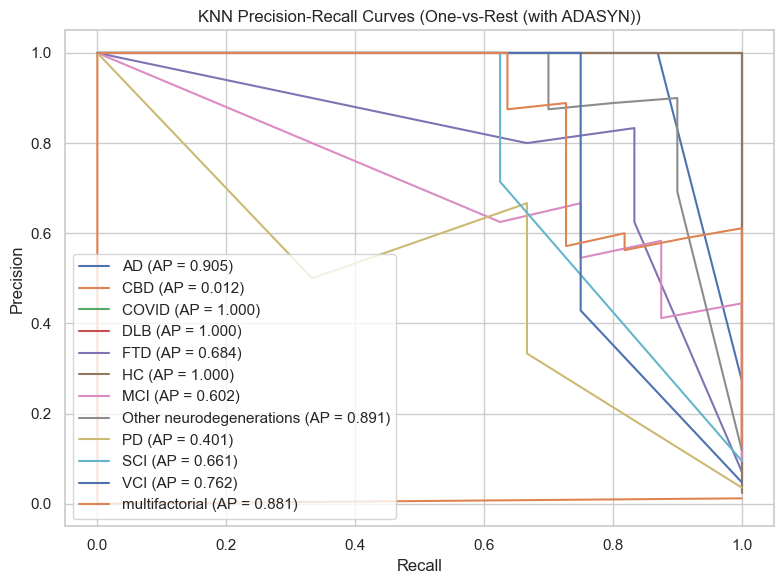


KNN model training and evaluation complete.

Building StackingEnsemble Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]
Cross-validation accuracy: 0.9313 ± 0.0124

Training final stacking ensemble model...

Test Set Performance:
Accuracy: 0.8571
ROC AUC: 0.9801

Confusion Matrix:
[[21  0  0  0  0  0  0  0  0  1  0  1]
 [ 0  0  0  0  0  0  0  0  0  0  0  1]
 [ 0  0  5  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  3  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  5  0  0  0  0  1  0  0]
 [ 0  0  0  0  0  2  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  7  0  0  1  0  0]
 [

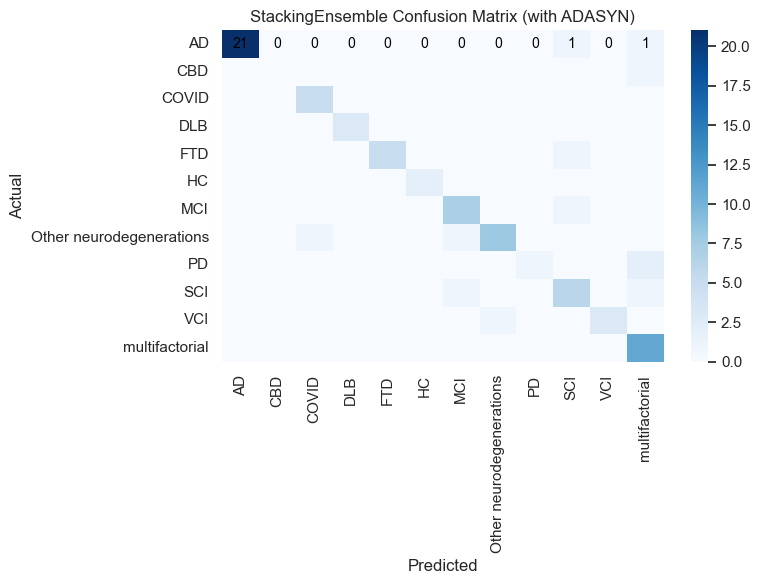

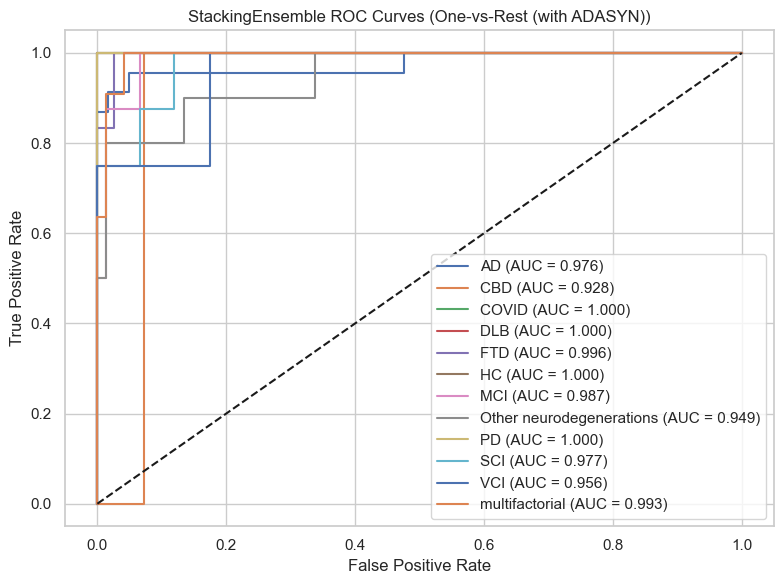

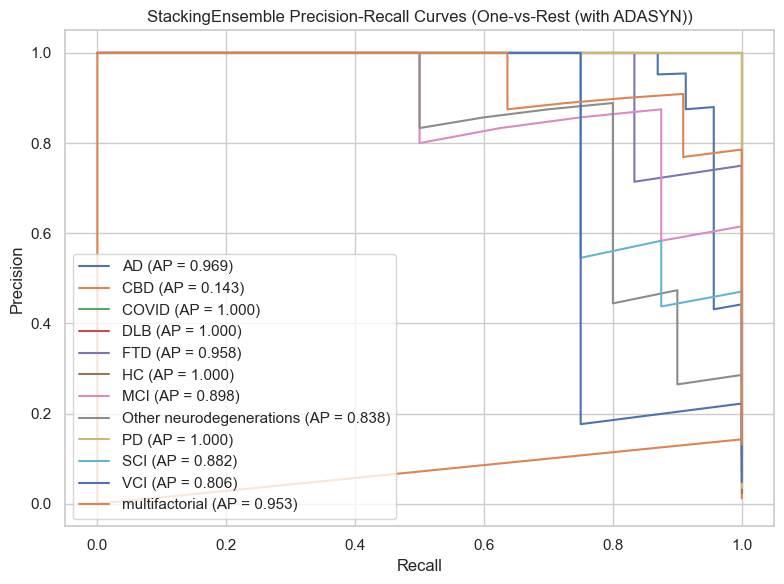


StackingEnsemble model training and evaluation complete.

Building GaussianNaiveBayes Model
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]
Cross-validation accuracy (default params): 0.6393 ± 0.0186

Performing hyperparameter tuning...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters: {'var_smoothing': 1e-09}
Best cross-validation score: 0.6393

Training final model on full dataset...

Test Set Performance:
Accuracy: 0.5238
ROC AUC: 0.9122

Confusion Matrix:
[[13  0  0  7  1  0  0  1  0  1  0  0]
 [ 0  0  0  1  0  0  0  0  0  0

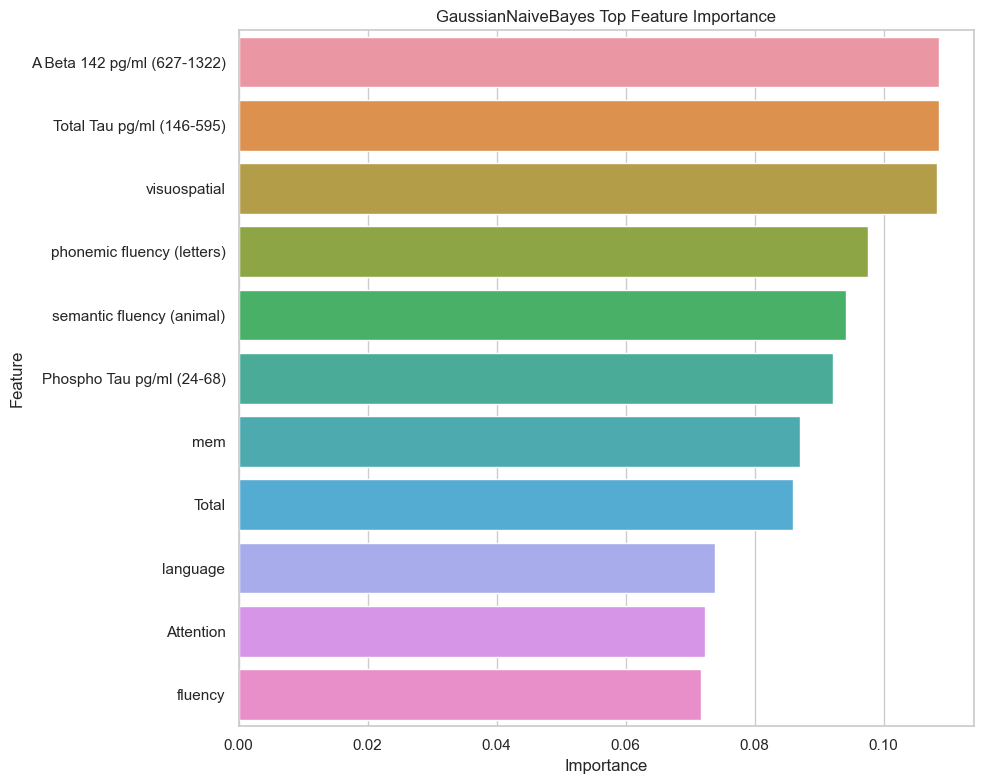

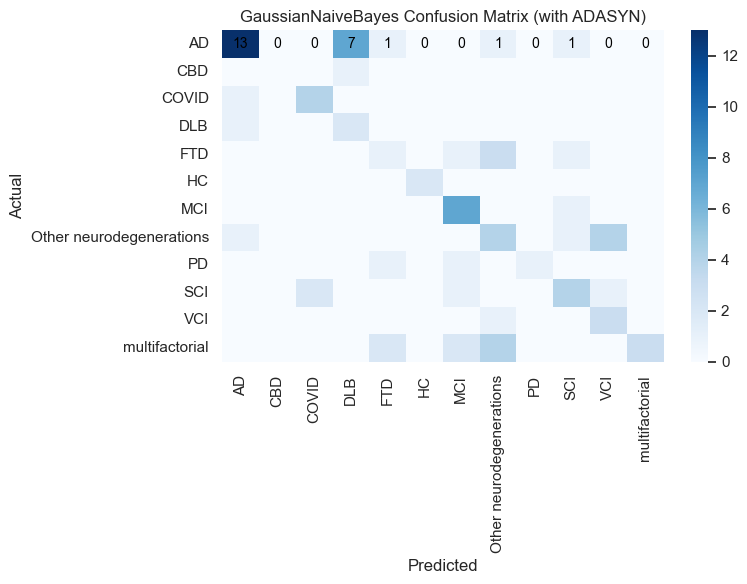

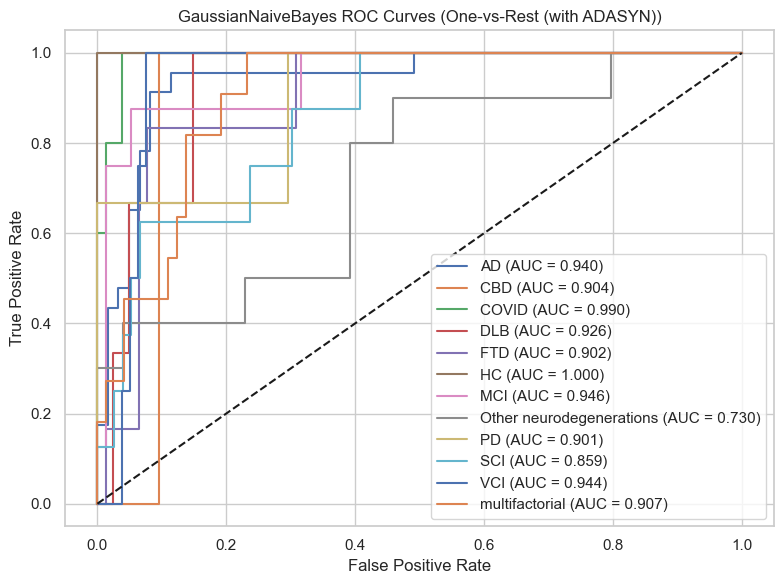

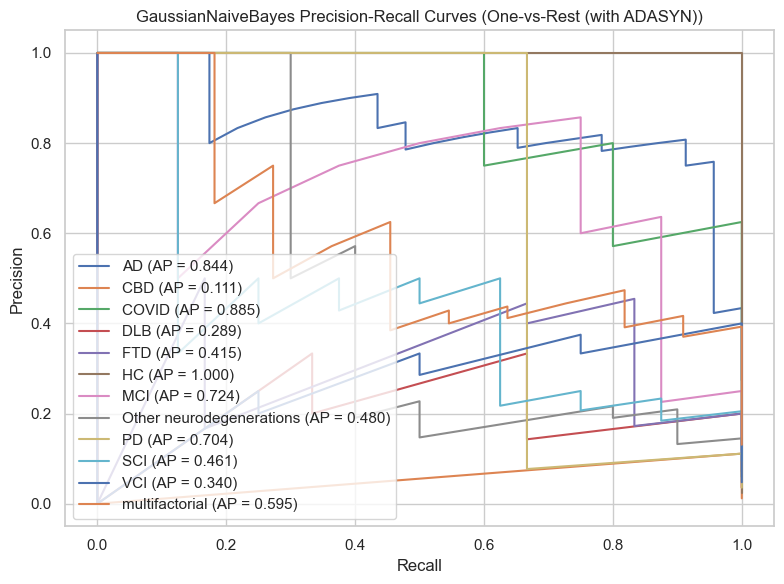


GaussianNaiveBayes model training and evaluation complete.

Building SelfNormalizingNN (SNN) Model with PyTorch
Using device: cpu
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]

Training PyTorch model with early stopping...
Epoch 10/200, Train Loss: 1.4004, Val Loss: 1.1581
Epoch 20/200, Train Loss: 1.1226, Val Loss: 0.7901
Epoch 30/200, Train Loss: 0.9663, Val Loss: 0.6034
Epoch 40/200, Train Loss: 0.8486, Val Loss: 0.5217
Epoch 50/200, Train Loss: 0.7171, Val Loss: 0.4632
Epoch 60/200, Train Loss: 0.6623, Val Loss: 0.4181
Epoch 70/200, Train Loss: 0.57

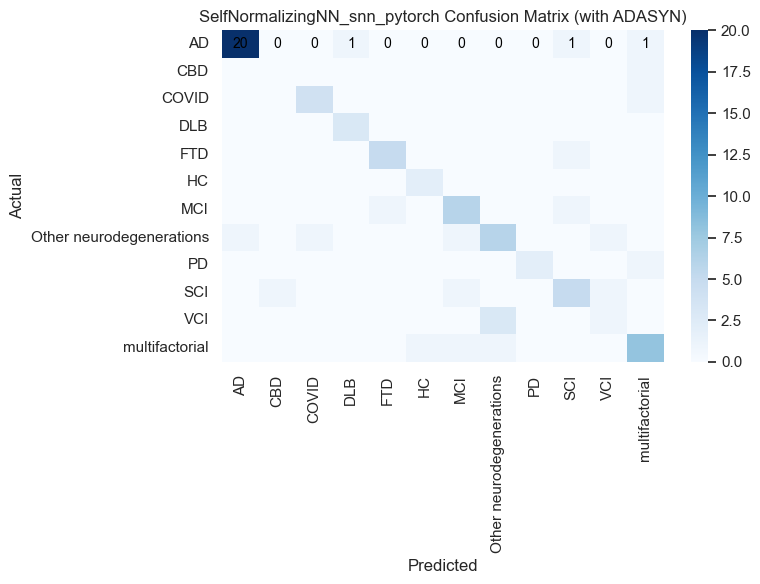

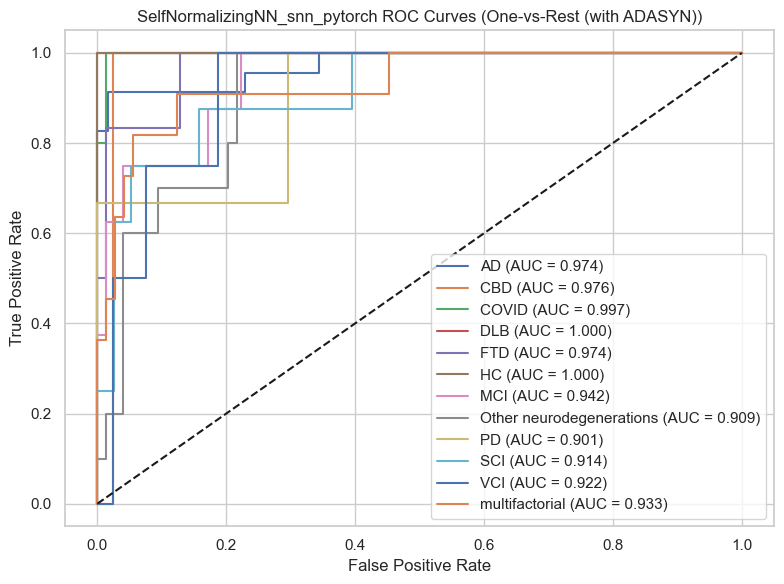

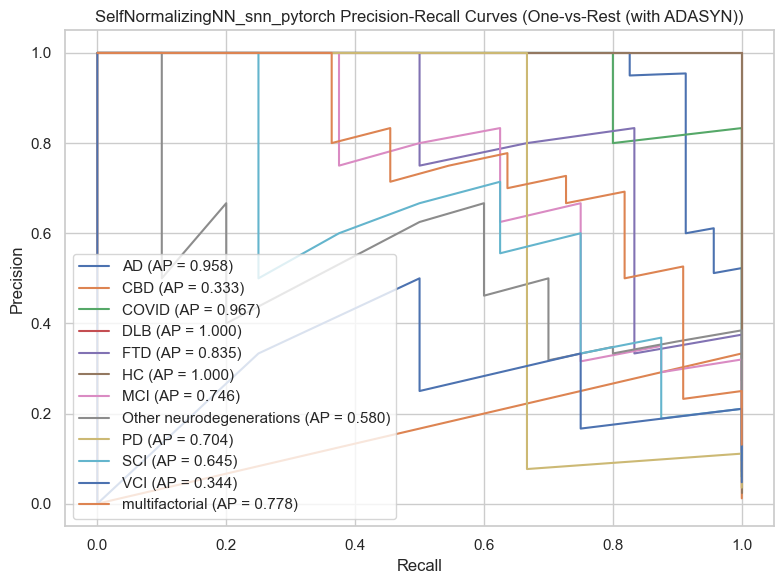

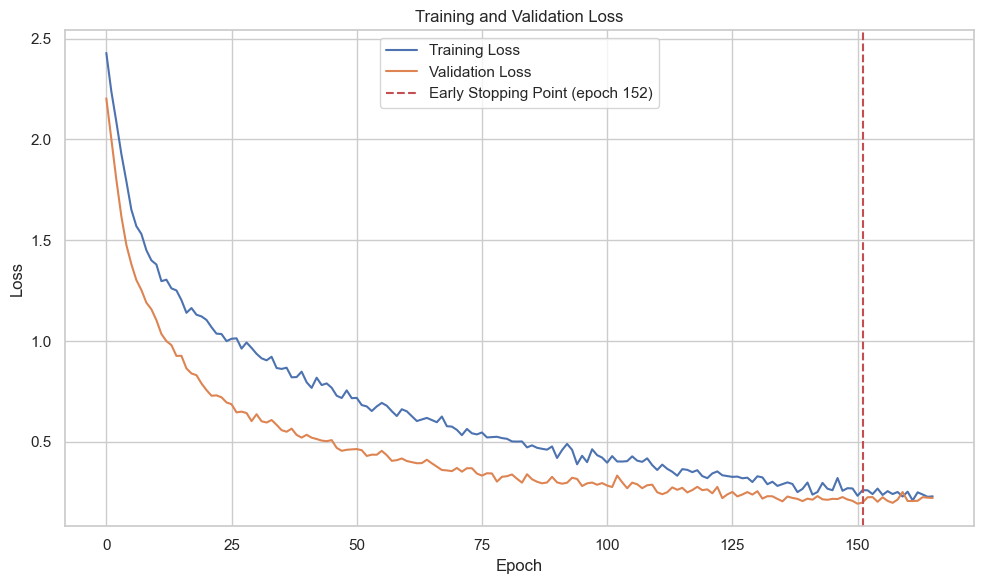


SelfNormalizingNN (snn) PyTorch model training and evaluation complete.

Building AttentionNN (ATT) Model with PyTorch
Using device: cpu
Loaded data with 416 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'Other neurodegenerations' 'PD'
 'SCI' 'VCI' 'multifactorial']
Training set size: 332, Test set size: 84
Class distribution in training set: [89  4 22 13 26  7 30 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Trying ADASYN.
After ADASYN - Training set size: 757
Class distribution after ADASYN: [89 63 57 59 63 61 59 62 61 67 58 58]

Training PyTorch model with early stopping...
Epoch 10/200, Train Loss: 1.9439, Val Loss: 2.0407
Epoch 20/200, Train Loss: 1.5402, Val Loss: 1.8505
Epoch 30/200, Train Loss: 1.3118, Val Loss: 1.8367
Epoch 40/200, Train Loss: 1.2990, Val Loss: 1.7059
Epoch 50/200, Train Loss: 1.1388, Val Loss: 1.8720
Epoch 60/200, Train Loss: 1.1453, Val Loss: 1.8589
Early stopping at epoch

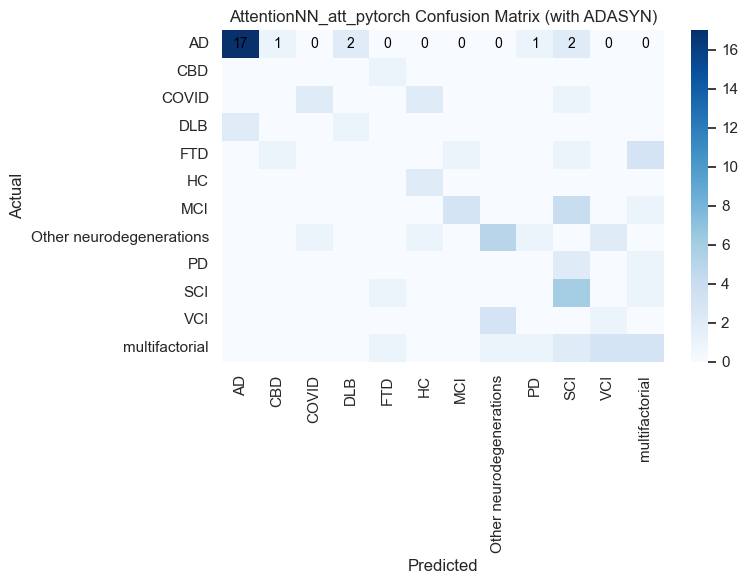

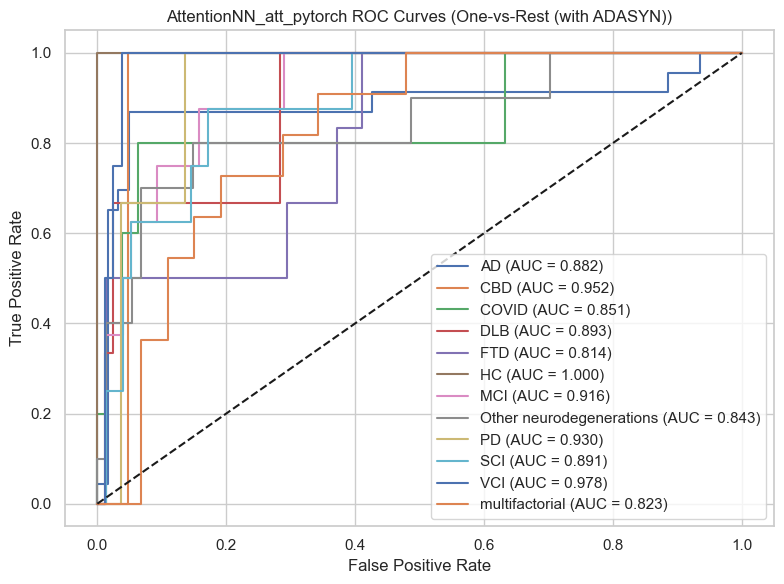

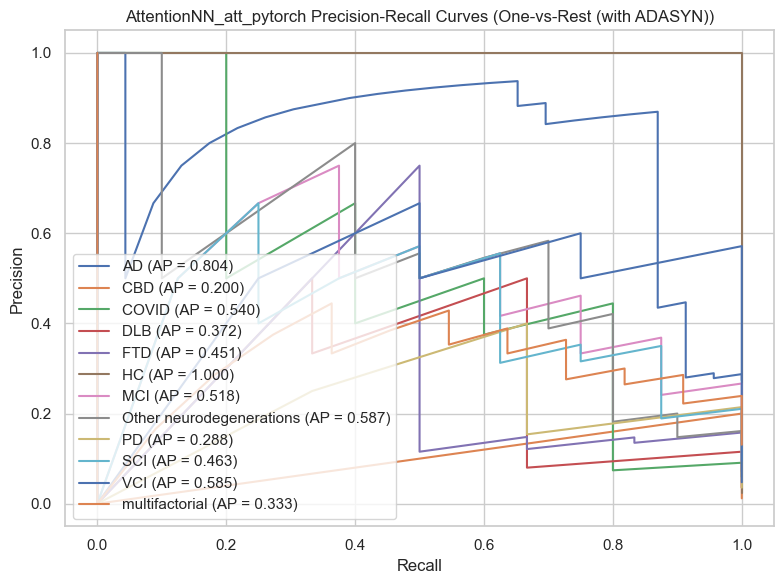

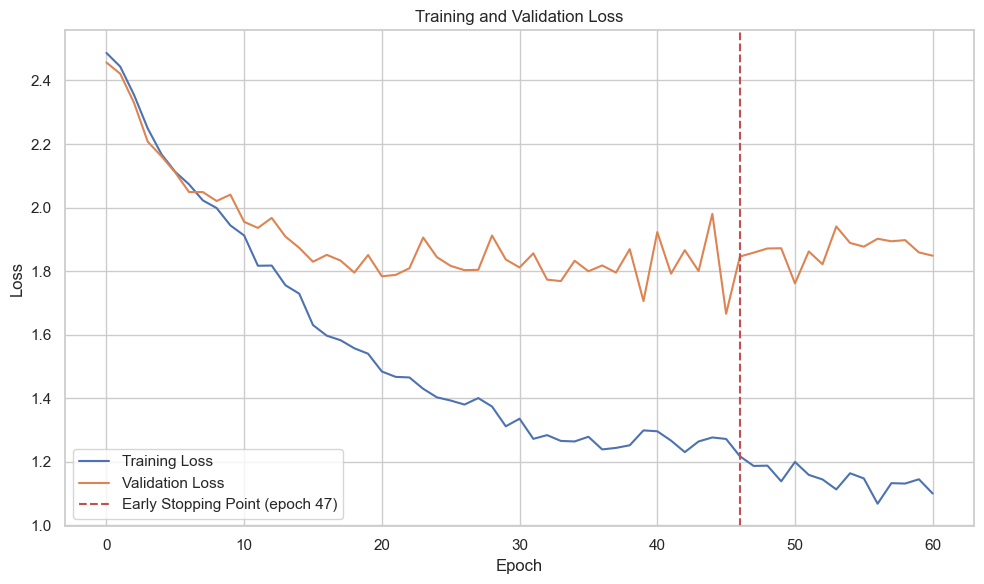


AttentionNN (att) PyTorch model training and evaluation complete.

Model Comparison (Accuracy):
                Model  Accuracy   ROC_AUC
6    StackingEnsemble  0.857143  0.980097
1        RandomForest  0.821429  0.941803
0             XGBoost  0.797619  0.970762
5                 KNN  0.761905  0.891794
3                 SVM  0.738095  0.956300
8   SelfNormalizingNN  0.738095  0.953632
2        DecisionTree  0.714286  0.810536
4       NeuralNetwork  0.535714  0.904103
7  GaussianNaiveBayes  0.523810  0.912237
9         AttentionNN  0.476190  0.897840

Model Comparison (ROC AUC):
                Model  Accuracy   ROC_AUC
6    StackingEnsemble  0.857143  0.980097
0             XGBoost  0.797619  0.970762
3                 SVM  0.738095  0.956300
8   SelfNormalizingNN  0.738095  0.953632
1        RandomForest  0.821429  0.941803
7  GaussianNaiveBayes  0.523810  0.912237
4       NeuralNetwork  0.535714  0.904103
9         AttentionNN  0.476190  0.897840
5                 KNN  0.761905  0

In [4]:
if __name__ == "__main__":
    # Path to your imputed data
    data_path = 'cognid_knn_imputed_with_variation.xlsx'
    cleaned_data_path = 'cognid_knn_imputed_with_variation_cleaned.xlsx'
    # Cleaning the data
    df = pd.read_excel(data_path)
    
    
    # Target column (diagnosis classification)
    target_column = 'Completed Diagnosis'
    
    # Removing Rows where diagnosis is still under investigation
    before_rows = df.shape[0]
    df = df.drop(df[df[target_column]=='No diagnosis'].index)
    
    print(f'Removed {before_rows - df.shape[0]} rows from {target_column} where value was No diagnosis')
    
    df.to_excel(cleaned_data_path, index=False)
    
    # Features to use (these should match the imputed columns)
    feature_columns = [
        'Total Tau pg/ml (146-595)', 
        'Phospho Tau pg/ml (24-68)', 
        'A Beta 142 pg/ml (627-1322)', 
        'Total', 
        'Attention', 
        'mem', 
        'fluency', 
        'language', 
        'visuospatial', 
        'phonemic fluency (letters)', 
        'semantic fluency (animal)'
    ]
    
    # Run all models and get comparison
    models_results, comparison = main(
        data_path=cleaned_data_path,
        target_column=target_column,
        feature_columns=feature_columns,
        models_to_run=['xgboost', 'rf', 'dt', 'svm', 'nn', 'knn', 'stack', 'gnb', 'snn', 'att'],  # Run all models
        test_size=0.2,
        use_adasyn=True,
        adasyn_neighbors=6,
        random_state=42
    )
    print(len(models_results))
    
    # Alternatively, run only specific models
    # models_results, comparison = main(
    #     data_path=data_path,
    #     target_column=target_column,
    #     feature_columns=feature_columns,
    #     models_to_run=['xgboost', 'rf'],  # Only run XGBoost and Random Forest
    #     test_size=0.3,
    #     use_adasyn=True,
    #     random_state=42
    # )

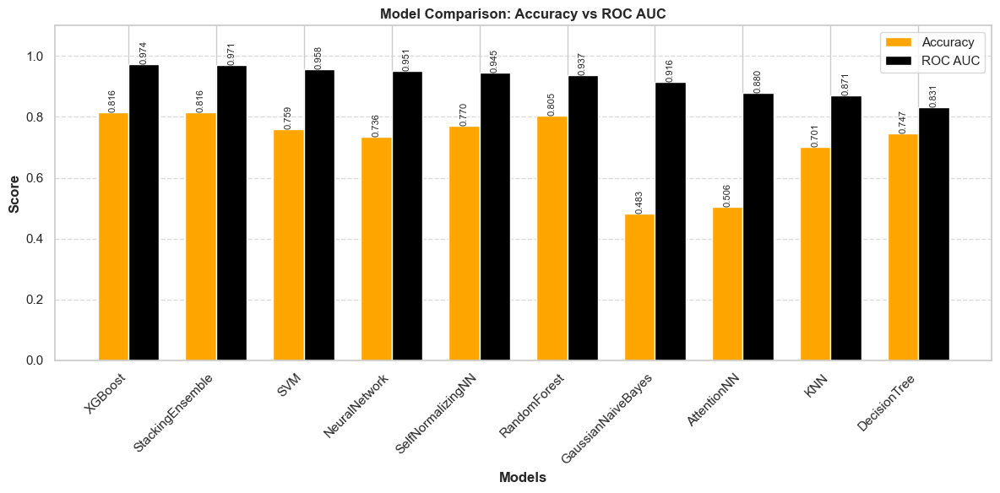

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Model comparison data
models = [
    'XGBoost', 'StackingEnsemble', 'SVM', 'NeuralNetwork', 
    'SelfNormalizingNN', 'RandomForest', 'GaussianNaiveBayes', 
    'AttentionNN', 'KNN', 'DecisionTree'
]
accuracies = [0.797619, 0.857143, 0.758621, 0.735632, 0.770115, 
              0.804598, 0.482759, 0.505747, 0.701149, 0.747126]
roc_aucs = [0.970762, 0.980097, 0.957519, 0.951041, 0.944995, 
            0.937099, 0.916424, 0.879784, 0.870646, 0.830936]

# Create the plot
plt.figure(figsize=(12, 6))

# Set the width of each bar and positions
bar_width = 0.35
r1 = np.arange(len(models))
r2 = [x + bar_width for x in r1]

# Create bars
plt.bar(r1, accuracies, color='orange', width=bar_width, edgecolor='white', label='Accuracy')
plt.bar(r2, roc_aucs, color='black', width=bar_width, edgecolor='white', label='ROC AUC')

# Add labels and title
plt.xlabel('Models', fontweight='bold')
plt.ylabel('Score', fontweight='bold')
plt.title('Model Comparison: Accuracy vs ROC AUC', fontweight='bold')

# Add xticks on the middle of the group bars
plt.xticks([r + bar_width/2 for r in range(len(models))], models, rotation=45, ha='right')

# Set y-axis limits
plt.ylim(0, 1.1)

# Create legend
plt.legend()

# Add value labels on top of each bar
def add_value_labels(bars):
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                 f'{height:.3f}',
                 ha='center', va='bottom', fontsize=8, rotation=90)

# Add value labels
add_value_labels(plt.gca().patches[:len(models)])
add_value_labels(plt.gca().patches[len(models):])

# Adjust layout and display
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Save the plot
plt.savefig('model_comparison_plot.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

Plot saved as model_comparison_1.png


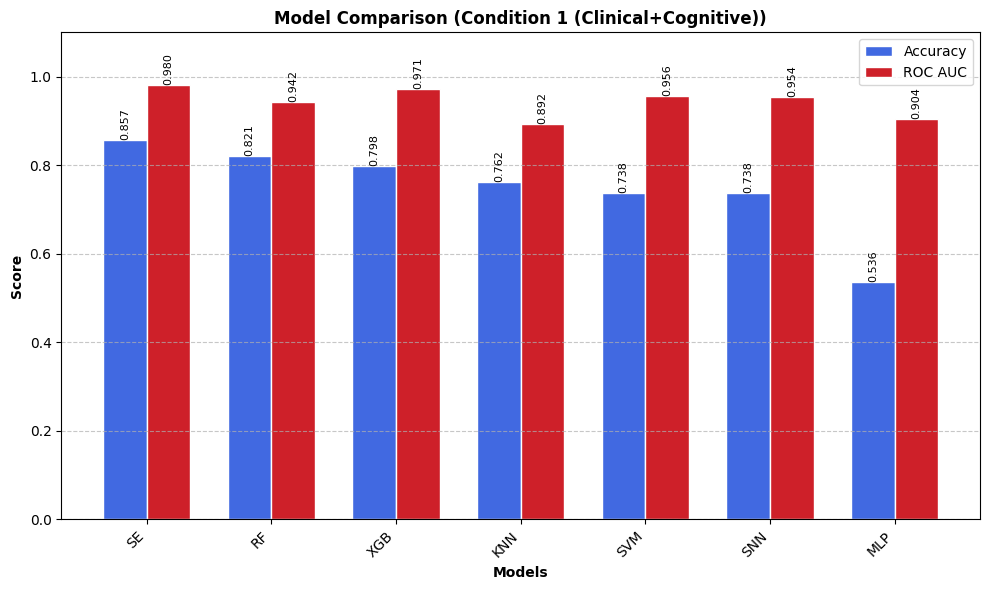

Plot saved as model_comparison_2.png


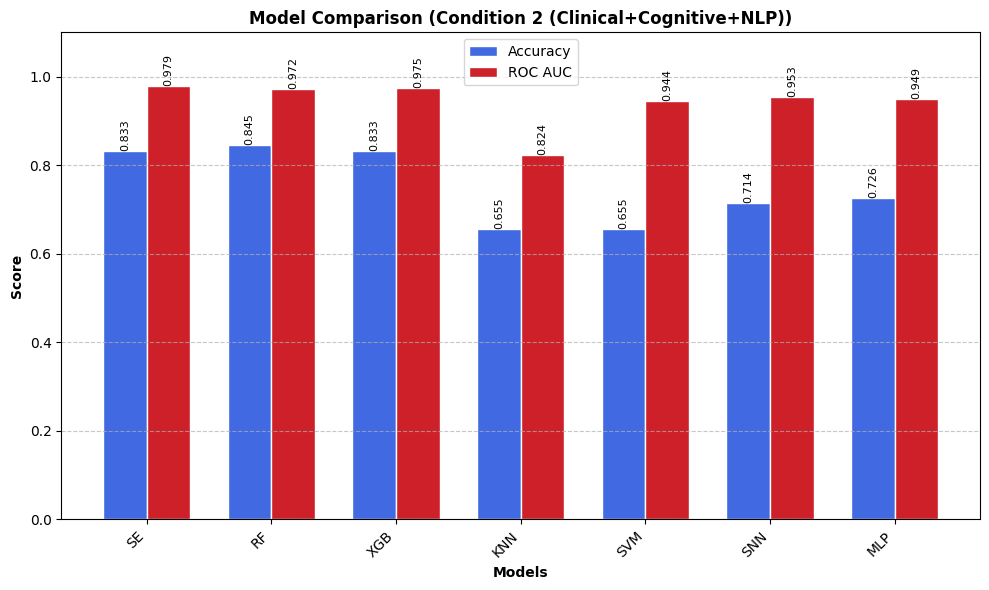

Plot saved as model_comparison_3.png


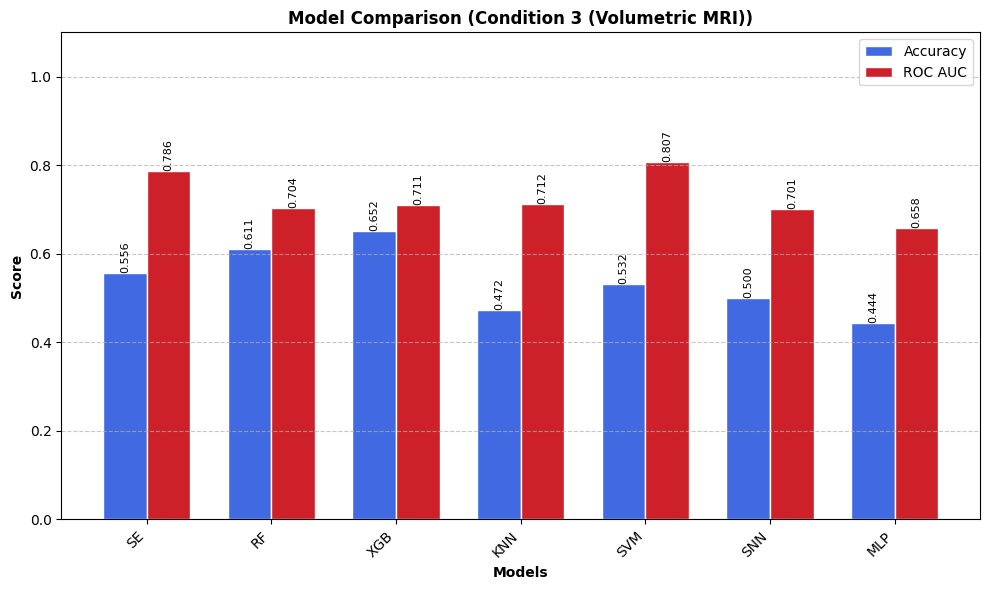

Plot saved as model_comparison_4.png


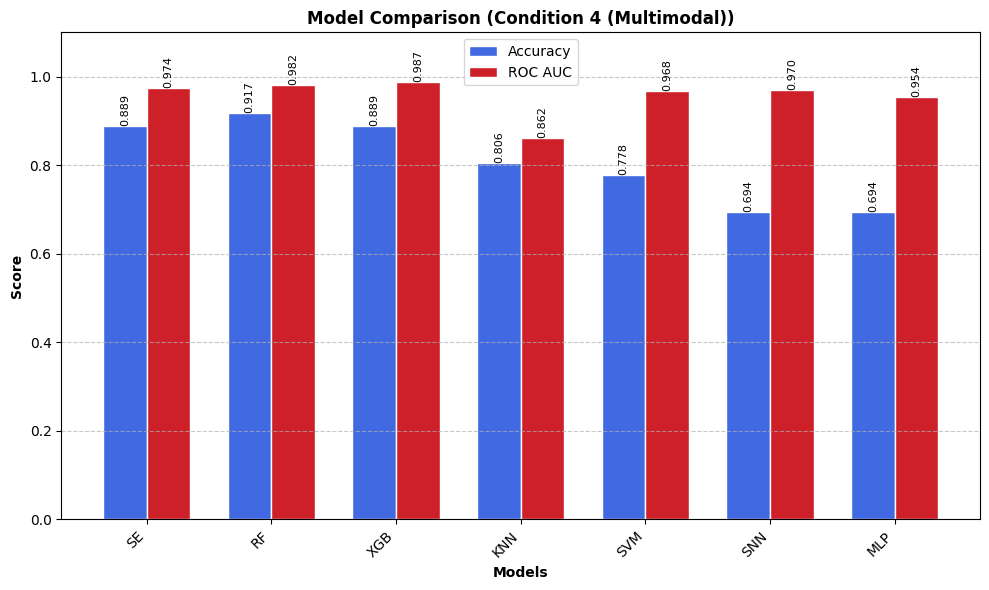

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Data for all conditions (extracted from previous conversation/table)
# Note: Only including the 7 models present across all conditions
data = {
    'Condition 1 (Clinical+Cognitive)': {
        'Models': ['SE', 'RF', 'XGB', 'KNN', 'SVM', 'SNN', 'MLP'],
        'Accuracy': [0.857, 0.821, 0.798, 0.762, 0.738, 0.738, 0.536],
        'ROC_AUC': [0.980, 0.942, 0.971, 0.892, 0.956, 0.954, 0.904]
    },
    'Condition 2 (Clinical+Cognitive+NLP)': {
        'Models': ['SE', 'RF', 'XGB', 'KNN', 'SVM', 'SNN', 'MLP'],
        'Accuracy': [0.833, 0.845, 0.833, 0.655, 0.655, 0.714, 0.726],
        'ROC_AUC': [0.979, 0.972, 0.975, 0.824, 0.944, 0.953, 0.949]
    },
    'Condition 3 (Volumetric MRI)': {
        'Models': ['SE', 'RF', 'XGB', 'KNN', 'SVM', 'SNN', 'MLP'],
        'Accuracy': [0.556, 0.611, 0.611, 0.472, 0.532, 0.500, 0.444],
        'ROC_AUC': [0.786, 0.704, 0.711, 0.712, 0.807, 0.701, 0.658]
    },
    'Condition 4 (Multimodal)': {
        'Models': ['SE', 'RF', 'XGB', 'KNN', 'SVM', 'SNN', 'MLP'],
        'Accuracy': [0.889, 0.917, 0.889, 0.806, 0.778, 0.694, 0.694],
        'ROC_AUC': [0.974, 0.982, 0.987, 0.862, 0.968, 0.970, 0.954]
    }
}

# Function to add value labels on top of bars
def add_value_labels(bars):
    for bar in bars:
        height = bar.get_height()
        # Check if height is NaN before formatting
        if pd.isna(height):
            label_text = 'N/A'
        else:
            label_text = f'{height:.3f}'

        plt.text(bar.get_x() + bar.get_width()/2., height,
                 label_text,
                 ha='center', va='bottom', fontsize=8, rotation=90)

# Loop through each condition to create a separate plot
for condition_name, condition_data in data.items():
    models = condition_data['Models']
    accuracies = condition_data['Accuracy']
    roc_aucs = condition_data['ROC_AUC']

    # Create the plot
    plt.figure(figsize=(10, 6)) # Adjusted figure size slightly

    # Set the width of each bar and positions
    bar_width = 0.35
    r1 = np.arange(len(models))
    r2 = [x + bar_width for x in r1]

    # Create bars
    acc_bars = plt.bar(r1, accuracies, color='#4169e1', width=bar_width, edgecolor='white', label='Accuracy')
    auc_bars = plt.bar(r2, roc_aucs, color='#ce2029', width=bar_width, edgecolor='white', label='ROC AUC')

    # Add labels and title
    plt.xlabel('Models', fontweight='bold')
    plt.ylabel('Score', fontweight='bold')
    # Make title specific to the condition
    plt.title(f'Model Comparison ({condition_name})', fontweight='bold')

    # Add xticks on the middle of the group bars
    plt.xticks([r + bar_width/2 for r in range(len(models))], models, rotation=45, ha='right')

    # Set y-axis limits
    plt.ylim(0, 1.1)

    # Create legend
    plt.legend()

    # Add value labels using the updated function
    add_value_labels(acc_bars)
    add_value_labels(auc_bars)

    # Adjust layout and add grid
    plt.tight_layout()
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Save the plot with a unique name
    filename = f"model_comparison_{condition_name.split(' ')[1]}.png".lower().replace('(','').replace(')','').replace('+','_')
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Plot saved as {filename}")

    # Show the plot (optional, can generate multiple plot windows)
    plt.show()

In [14]:
from lime import lime_tabular
from diagnostic_models import load_and_prepare_data, split_and_scale_data, apply_adasyn
import pandas as pd

In [15]:
def apply_shap_analysis(model, X_train, X_test, X_explain, feature_names, class_names, model_type, model_name):
    """
    Apply SHAP analysis to explain model predictions.
    """
    try:
        import shap
        print("\nApplying SHAP explainer...")
        
        # Select background data for SHAP
        if X_train.shape[0] > 500:
            background_data = shap.kmeans(X_train, 100).data
        else:
            background_data = X_train
        
        # Select appropriate explainer based on model typez
        if model_type.lower() in ['xgboost', 'rf', 'dt']:
            explainer = shap.TreeExplainer(model)
            shap_values = explainer.shap_values(X_test)
        elif model_type.lower() in ['svm', 'lr', 'knn']:
            explainer = shap.KernelExplainer(model.predict_proba, background_data)
            shap_values = explainer.shap_values(X_explain)
        elif model_type.lower() in ['nn', 'pytorch', 'tabnet', 'snn', 'att']:
            # For neural networks
            try:
                # Try with the model's predict_proba method
                def predict_fn(x):
                    return model.predict_proba(x)
                explainer = shap.KernelExplainer(predict_fn, background_data)
                shap_values = explainer.shap_values(X_explain)
            except Exception as e:
                print(f"Error with standard approach: {e}")
                print("Trying alternative SHAP approach for deep learning...")
                # Alternative approach
                explainer = shap.Explainer(model, background_data)
                shap_values = explainer(X_explain)
        else:
            # Generic approach
            explainer = shap.Explainer(model, background_data)
            shap_values = explainer(X_explain)
        
        # Generate SHAP summary plot
        plt.figure(figsize=(12, 8))
        if isinstance(shap_values, list):
            # For multi-class models
            shap.summary_plot(shap_values, X_explain, feature_names=feature_names, show=False)
        else:
            # For binary classification or when shap_values isn't a list
            shap.summary_plot(shap_values, X_explain, feature_names=feature_names, show=False)
        
        plt.title(f"{model_name} - SHAP Feature Importance")
        plt.tight_layout()
        plt.show()
        
        # Generate SHAP force plots for individual examples
        for i, idx in enumerate(range(min(3, len(X_explain)))):
            plt.figure(figsize=(12, 4))
            if isinstance(shap_values, list):
                # Multi-class - take the predicted class
                pred_class = model.predict([X_explain[idx]])[0]
                force_plot = shap.force_plot(
                    explainer.expected_value[pred_class], 
                    shap_values[pred_class][idx], 
                    X_explain[idx],
                    feature_names=feature_names, 
                    matplotlib=True,
                    show=False
                )
            else:
                # Binary or other format
                force_plot = shap.force_plot(
                    explainer.expected_value, 
                    shap_values[idx], 
                    X_explain[idx],
                    feature_names=feature_names, 
                    matplotlib=True,
                    show=False
                )
            
            plt.title(f"{model_name} - SHAP Force Plot for Instance {i+1}")
            plt.tight_layout()
            plt.show()
        
        print("SHAP analysis complete.")
        return {
            'explainer': explainer,
            'shap_values': shap_values,
            'background_data': background_data
        }
    
    except Exception as e:
        print(f"Error in SHAP analysis: {e}")
        import traceback
        traceback.print_exc()
        return {}

In [16]:
def apply_lime_analysis(model, X_train, X_explain, y_explain, feature_names, class_names, model_type, model_name):
    """
    Apply LIME analysis to explain individual predictions.
    """
    try:
        from lime import lime_tabular
        print("\nApplying LIME explainer...")
        
        # Create the LIME explainer
        explainer = lime_tabular.LimeTabularExplainer(
            X_train,
            feature_names=feature_names,
            class_names=[str(c) for c in class_names],
            mode='classification',
            random_state=42
        )
        
        # Function for model predictions
        def predict_fn(x):
            return model.predict_proba(x)
        
        # Generate explanations for selected instances
        explanations = []
        for i, idx in enumerate(range(len(X_explain))):
            exp = explainer.explain_instance(
                X_explain[idx],
                predict_fn,
                num_features=min(10, len(feature_names))
            )
            explanations.append(exp)
            
            # Save explanation visualization
            plt.figure(figsize=(10, 6))
            exp.as_pyplot_figure()
            plt.title(f"{model_name} - LIME Explanation for Instance {i+1}")
            plt.tight_layout()
            plt.show()
            
            # Print the actual vs predicted class
            true_class = y_explain[idx]
            pred_class = model.predict([X_explain[idx]])[0]
            pred_proba = model.predict_proba([X_explain[idx]])[0]
            
            print(f"Instance {i+1}:")
            print(f"  True class: {class_names[true_class]}")
            print(f"  Predicted class: {class_names[pred_class]}")
            print(f"  Prediction probabilities: {pred_proba}")
            print(f"  Top features supporting prediction:")
            
            # Get feature contributions
            feature_weights = sorted(exp.as_list(), key=lambda x: abs(x[1]), reverse=True)
            for feature, weight in feature_weights[:5]:
                print(f"    {feature}: {weight:.4f}")
            print("")
        
        print("LIME analysis complete.")
        return {
            'explainer': explainer,
            'explanations': explanations
        }
    
    except Exception as e:
        print(f"Error in LIME analysis: {e}")
        import traceback
        traceback.print_exc()
        return {}

In [17]:
def apply_pdp_analysis(model, X_train, feature_names, model_type, model_name, top_n_features=5):
    """
    Apply Partial Dependence Plots (PDP) to understand feature influence on predictions.
    """
    try:
        from sklearn.inspection import partial_dependence
        print("\nGenerating Partial Dependence Plots...")
        
        # Identify top features to analyze
        top_features = []
        
        # If model has built-in feature importance, use it
        if hasattr(model, 'feature_importances_'):
            importances = model.feature_importances_
            top_indices = np.argsort(importances)[-top_n_features:]
            top_features = [feature_names[i] for i in top_indices]
        # For linear models
        elif hasattr(model, 'coef_'):
            importances = np.abs(model.coef_[0]) if len(model.coef_.shape) > 1 else np.abs(model.coef_)
            top_indices = np.argsort(importances)[-top_n_features:]
            top_features = [feature_names[i] for i in top_indices]
        else:
            # For other models, use first few features or perform permutation importance
            from sklearn.inspection import permutation_importance
            result = permutation_importance(model, X_train, np.zeros(X_train.shape[0]), 
                                           n_repeats=10, random_state=42)
            top_indices = np.argsort(result.importances_mean)[-top_n_features:]
            top_features = [feature_names[i] for i in top_indices]
        
        # Get feature indices for PDP
        feature_indices = [feature_names.index(feature) for feature in top_features]
        
        # Generate PDPs
        fig, axes = plt.subplots(nrows=1, ncols=len(feature_indices), figsize=(15, 5))
        if len(feature_indices) == 1:
            axes = [axes]  # Make iterable for single feature case
        
        # Calculate PDPs
        for i, (feature_idx, ax) in enumerate(zip(feature_indices, axes)):
            feature_name = feature_names[feature_idx]
            
            # Calculate partial dependence
            pdp_result = partial_dependence(
                model, X_train, [feature_idx], kind='average', grid_resolution=20
            )
            
            # Plot
            feature_values = pdp_result['values'][0]
            pdp_values = pdp_result['average'][0]
            
            ax.plot(feature_values, pdp_values)
            ax.set_xlabel(feature_name)
            if i == 0:
                ax.set_ylabel('Partial Dependence')
            ax.grid(True, alpha=0.3)
        
        plt.suptitle(f"{model_name} - Partial Dependence Plots")
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()
        
        print("PDP analysis complete.")
        return {
            'top_features': top_features,
            'pdp_results': feature_indices
        }
    
    except Exception as e:
        print(f"Error in PDP analysis: {e}")
        import traceback
        traceback.print_exc()
        return {}

In [18]:
def extract_feature_importance(model, X_train, y_test, feature_names, model_type, model_name):
    """
    Extract feature importance from the model based on its type.
    """
    try:
        print("\nExtracting feature importance...")
        fi_data = {}
        
        # Different methods based on model type
        if hasattr(model, 'feature_importances_'):
            # Tree-based models
            importances = model.feature_importances_
            indices = np.argsort(importances)[::-1]
            
            fi_data['method'] = 'native'
            fi_data['importances'] = importances
            fi_data['indices'] = indices
            
            # Plot
            plt.figure(figsize=(12, 6))
            plt.title(f"{model_name} - Feature Importance")
            plt.bar(range(len(importances)), importances[indices],
                   align='center')
            plt.xticks(range(len(importances)), 
                      [feature_names[i] for i in indices], rotation=90)
            plt.tight_layout()
            plt.show()
            
        elif hasattr(model, 'coef_'):
            # Linear models
            coefficients = model.coef_[0] if len(model.coef_.shape) > 1 else model.coef_
            importance = np.abs(coefficients)
            indices = np.argsort(importance)[::-1]
            
            fi_data['method'] = 'coefficients'
            fi_data['importances'] = importance
            fi_data['indices'] = indices
            
            # Plot
            plt.figure(figsize=(12, 6))
            plt.title(f"{model_name} - Feature Coefficients")
            plt.bar(range(len(importance)), importance[indices],
                   align='center')
            plt.xticks(range(len(importance)), 
                      [feature_names[i] for i in indices], rotation=90)
            plt.tight_layout()
            plt.show()
            
        else:
            # For other models, use permutation importance
            from sklearn.inspection import permutation_importance
            
            result = permutation_importance(model, X_train, np.zeros(X_train.shape[0]), 
                                           n_repeats=10, random_state=42)
            
            importances = result.importances_mean
            indices = np.argsort(importances)[::-1]
            
            fi_data['method'] = 'permutation'
            fi_data['importances'] = importances
            fi_data['indices'] = indices
            
            # Plot
            plt.figure(figsize=(12, 6))
            plt.title(f"{model_name} - Permutation Importance")
            plt.bar(range(len(importances)), importances[indices],
                   align='center')
            plt.xticks(range(len(importances)), 
                      [feature_names[i] for i in indices], rotation=90)
            plt.tight_layout()
            plt.show()
        
        # Feature importance DataFrame
        feature_importance_df = pd.DataFrame({
            'Feature': [feature_names[i] for i in indices],
            'Importance': importances[indices]
        })
        
        print("Top 10 Most Important Features:")
        print(feature_importance_df.head(10))
        
        fi_data['dataframe'] = feature_importance_df
        print("Feature importance extraction complete.")
        return fi_data
    
    except Exception as e:
        print(f"Error extracting feature importance: {e}")
        import traceback
        traceback.print_exc()
        return {}

In [19]:
def create_explainability_report(explainability_results, model_name):
    """
    Create a comprehensive explainability report combining all techniques.
    """
    try:
        import matplotlib.pyplot as plt
        from matplotlib.gridspec import GridSpec
        
        print("\nCreating comprehensive explainability report...")
        
        # Create a multi-panel figure
        fig = plt.figure(figsize=(15, 12))
        gs = GridSpec(3, 2, figure=fig)
        
        # 1. Feature Importance plot (top left)
        ax1 = fig.add_subplot(gs[0, 0])
        if 'feature_importance' in explainability_results and 'dataframe' in explainability_results['feature_importance']:
            fi_df = explainability_results['feature_importance']['dataframe']
            top_fi = fi_df.head(10)
            top_fi.plot(x='Feature', y='Importance', kind='barh', ax=ax1)
            ax1.set_title('Top 10 Feature Importance')
            ax1.set_xlabel('Importance')
        else:
            ax1.text(0.5, 0.5, 'Feature Importance not available', 
                    horizontalalignment='center', verticalalignment='center')
            ax1.set_title('Feature Importance')
        
        # 2. SHAP Summary plot preview (top right)
        ax2 = fig.add_subplot(gs[0, 1])
        ax2.text(0.5, 0.5, 'See separate SHAP summary plot for details', 
                horizontalalignment='center', verticalalignment='center')
        ax2.set_title('SHAP Analysis')
        
        # 3. LIME example (middle row, full width)
        ax3 = fig.add_subplot(gs[1, :])
        ax3.text(0.5, 0.5, 'See separate LIME explanation plots for details', 
                horizontalalignment='center', verticalalignment='center')
        ax3.set_title('LIME Explanations')
        
        # 4. PDP plots preview (bottom row, full width)
        ax4 = fig.add_subplot(gs[2, :])
        ax4.text(0.5, 0.5, 'See separate PDP plots for details', 
                horizontalalignment='center', verticalalignment='center')
        ax4.set_title('Partial Dependence Plots')
        
        plt.suptitle(f"Explainability Report for {model_name}", fontsize=16)
        plt.tight_layout()
        plt.subplots_adjust(top=0.95)
        plt.show()
        
        # Create a text summary
        with open(f"{model_name}_explainability_summary.txt", 'w') as f:
            f.write(f"EXPLAINABILITY SUMMARY FOR {model_name}\n")
            f.write("="*50 + "\n\n")
            
            # Feature Importance
            f.write("FEATURE IMPORTANCE\n")
            f.write("-"*50 + "\n")
            if 'feature_importance' in explainability_results and 'dataframe' in explainability_results['feature_importance']:
                f.write(str(explainability_results['feature_importance']['dataframe'].head(10)) + "\n\n")
            else:
                f.write("Not available\n\n")
            
            # SHAP Analysis
            f.write("SHAP ANALYSIS\n")
            f.write("-"*50 + "\n")
            f.write("See SHAP visualizations for feature impact details\n\n")
            
            # LIME Analysis
            f.write("LIME EXPLANATIONS\n")
            f.write("-"*50 + "\n")
            f.write("See LIME visualizations for individual prediction explanations\n\n")
            
            # PDP Analysis
            f.write("PARTIAL DEPENDENCE ANALYSIS\n")
            f.write("-"*50 + "\n")
            if 'pdp' in explainability_results and 'top_features' in explainability_results['pdp']:
                f.write("Top features analyzed with PDP:\n")
                for feature in explainability_results['pdp']['top_features']:
                    f.write(f"- {feature}\n")
            else:
                f.write("Not available\n\n")
            
            # Conclusion
            f.write("\nCONCLUSION\n")
            f.write("-"*50 + "\n")
            f.write("This report combines multiple explainability techniques to provide\n")
            f.write("a comprehensive understanding of the model's predictions.\n")
            f.write("Use the visualizations and this summary to interpret the model behavior.\n")
        
        print("Explainability report complete.")
        return True
    
    except Exception as e:
        print(f"Error creating explainability report: {e}")
        import traceback
        traceback.print_exc()
        return False

In [20]:
def apply_model_explainability(model, X_train, X_test, y_test, feature_names, class_names, model_type, model_name):
    """
    Apply multiple explainability techniques to the model to understand its predictions.
    
    Parameters:
    -----------
    model : trained model
        The trained model to explain
    X_train : array-like
        Training data
    X_test : array-like
        Test data
    y_test : array-like
        Test labels
    feature_names : list
        Names of the features
    class_names : list
        Names of the target classes
    model_type : str
        Type of model ('xgboost', 'rf', 'dt', 'svm', 'nn', 'pytorch', etc.)
    model_name : str
        Name of the model for plot titles and output files
    
    Returns:
    --------
    dict
        Dictionary containing explainability results
    """
    explainability_results = {}
    
    print(f"\n{'='*50}")
    print(f"Applying Explainability Techniques to {model_name}")
    print(f"{'='*50}")
    
    # Sample test instances for detailed explanation
    n_samples_to_explain = min(5, X_test.shape[0])
    if X_test.shape[0] > n_samples_to_explain:
        # Select diverse samples (could be improved with clustering)
        explained_indices = np.linspace(0, X_test.shape[0]-1, n_samples_to_explain, dtype=int)
    else:
        explained_indices = range(X_test.shape[0])
    
    X_explain = X_test[explained_indices]
    y_explain = y_test[explained_indices]
    
    # 1. Apply SHAP analysis
    shap_results = apply_shap_analysis(model, X_train, X_test, X_explain, 
                                       feature_names, class_names, model_type, model_name)
    explainability_results['shap'] = shap_results
    
    # 2. Apply LIME analysis
    lime_results = apply_lime_analysis(model, X_train, X_explain, y_explain, 
                                      feature_names, class_names, model_type, model_name)
    explainability_results['lime'] = lime_results
    
    # 3. Apply Partial Dependence Plots (PDP) for top features
    pdp_results = apply_pdp_analysis(model, X_train, feature_names, model_type, model_name)
    explainability_results['pdp'] = pdp_results
    
    # 4. Apply Feature Importance based on model type
    fi_results = extract_feature_importance(model, X_train, y_test, feature_names, model_type, model_name)
    explainability_results['feature_importance'] = fi_results
    
    # 5. Create a comprehensive explainability report
    create_explainability_report(explainability_results, model_name)
    
    return explainability_results

In [21]:
def main(data_path, target_column, feature_columns=None, models_to_run=None, 
          test_size=0.3, use_adasyn=True, adasyn_neighbors=6, random_state=42,
          apply_explainability=True):
    """
    Main function to run multiple classification models and compare their performance.
    
    Parameters:
    -----------
    data_path : str
        Path to the dataset file (Excel or CSV)
    target_column : str
        Column name of the target variable
    feature_columns : list, optional
        List of column names to use as features, if None will use all numeric columns
    models_to_run : list, optional
        List of model names to run. Options: 'xgboost', 'rf', 'dt', 'svm', 'nn', 'knn',
        'stack', 'bayes', 'gpc', 'gnb', 'tabnet', 'snn', 'att', 'pytorch'.
        If None, all basic models will be run.
    test_size : float, default=0.3
        Proportion of data to use for testing
    use_adasyn : bool, default=True
        Whether to use ADASYN oversampling for imbalanced classes
    adasyn_neighbors : int, default=6
        Number of neighbors to use in ADASYN algorithm
    random_state : int, default=42
        Random seed for reproducibility
    apply_explainability : bool, default=True
        Whether to apply explainability techniques to the models
        
    Returns:
    --------
    dict
        Dictionary of model results
    pandas.DataFrame
        Comparison of model performance
    dict
        Dictionary of explainability results
    """
    # Initialize results dictionary
    models_results = {}
    explainability_results = {}
    
    # Set default models list if not provided
    if models_to_run is None:
        # By default, run only the basic models, not the advanced ones
        models_to_run = ['xgboost', 'rf', 'dt', 'svm', 'nn', 'knn']
    else:
        models_to_run = [model.lower() for model in models_to_run]
    
    # Load and prepare data for later explainability analysis
    X, y, feature_columns, class_names = load_and_prepare_data(
        data_path, target_column, feature_columns
    )
    
    # Split and scale data
    X_train_scaled, X_test_scaled, y_train, y_test, scaler = split_and_scale_data(
        X, y, test_size, random_state
    )
    
    # Apply ADASYN if needed
    X_train_resampled, y_train_resampled, used_adasyn = apply_adasyn(
        X_train_scaled, y_train, use_adasyn, adasyn_neighbors, random_state
    )
    
    # Run XGBoost model
    # Run XGBoost model
    if 'xgboost' in models_to_run:
        models_results['XGBoost'] = build_xgboost_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Random Forest model
    if 'rf' in models_to_run:
        models_results['RandomForest'] = build_random_forest_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Decision Tree model
    if 'dt' in models_to_run:
        models_results['DecisionTree'] = build_decision_tree_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run SVM model
    if 'svm' in models_to_run:
        models_results['SVM'] = build_svm_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Neural Network model
    if 'nn' in models_to_run:
        models_results['NeuralNetwork'] = build_neural_network_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run KNN model
    if 'knn' in models_to_run:
        models_results['KNN'] = build_knn_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Stacking Ensemble model
    if 'stack' in models_to_run:
        models_results['StackingEnsemble'] = build_stacking_ensemble(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            random_state=random_state
        )
    
    # Run Bayesian model (Gaussian Process Classifier)
    if 'bayes' in models_to_run or 'gpc' in models_to_run:
        models_results['GaussianProcess'] = build_bayesian_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            model_type='gpc',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="GaussianProcess",
            random_state=random_state
        )
    
    # Run Bayesian model (Gaussian Naive Bayes)
    if 'gnb' in models_to_run:
        models_results['GaussianNaiveBayes'] = build_bayesian_model(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            model_type='gnb',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="GaussianNaiveBayes",
            random_state=random_state
        )
    
    # Run Advanced Neural Network (Self-Normalizing Neural Network)
    if 'snn' in models_to_run:
        models_results['SelfNormalizingNN'] = build_advanced_neural_network(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            nn_type='snn',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="SelfNormalizingNN",
            random_state=random_state
        )
    
    # Run Advanced Neural Network (Attention-based)
    if 'att' in models_to_run:
        models_results['AttentionNN'] = build_advanced_neural_network(
            data_path=data_path,
            target_column=target_column,
            feature_columns=feature_columns,
            nn_type='att',
            test_size=test_size,
            use_adasyn=use_adasyn,
            adasyn_neighbors=adasyn_neighbors,
            model_name="AttentionNN",
            random_state=random_state
        )
    
    # Apply explainability techniques to each model
    if apply_explainability and len(models_results) > 0:
        print("\n" + "="*80)
        print("APPLYING EXPLAINABILITY TECHNIQUES TO ALL MODELS")
        print("="*80)
        
        for model_name, model_data in models_results.items():
            try:
                print(f"\nAnalyzing {model_name}...")
                model, _, _, _, _ = model_data
                
                # Extract model type from name
                model_type = model_name.lower().split('_')[0]
                
                # Apply explainability
                explainability_results[model_name] = apply_model_explainability(
                    model, X_train_resampled, X_test_scaled, y_test, 
                    feature_columns, class_names, model_type, model_name
                )
                
                print(f"Explainability analysis for {model_name} complete.")
            except Exception as e:
                print(f"Error applying explainability to {model_name}: {e}")
                print("Continuing with other models...")
    
    # Compare models if more than one model was run
    if len(models_results) > 1:
        try:
            # Compare by accuracy
            comparison_acc = compare_models(models_results, metric='accuracy')
            print("\nModel Comparison (Accuracy):")
            print(comparison_acc)
            
            # Compare by ROC AUC
            comparison_roc = compare_models(models_results, metric='roc_auc')
            print("\nModel Comparison (ROC AUC):")
            print(comparison_roc)
            
            # Plot model comparison
            plot_model_comparison(models_results, comparison_acc, comparison_roc)
            
            return models_results, comparison_acc, explainability_results
        except Exception as e:
            print(f"Error comparing models: {e}")
            return models_results, None, explainability_results
    elif len(models_results) == 1:
        print("\nOnly one model was run, no comparison performed.")
        return models_results, None, explainability_results
    else:
        print("\nNo models were run.")
        return {}, None, {}


def plot_model_comparison(models_results, comparison_acc, comparison_roc):
    """
    Create visual comparisons of model performance.
    """
    try:
        import matplotlib.pyplot as plt
        
        # Sort models by accuracy
        models_by_acc = comparison_acc.sort_values('Accuracy', ascending=False)
        
        # Create a bar chart comparing model performance
        plt.figure(figsize=(12, 6))
        
        # Plot Accuracy
        plt.subplot(1, 2, 1)
        plt.bar(models_by_acc['Model'], models_by_acc['Accuracy'], color='steelblue')
        plt.title('Model Comparison - Accuracy')
        plt.xlabel('Model')
        plt.ylabel('Accuracy')
        plt.xticks(rotation=45, ha='right')
        plt.ylim(0, 1.0)
        
        # Plot ROC AUC
        plt.subplot(1, 2, 2)
        plt.bar(models_by_acc['Model'], models_by_acc['ROC_AUC'], color='seagreen')
        plt.title('Model Comparison - ROC AUC')
        plt.xlabel('Model')
        plt.ylabel('ROC AUC')
        plt.xticks(rotation=45, ha='right')
        plt.ylim(0, 1.0)
        
        plt.tight_layout()
        plt.show()
        
        # Create a detailed performance comparison report
        with open(f"model_comparison_report.txt", 'w') as f:
            f.write("MODEL COMPARISON REPORT\n")
            f.write("="*50 + "\n\n")
            
            f.write("Accuracy Rankings:\n")
            f.write("-"*50 + "\n")
            f.write(comparison_acc.to_string(index=False) + "\n\n")
            
            f.write("ROC AUC Rankings:\n")
            f.write("-"*50 + "\n")
            f.write(comparison_roc.to_string(index=False) + "\n\n")
            
            f.write("Detailed Model Analysis:\n")
            f.write("-"*50 + "\n")
            
            for model_name, model_data in models_results.items():
                _, _, test_metrics, _, _ = model_data
                f.write(f"\n{model_name}:\n")
                f.write(f"  Accuracy: {test_metrics['accuracy']:.4f}\n")
                f.write(f"  ROC AUC: {test_metrics['roc_auc']:.4f}\n")
                f.write(f"  Classification Report:\n")
                f.write(f"{test_metrics['classification_report']}\n")
                f.write("-"*30 + "\n")
    
    except Exception as e:
        print(f"Error plotting model comparison: {e}")

Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]

Building XGBoost Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASY

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] END ................................ score: (test=0.931) total time=   0.3s
[CV] END ................................ score: (test=0.961) total time=   0.2s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.5s remaining:    0.0s


[CV] END ................................ score: (test=0.966) total time=   0.2s
[CV] END ................................ score: (test=0.970) total time=   0.2s
[CV] END ................................ score: (test=0.935) total time=   0.2s
Cross-validation accuracy (default params): 0.9527 ± 0.0161

Performing hyperparameter tuning...
Fitting 5 folds for each of 96 candidates, totalling 480 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.0s finished


Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 0.8}
Best cross-validation score: 0.9596

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.8161
ROC AUC: 0.9742

Confusion Matrix:
[[21  0  0  0  0  0  0  0  0  0  1  0  1]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  1]
 [ 0  0  5  0  0  0  0  0  0  0  0  0  0]
 [ 2  0  0  1  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  5  0  0  0  0  0  1  0  0]
 [ 0  0  0  0  0  2  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  7  0  0  0  1  0  0]
 [ 0  0  0  0  0  0  0  3  0  0  0  0  0]
 [ 0  0  0  0  0  0  1  0  9  0  0  0  0]
 [ 0  0  0  0  0  0  1  0  0  2  0  0  0]
 [ 0  0  0  0  0  0  1  1  1  0  5  0  0]
 [ 0  0  0  0  0  0  0  1  1  0  0  2  0]
 [ 0  0  1  0  0  0  0  0  0  0  1  0  9]]

Classification Report:
                          precision    recall  f1-score   support

                      AD       0.91      0.91      0.91       

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

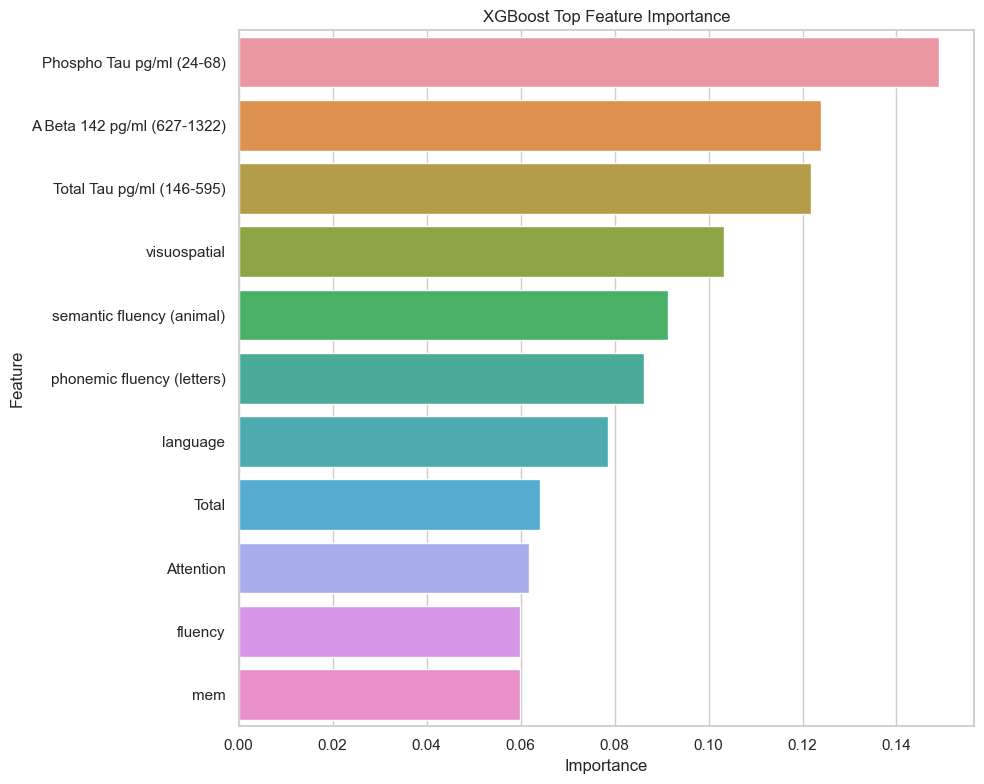

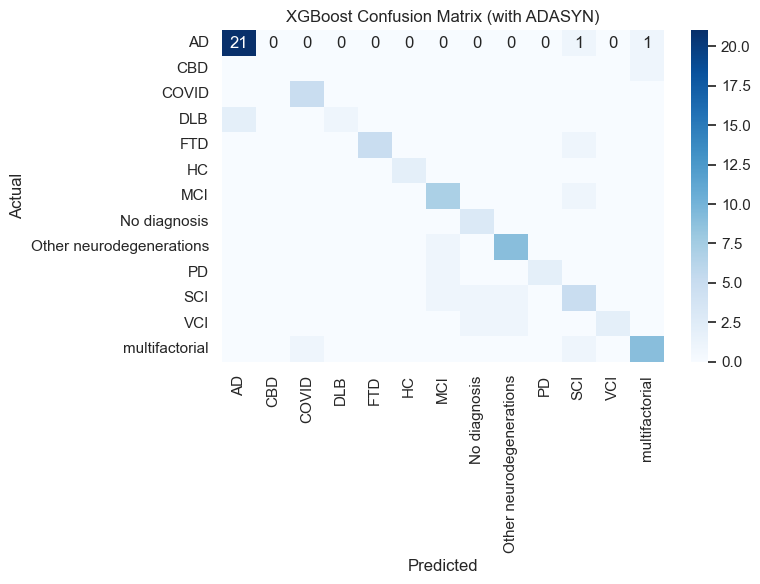

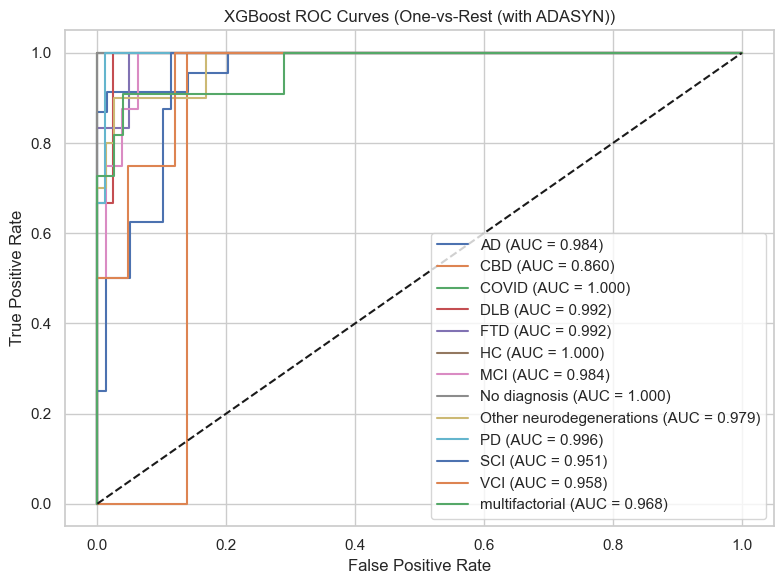

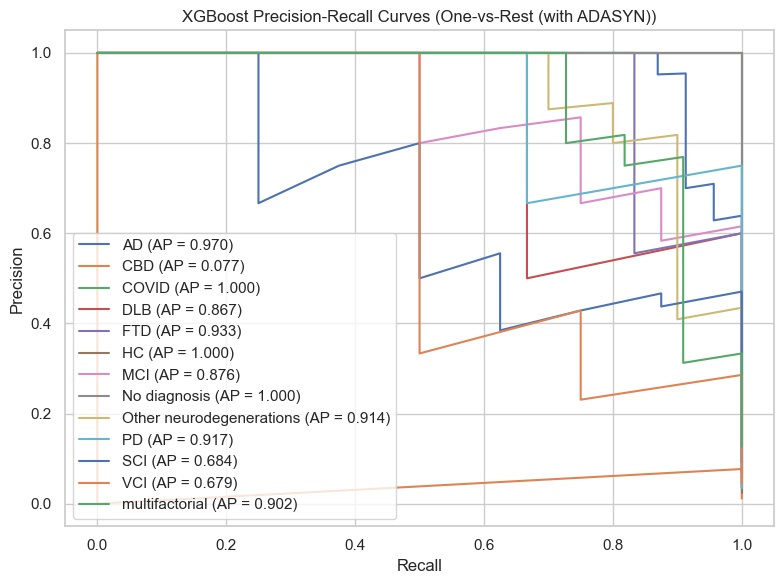


XGBoost model training and evaluation complete.

Building RandomForest Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]
Cross-validation accuracy (default params): 0.9674 ± 0.0075

Performing hyperparameter tuning...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best cross-validation score: 0.9777

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.8046
ROC AU

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

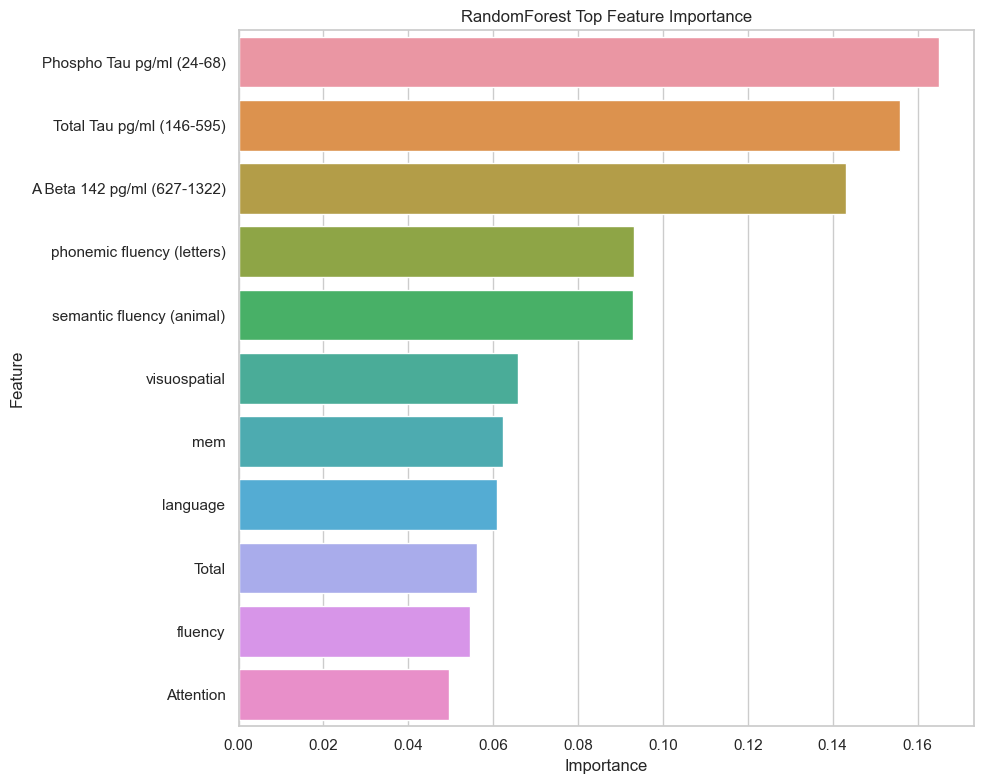

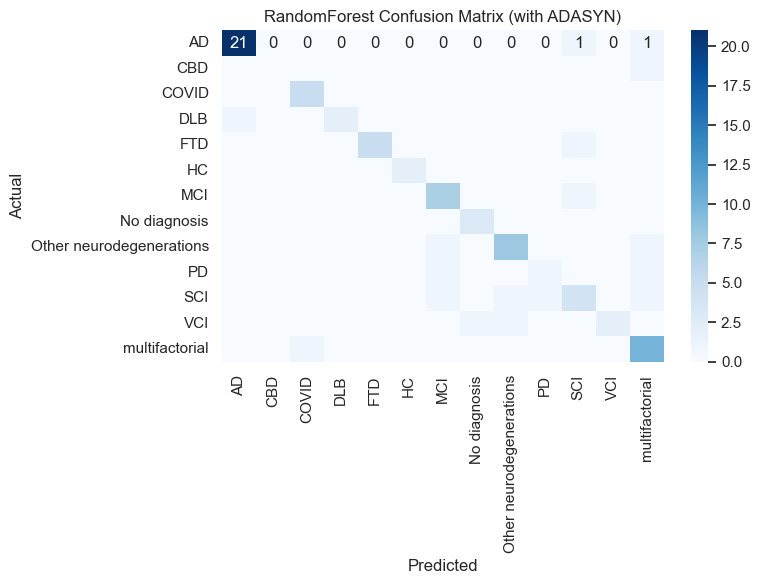

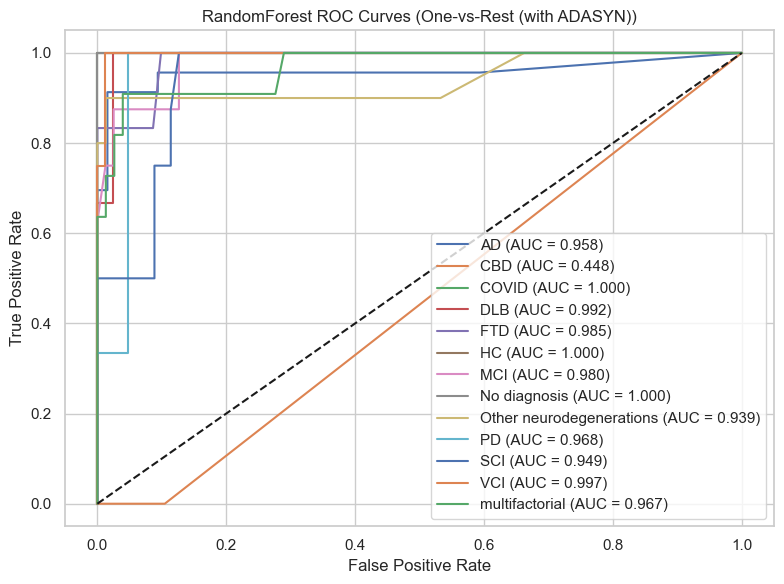

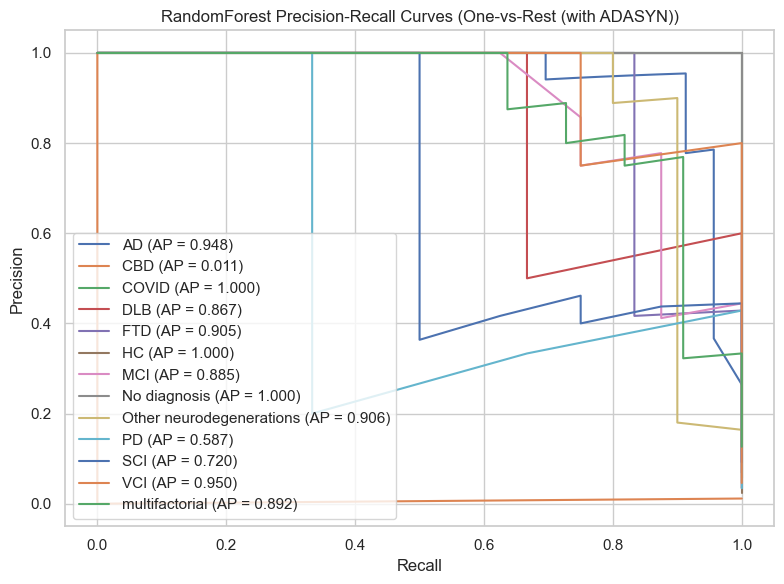


RandomForest model training and evaluation complete.

Building DecisionTree Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]
Cross-validation accuracy (default params): 0.8806 ± 0.0139

Performing hyperparameter tuning...
Fitting 5 folds for each of 90 candidates, totalling 450 fits
Best parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best cross-validation score: 0.8892

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.7471
ROC AUC: 0.8309

Con

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

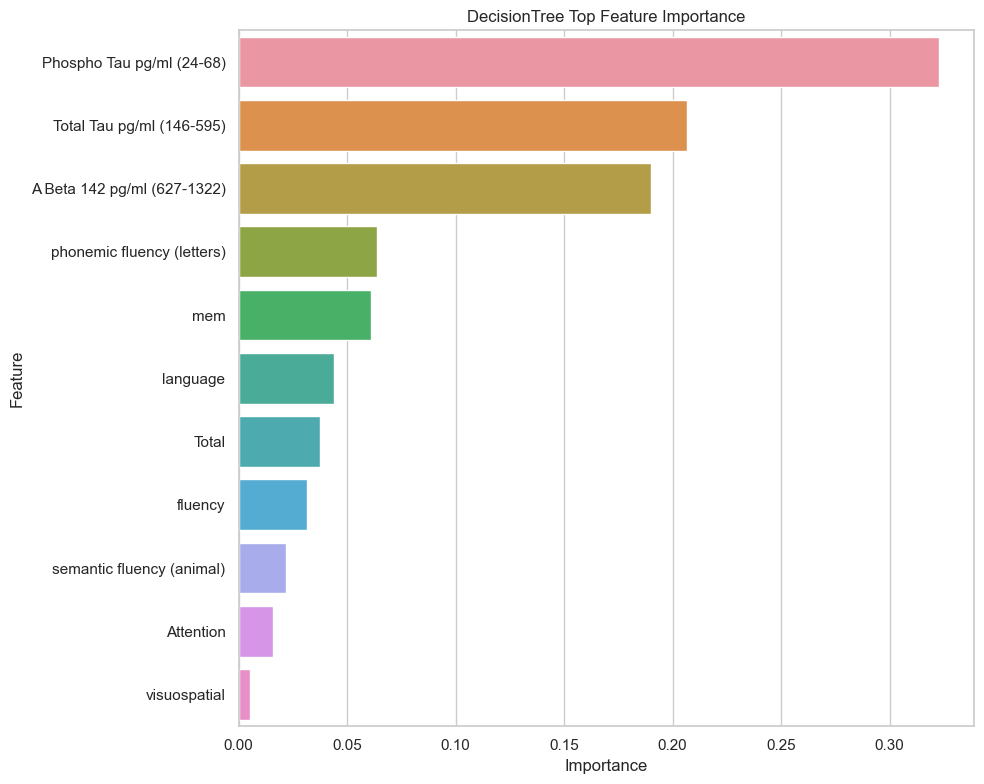

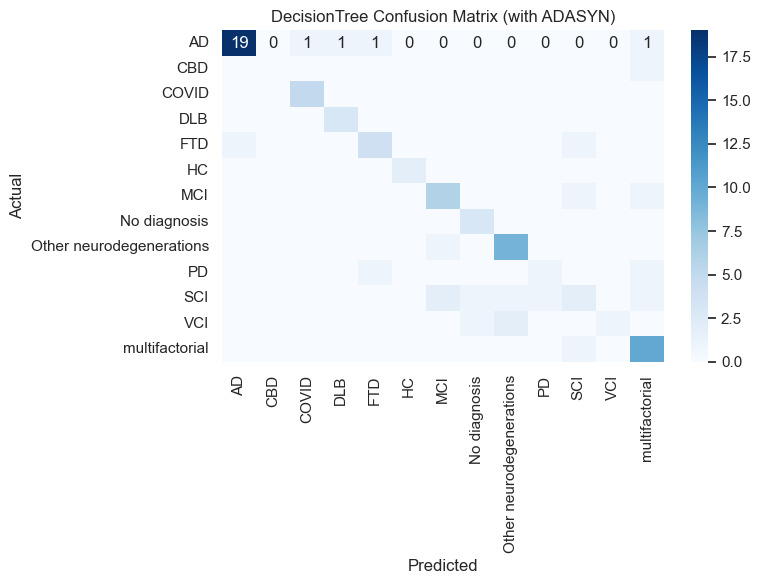

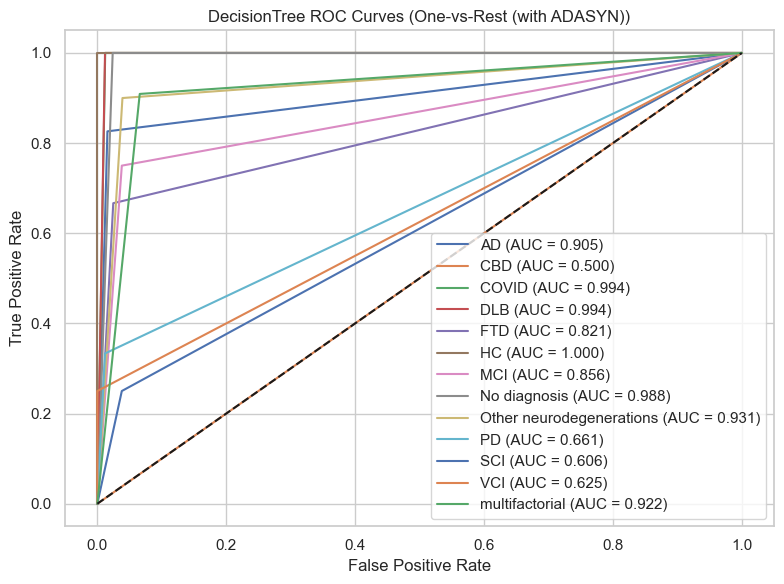

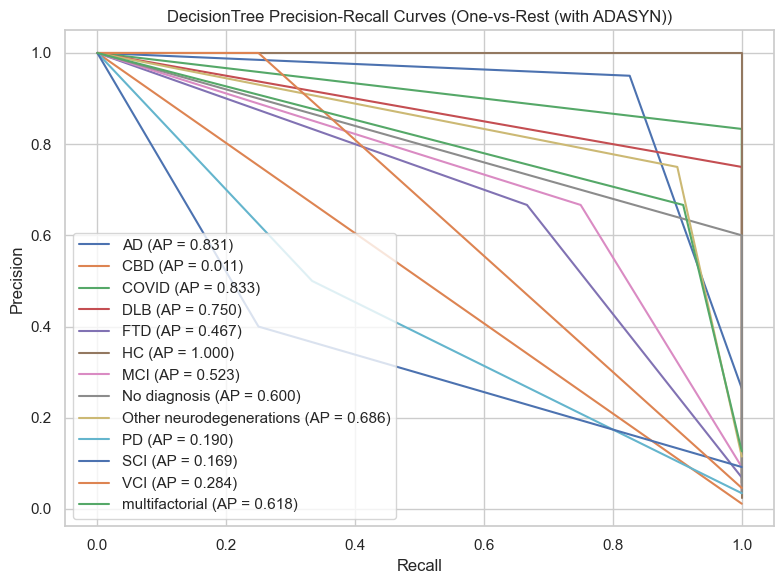


DecisionTree model training and evaluation complete.

Building SVM Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]
Cross-validation accuracy (default params): 0.8582 ± 0.0237

Performing hyperparameter tuning...
Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters: {'C': 100, 'gamma': 'scale', 'kernel': 'rbf', 'probability': True}
Best cross-validation score: 0.9819

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.7586
ROC AUC: 0.9575

Confusion Matrix:
[[20  0  0  0  0

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

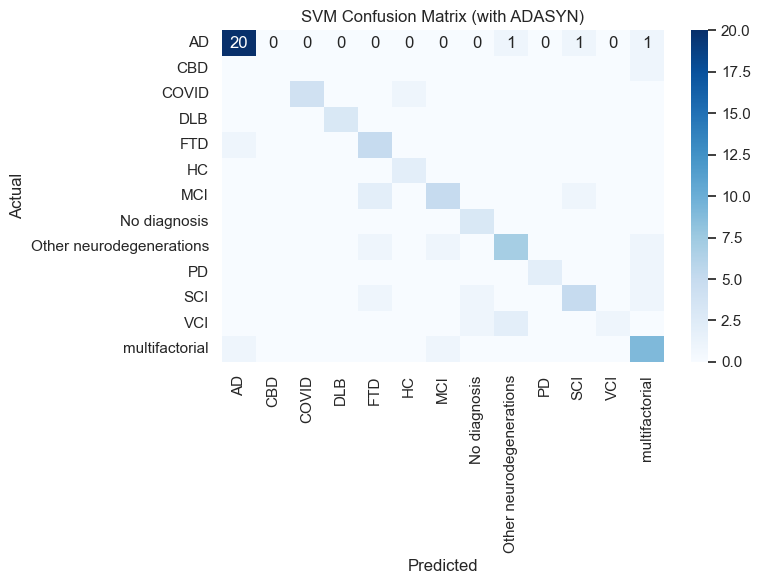

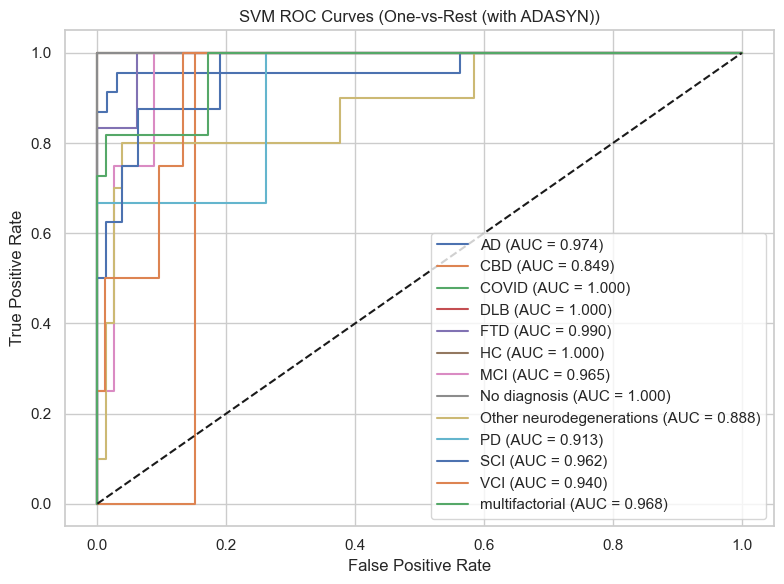

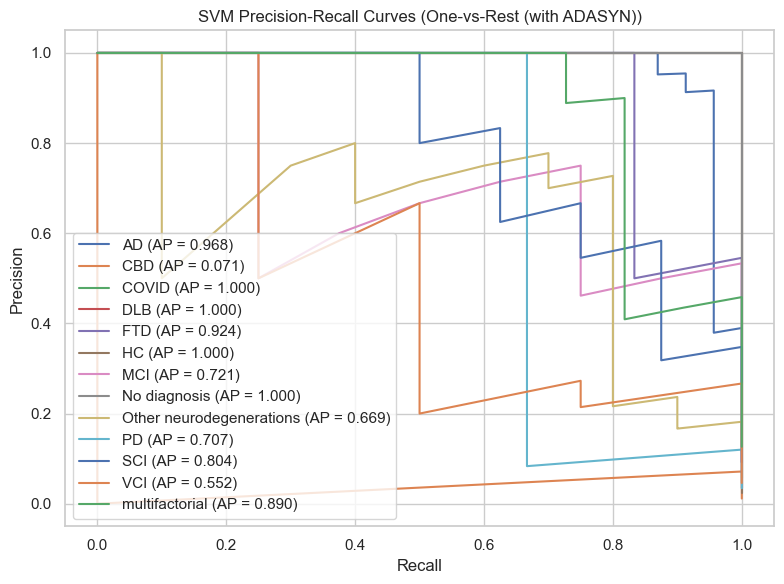


SVM model training and evaluation complete.

Building NeuralNetwork Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]
Cross-validation accuracy (default params): 0.7440 ± 0.0258

Performing hyperparameter tuning...
Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'solver': 'adam'}
Best cross-validation score: 0.8256

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.735

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

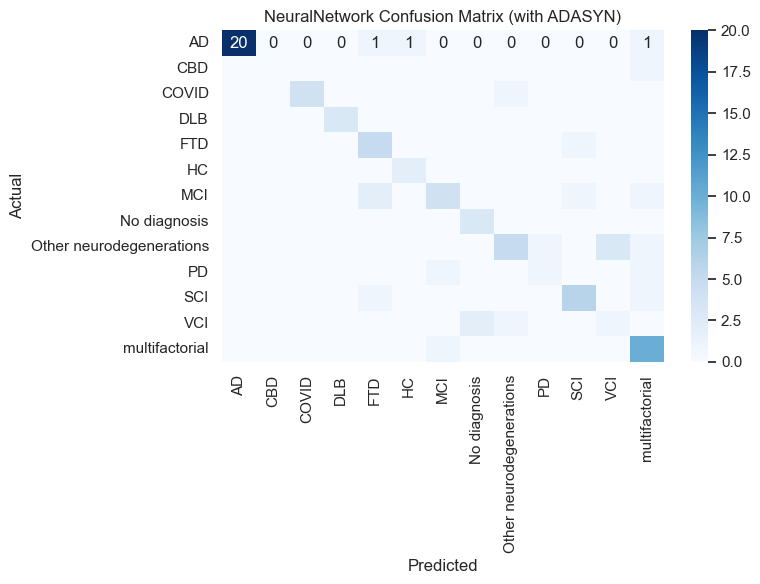

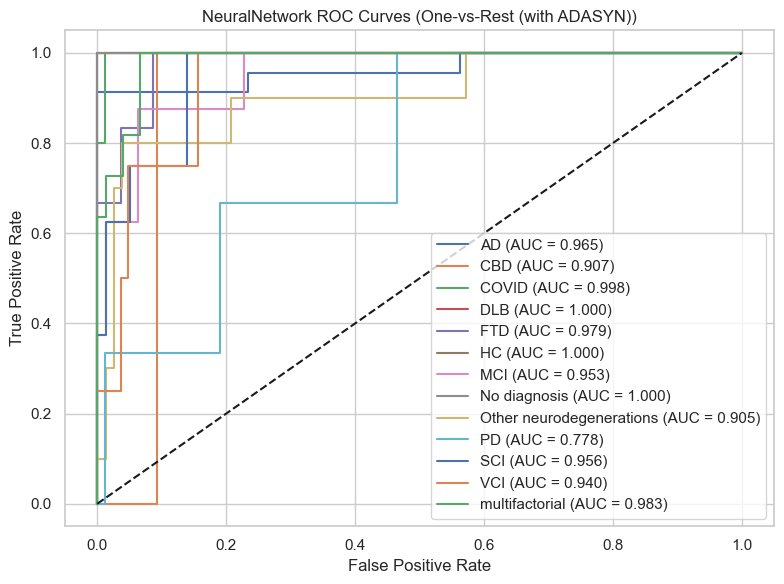

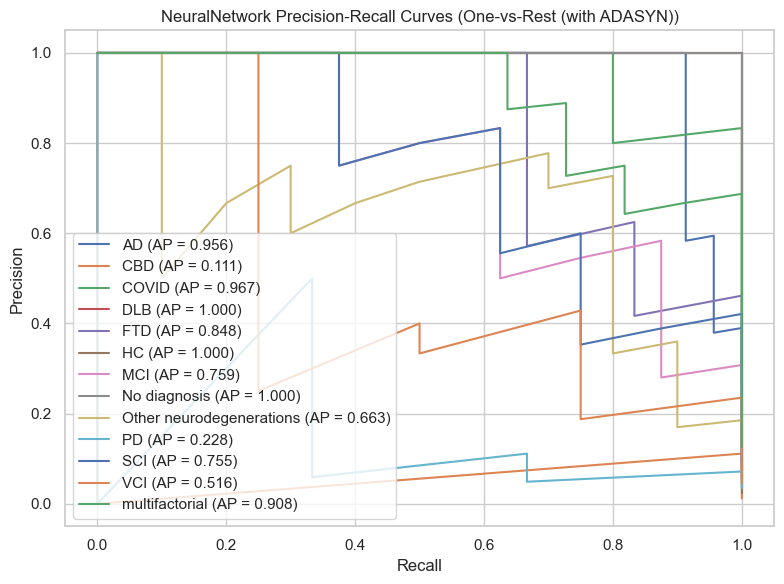


NeuralNetwork model training and evaluation complete.

Building KNN Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]
Cross-validation accuracy (default params): 0.8814 ± 0.0164

Performing hyperparameter tuning...
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'metric': 'manhattan', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best cross-validation score: 0.9510

Training final model with best parameters...

Test Set Performance:
Accuracy: 0.7011
ROC AUC: 0.8706

Confusion Matrix:
[[17  0  

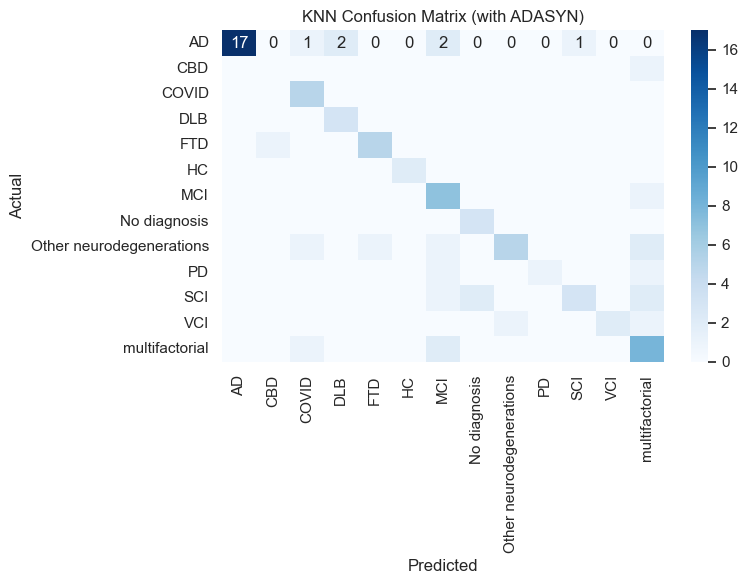

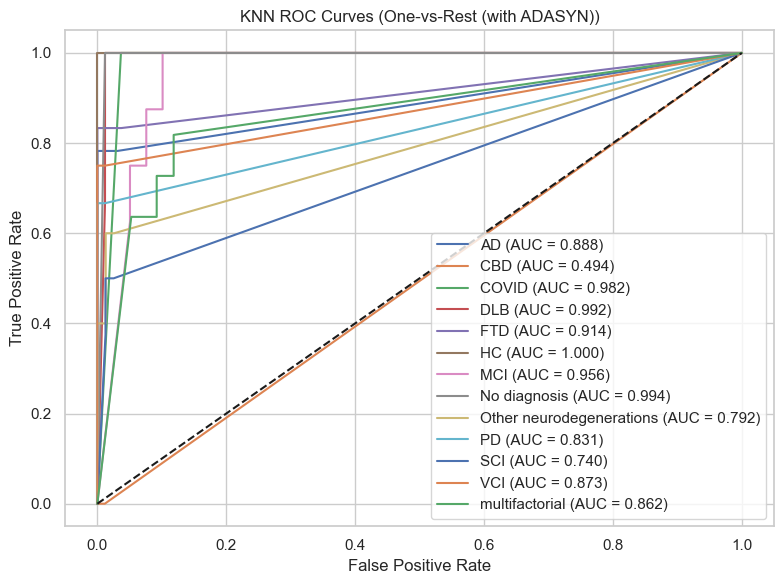

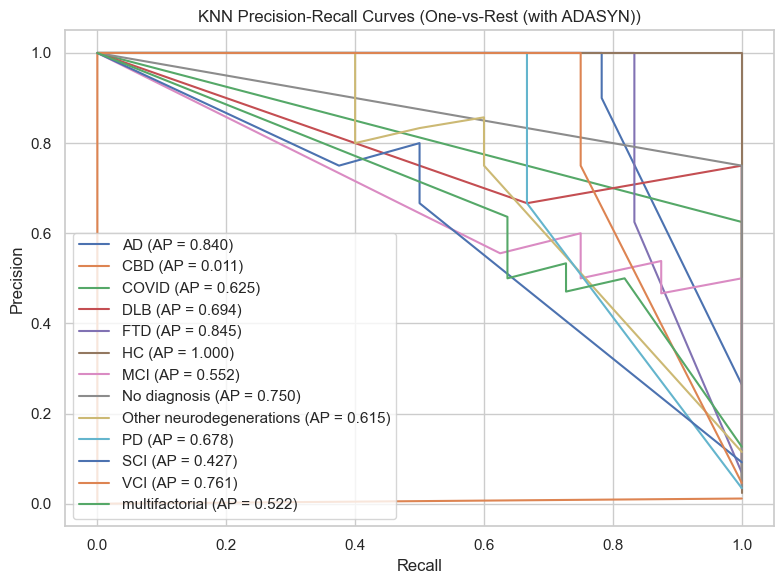


KNN model training and evaluation complete.

Building StackingEnsemble Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]
Cross-validation accuracy: 0.9716 ± 0.0080

Training final stacking ensemble model...

Test Set Performance:
Accuracy: 0.8161
ROC AUC: 0.9708

Confusion Matrix:
[[21  0  0  0  0  0  0  0  0  0  1  0  1]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  1]
 [ 0  0  5  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  0  2  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  5  0  0  0  0  0  1  0  0]
 [ 0  0  0  0  0  2  0  0  0  0  0  0  0]

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

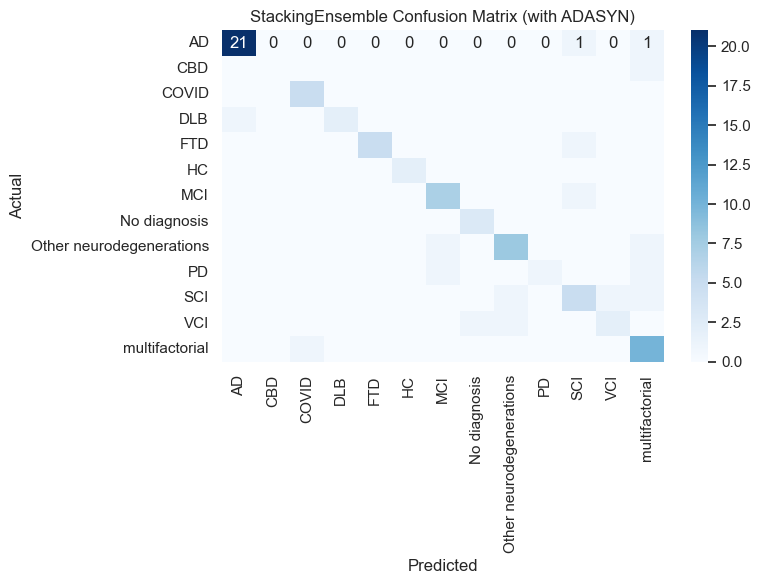

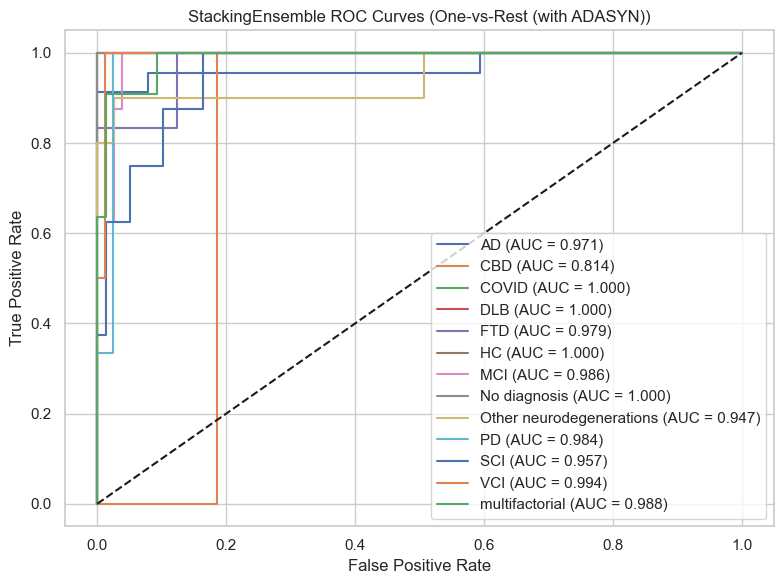

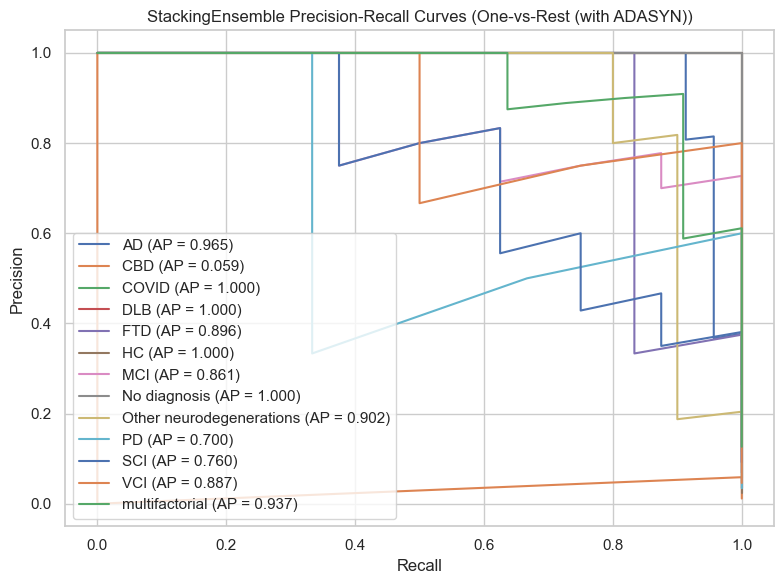


StackingEnsemble model training and evaluation complete.

Building GaussianNaiveBayes Model
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]
Cross-validation accuracy (default params): 0.6667 ± 0.0177

Performing hyperparameter tuning...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters: {'var_smoothing': 1e-09}
Best cross-validation score: 0.6667

Training final model on full dataset...

Test Set Performance:
Accuracy: 0.4828
ROC AUC: 0.9164

Confusion Matrix:
[[ 9  0  0 10  1  0  0  0  2  0  1  0  0]
 [ 0

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

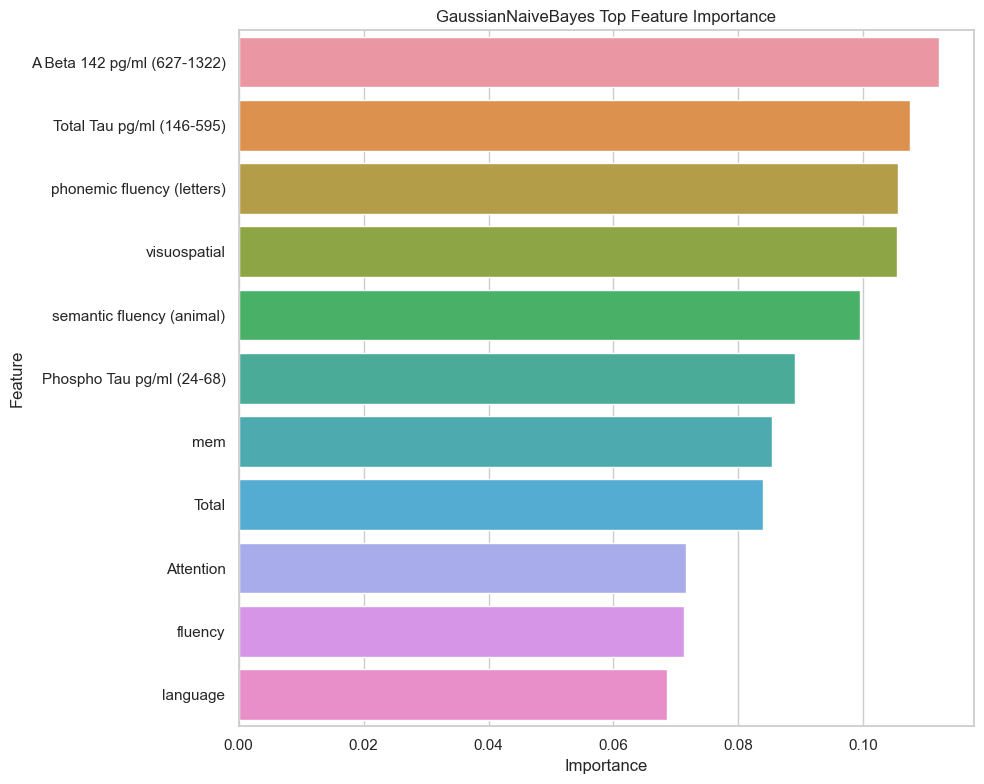

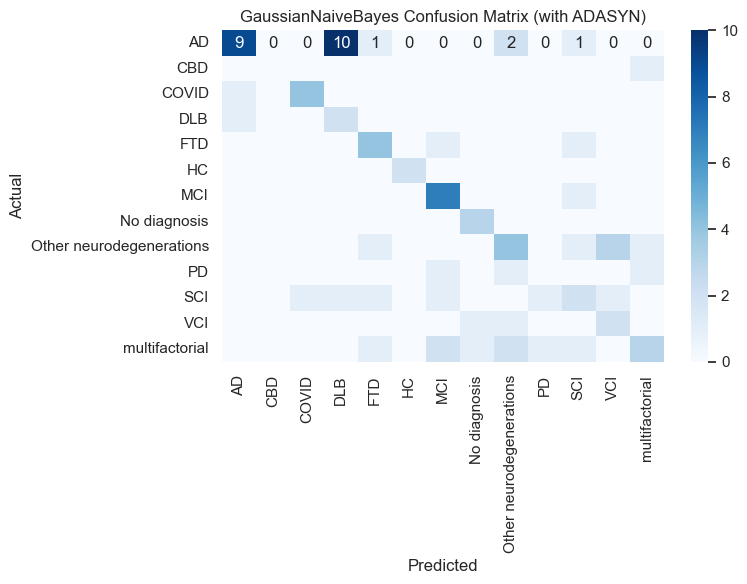

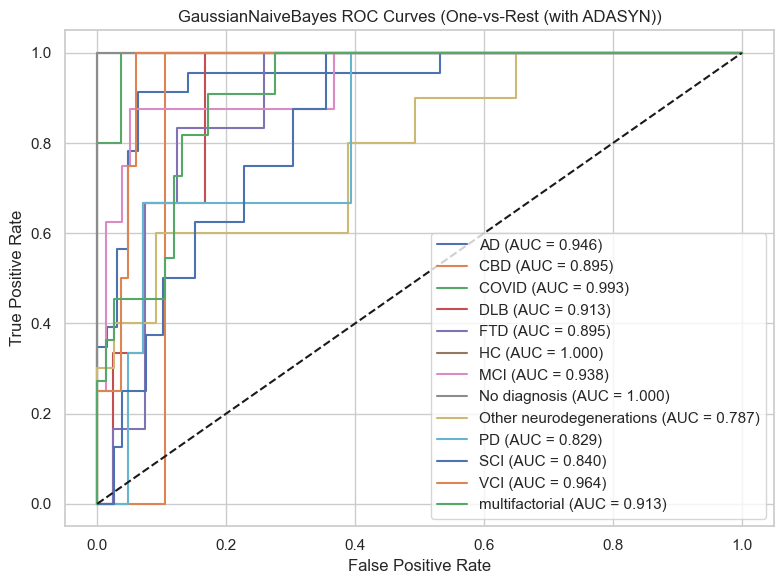

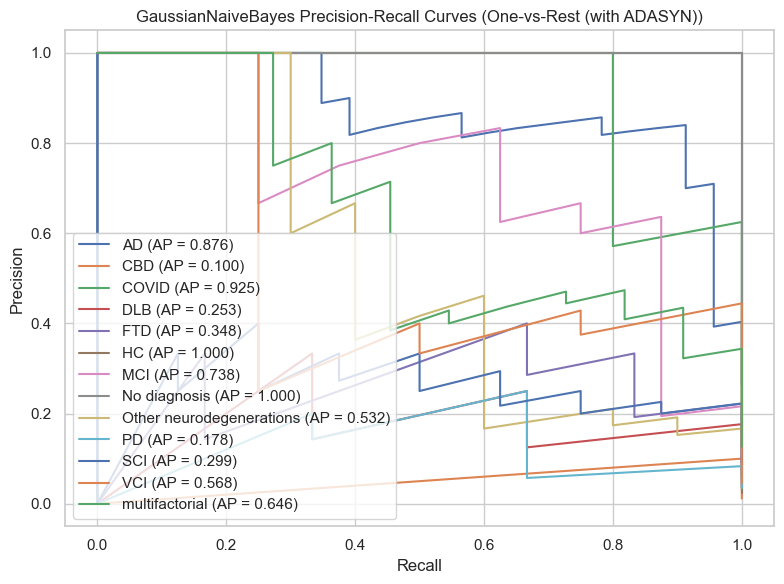


GaussianNaiveBayes model training and evaluation complete.

Building SelfNormalizingNN (SNN) Model with PyTorch
Using device: cpu
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]

Training PyTorch model with early stopping...
Epoch 10/200, Train Loss: 1.3046, Val Loss: 1.0803
Epoch 20/200, Train Loss: 0.9817, Val Loss: 0.7620
Epoch 30/200, Train Loss: 0.7772, Val Loss: 0.5932
Epoch 40/200, Train Loss: 0.6364, Val Loss: 0.5047
Epoch 50/200, Train Loss: 0.5486, Val Loss: 0.3998
Epoch 60/200, Train Loss: 0.5058, Val Loss: 0.3420
Epoch 

/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is",

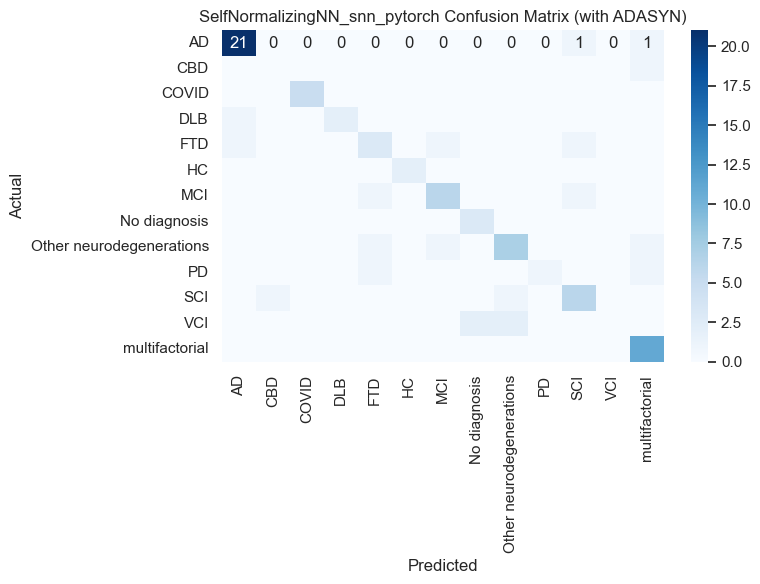

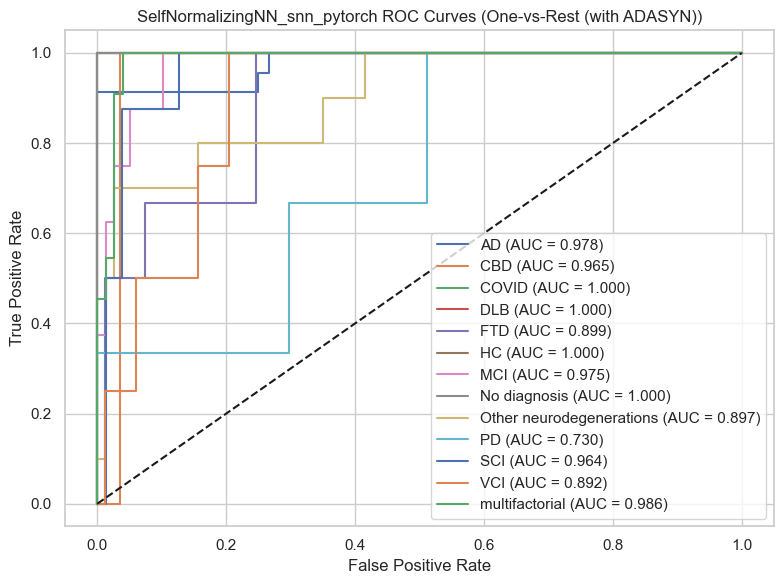

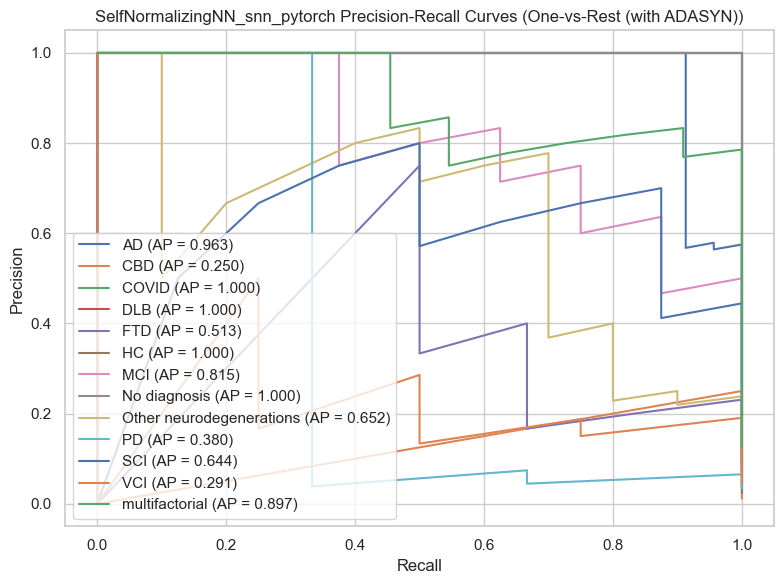

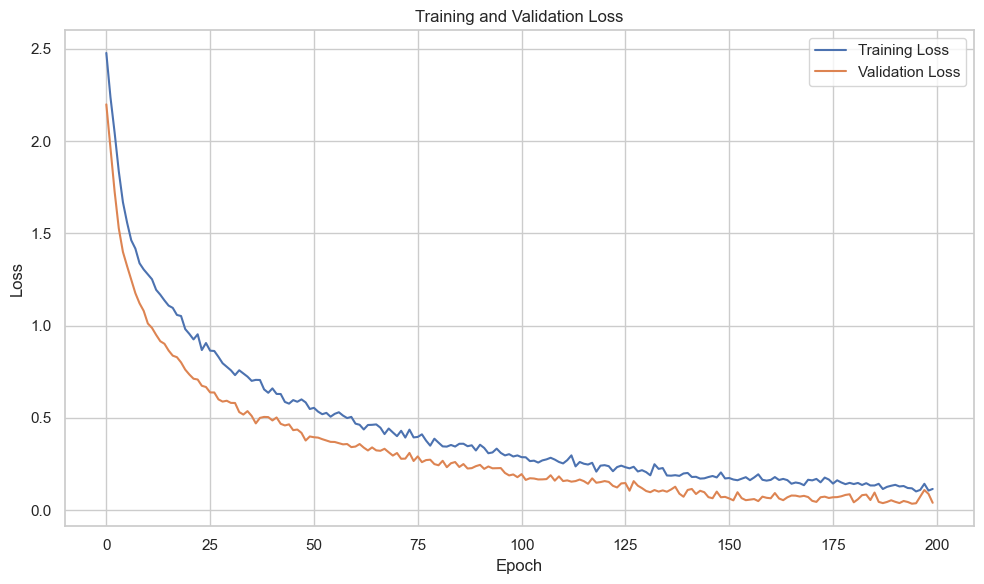


SelfNormalizingNN (snn) PyTorch model training and evaluation complete.

Building AttentionNN (ATT) Model with PyTorch
Using device: cpu
Loaded data with 432 rows and 48 columns
Encoding categorical target: Completed Diagnosis
Classes: ['AD' 'CBD' 'COVID' 'DLB' 'FTD' 'HC' 'MCI' 'No diagnosis'
 'Other neurodegenerations' 'PD' 'SCI' 'VCI' 'multifactorial']
Training set size: 345, Test set size: 87
Class distribution in training set: [89  4 22 13 26  7 30 13 39 11 34 16 41]
Detected class imbalance (ratio: 22.25). Applying ADASYN.
After ADASYN - Training set size: 1164
Class distribution after ADASYN: [89 89 90 89 88 88 96 88 81 88 91 94 93]

Training PyTorch model with early stopping...
Epoch 10/200, Train Loss: 1.7644, Val Loss: 1.7442
Epoch 20/200, Train Loss: 1.3643, Val Loss: 1.3579
Epoch 30/200, Train Loss: 1.2596, Val Loss: 1.3366
Epoch 40/200, Train Loss: 1.1785, Val Loss: 1.2407
Epoch 50/200, Train Loss: 1.0875, Val Loss: 1.3519
Epoch 60/200, Train Loss: 0.9719, Val Loss: 1.3123

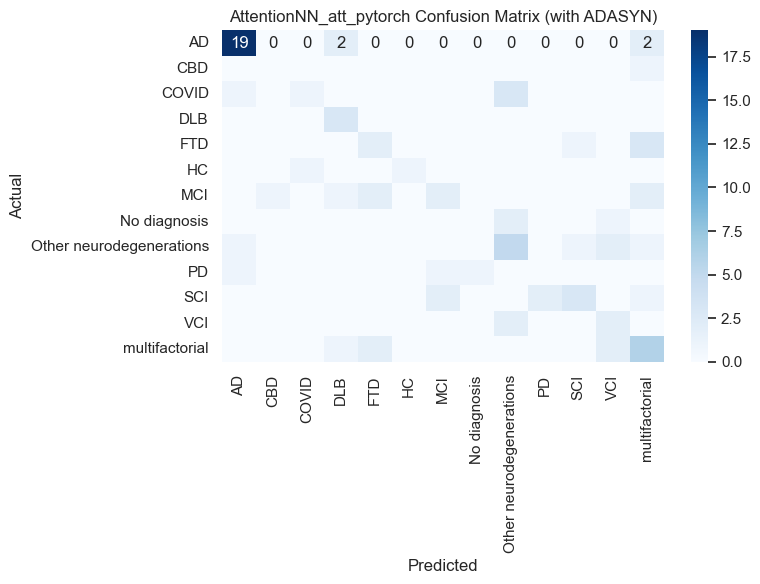

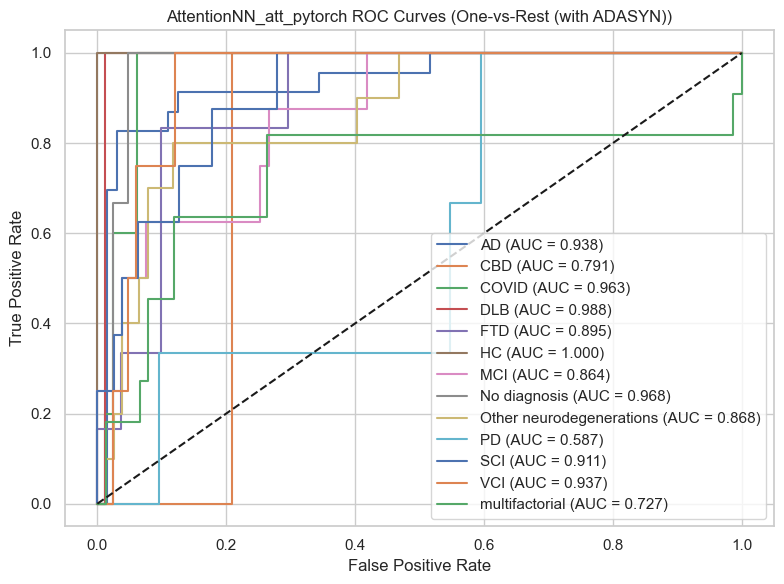

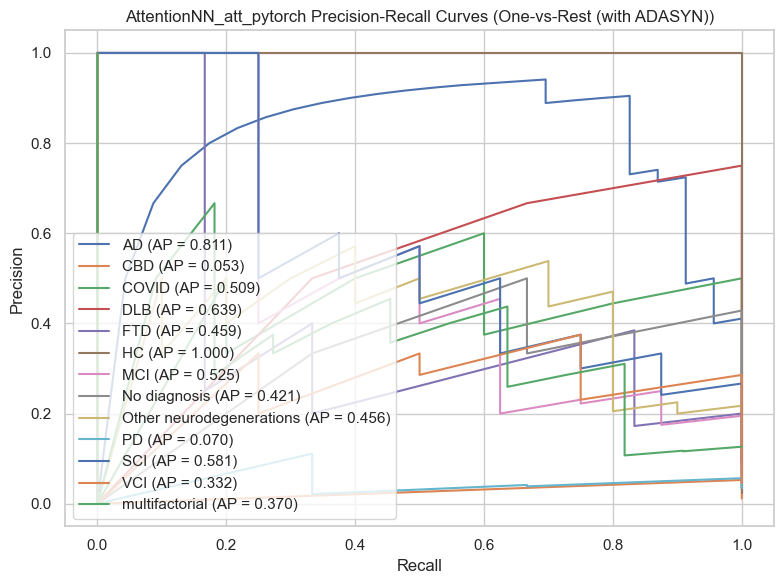

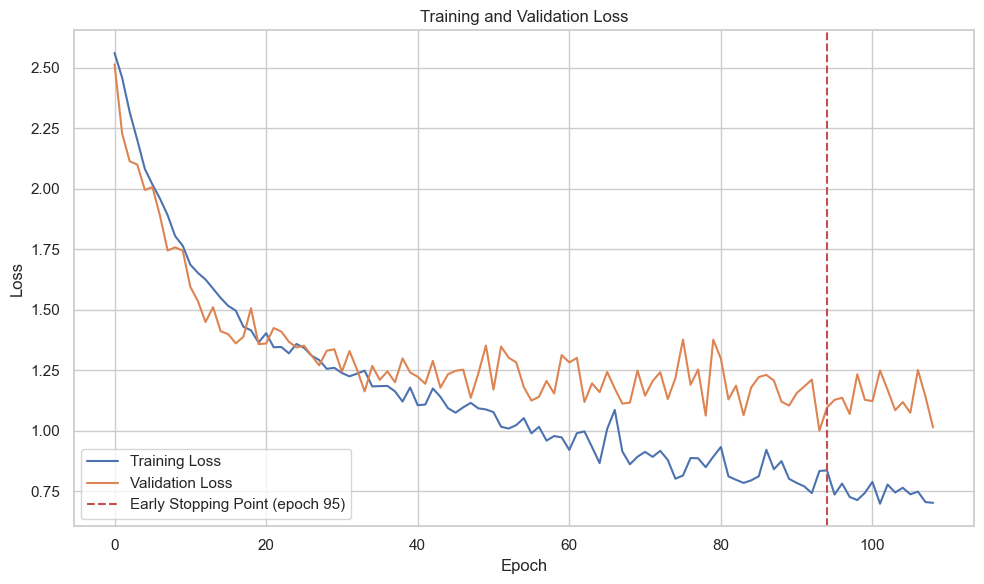


AttentionNN (att) PyTorch model training and evaluation complete.

APPLYING EXPLAINABILITY TECHNIQUES TO ALL MODELS

Analyzing XGBoost...

Applying Explainability Techniques to XGBoost
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

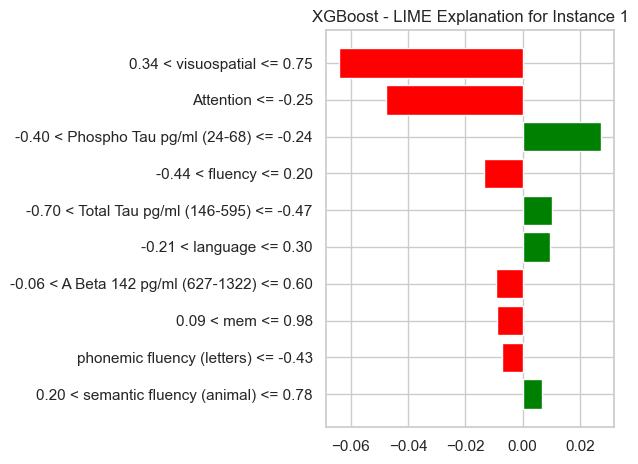

Instance 1:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [7.7730615e-04 8.6027686e-04 3.9066366e-04 1.0751425e-03 1.9382064e-03
 4.5458152e-04 5.4343981e-03 1.5270746e-03 8.8530540e-04 3.6976536e-04
 9.1134064e-04 1.3288665e-03 9.8404711e-01]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0640
    Attention <= -0.25: -0.0477
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0273
    -0.44 < fluency <= 0.20: -0.0136
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0100



<Figure size 1000x600 with 0 Axes>

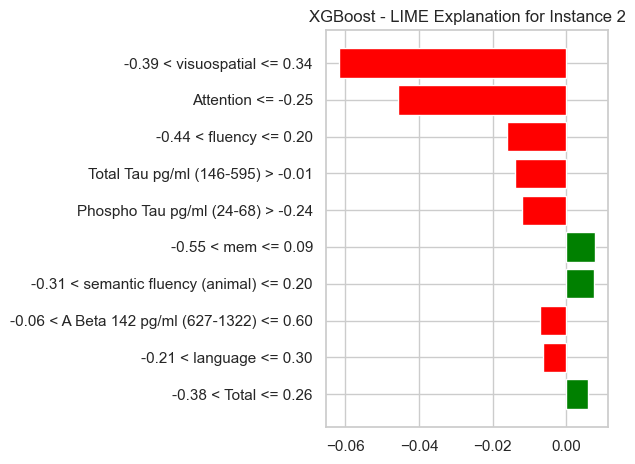

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [8.0573976e-01 2.8618088e-04 5.2486011e-04 2.0624073e-02 4.7339962e-04
 2.3070753e-04 1.4041029e-04 2.3786214e-04 1.7043303e-01 1.4843979e-04
 1.6334141e-04 2.7567137e-04 7.2227657e-04]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0618
    Attention <= -0.25: -0.0458
    -0.44 < fluency <= 0.20: -0.0160
    Total Tau pg/ml (146-595) > -0.01: -0.0140
    Phospho Tau pg/ml (24-68) > -0.24: -0.0120



<Figure size 1000x600 with 0 Axes>

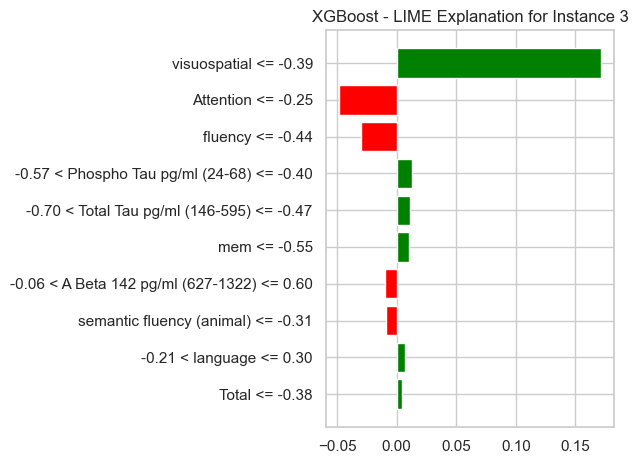

Instance 3:
  True class: PD
  Predicted class: MCI
  Prediction probabilities: [0.01812015 0.00596479 0.00289166 0.00798965 0.23015822 0.00336478
 0.54235333 0.00338847 0.01686152 0.04602469 0.01741733 0.09467048
 0.01079492]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.1715
    Attention <= -0.25: -0.0483
    fluency <= -0.44: -0.0301
    -0.57 < Phospho Tau pg/ml (24-68) <= -0.40: 0.0131
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0108



<Figure size 1000x600 with 0 Axes>

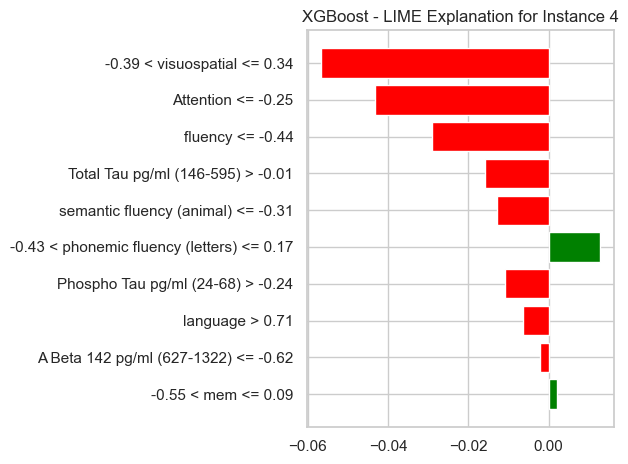

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [8.73845994e-01 3.08111077e-04 6.34304190e-04 1.17043585e-01
 4.84541897e-03 3.55640572e-04 2.41070520e-04 1.90212057e-04
 1.26954273e-03 1.62340206e-04 4.07952408e-04 4.75404988e-04
 2.20420581e-04]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0568
    Attention <= -0.25: -0.0431
    fluency <= -0.44: -0.0290
    Total Tau pg/ml (146-595) > -0.01: -0.0160
    semantic fluency (animal) <= -0.31: -0.0128



<Figure size 1000x600 with 0 Axes>

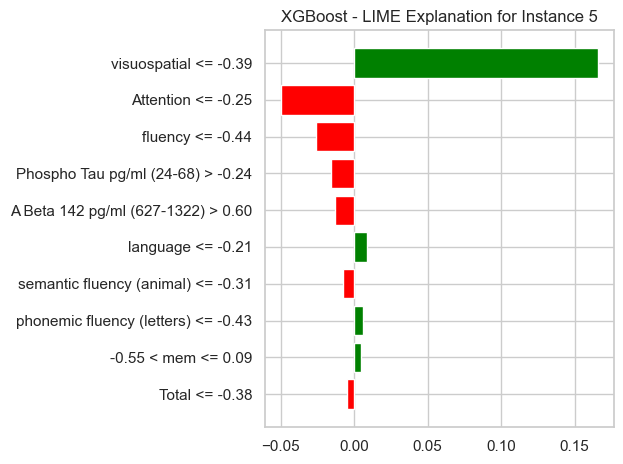

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [1.3183372e-04 1.4474697e-04 5.1100837e-05 5.0168188e-04 1.8696778e-02
 5.9461679e-05 1.0805529e-04 3.0648604e-04 3.5094575e-03 4.7487914e-04
 9.9014619e-04 2.4852468e-04 9.7477686e-01]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.1660
    Attention <= -0.25: -0.0495
    fluency <= -0.44: -0.0262
    Phospho Tau pg/ml (24-68) > -0.24: -0.0160
    A Beta 142 pg/ml (627-1322) > 0.60: -0.0129

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


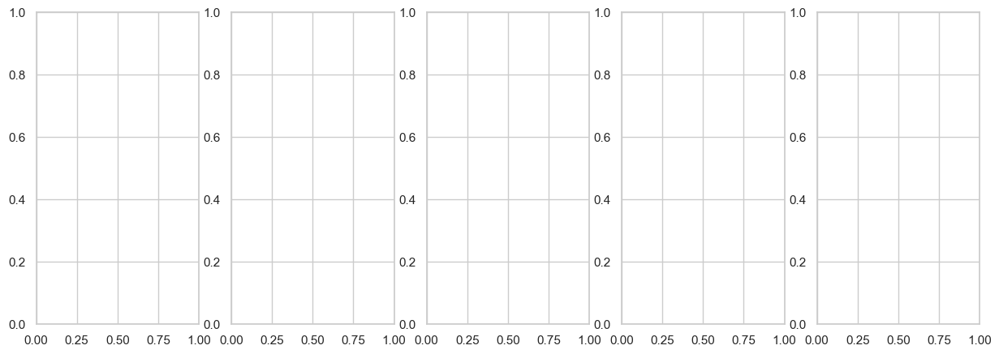

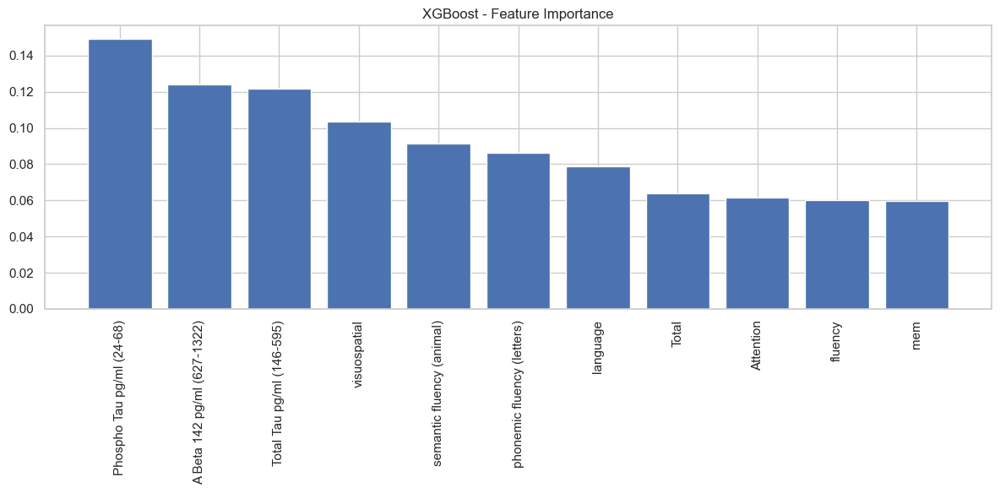

Top 10 Most Important Features:
                       Feature  Importance
0    Phospho Tau pg/ml (24-68)    0.149043
1  A Beta 142 pg/ml (627-1322)    0.123839
2    Total Tau pg/ml (146-595)    0.121911
3                 visuospatial    0.103309
4    semantic fluency (animal)    0.091381
5   phonemic fluency (letters)    0.086301
6                     language    0.078653
7                        Total    0.064060
8                    Attention    0.061745
9                      fluency    0.059923
Feature importance extraction complete.

Creating comprehensive explainability report...


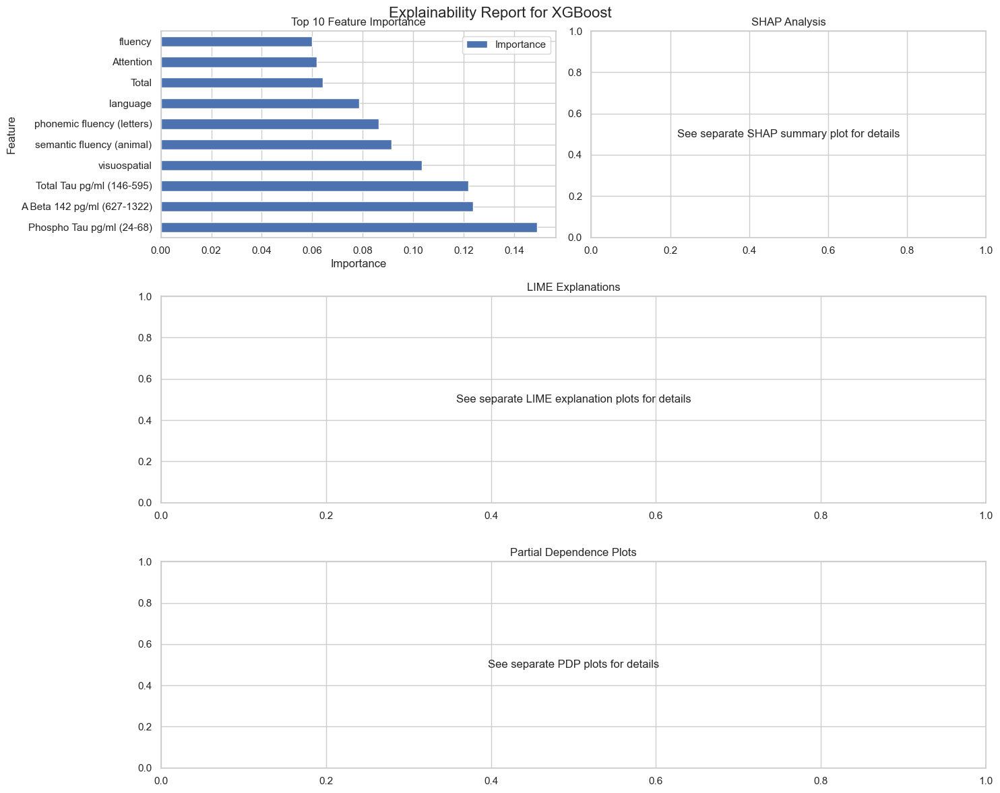

Explainability report complete.
Explainability analysis for XGBoost complete.

Analyzing RandomForest...

Applying Explainability Techniques to RandomForest
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

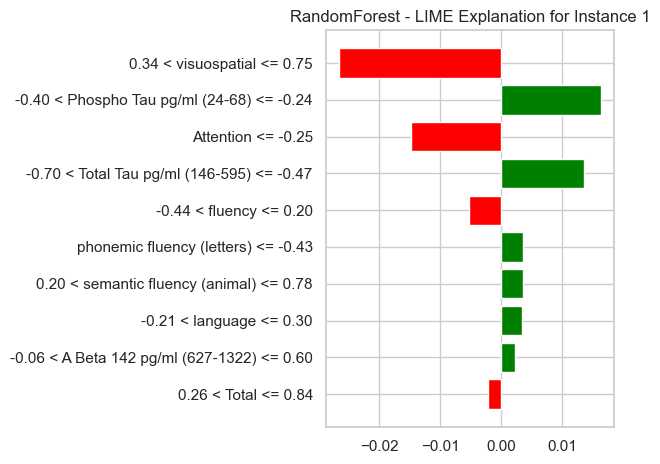

Instance 1:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [0.02 0.   0.   0.01 0.01 0.   0.08 0.01 0.01 0.   0.01 0.01 0.84]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0265
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0163
    Attention <= -0.25: -0.0147
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0136
    -0.44 < fluency <= 0.20: -0.0052



<Figure size 1000x600 with 0 Axes>

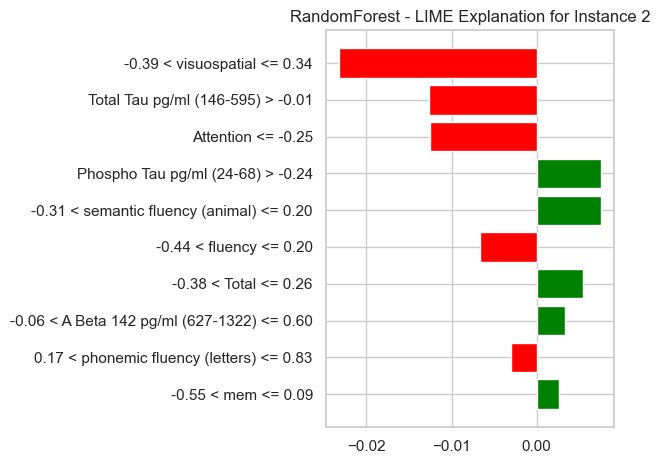

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [0.55 0.01 0.02 0.05 0.04 0.   0.03 0.   0.28 0.   0.01 0.01 0.  ]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0232
    Total Tau pg/ml (146-595) > -0.01: -0.0127
    Attention <= -0.25: -0.0126
    Phospho Tau pg/ml (24-68) > -0.24: 0.0075
    -0.31 < semantic fluency (animal) <= 0.20: 0.0075



<Figure size 1000x600 with 0 Axes>

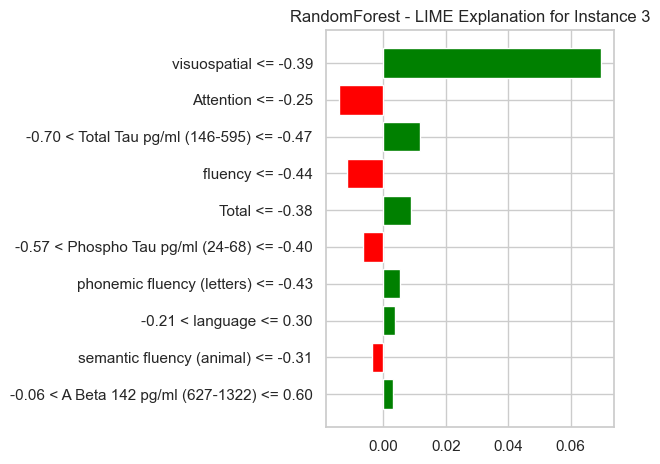

Instance 3:
  True class: PD
  Predicted class: MCI
  Prediction probabilities: [0.   0.   0.   0.01 0.16 0.   0.53 0.   0.04 0.13 0.03 0.07 0.03]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0697
    Attention <= -0.25: -0.0141
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0118
    fluency <= -0.44: -0.0116
    Total <= -0.38: 0.0088



<Figure size 1000x600 with 0 Axes>

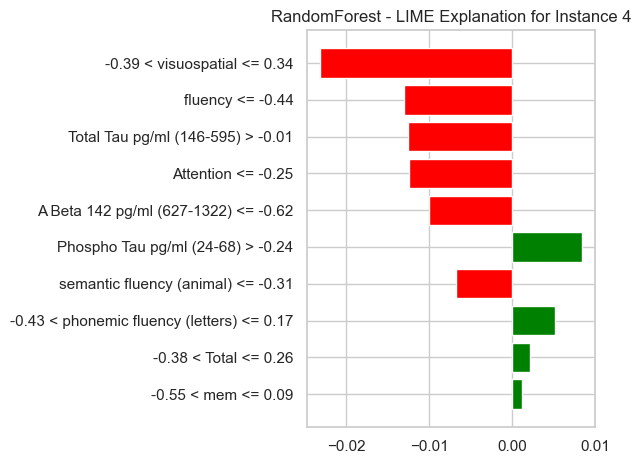

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [0.69 0.   0.02 0.26 0.01 0.   0.02 0.   0.   0.   0.   0.   0.  ]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0232
    fluency <= -0.44: -0.0131
    Total Tau pg/ml (146-595) > -0.01: -0.0126
    Attention <= -0.25: -0.0125
    A Beta 142 pg/ml (627-1322) <= -0.62: -0.0100



<Figure size 1000x600 with 0 Axes>

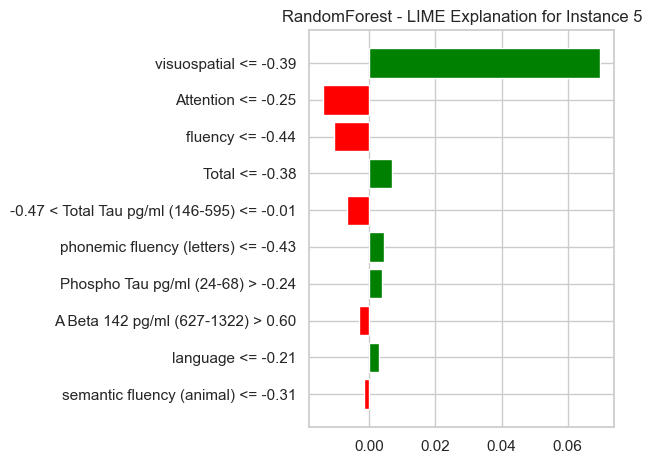

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [0.   0.   0.   0.   0.01 0.   0.   0.   0.01 0.   0.01 0.   0.97]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0698
    Attention <= -0.25: -0.0139
    fluency <= -0.44: -0.0106
    Total <= -0.38: 0.0068
    -0.47 < Total Tau pg/ml (146-595) <= -0.01: -0.0066

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


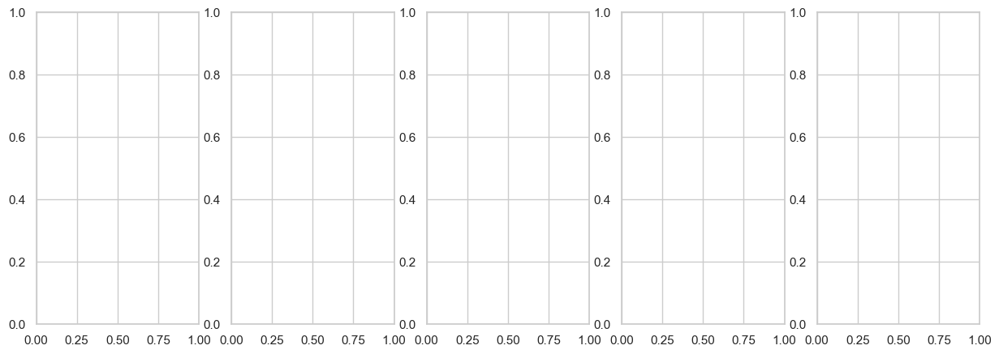

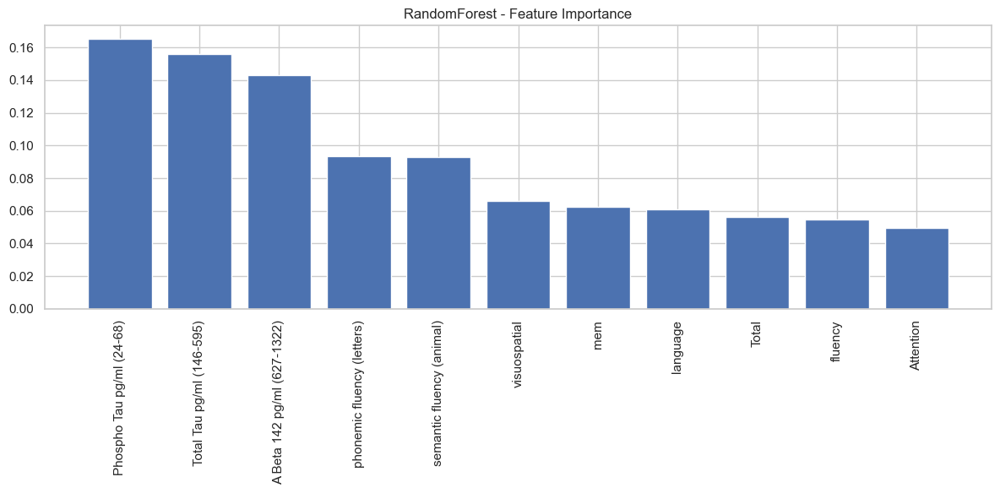

Top 10 Most Important Features:
                       Feature  Importance
0    Phospho Tau pg/ml (24-68)    0.165054
1    Total Tau pg/ml (146-595)    0.155956
2  A Beta 142 pg/ml (627-1322)    0.143226
3   phonemic fluency (letters)    0.093263
4    semantic fluency (animal)    0.092968
5                 visuospatial    0.065955
6                          mem    0.062398
7                     language    0.060968
8                        Total    0.056070
9                      fluency    0.054479
Feature importance extraction complete.

Creating comprehensive explainability report...


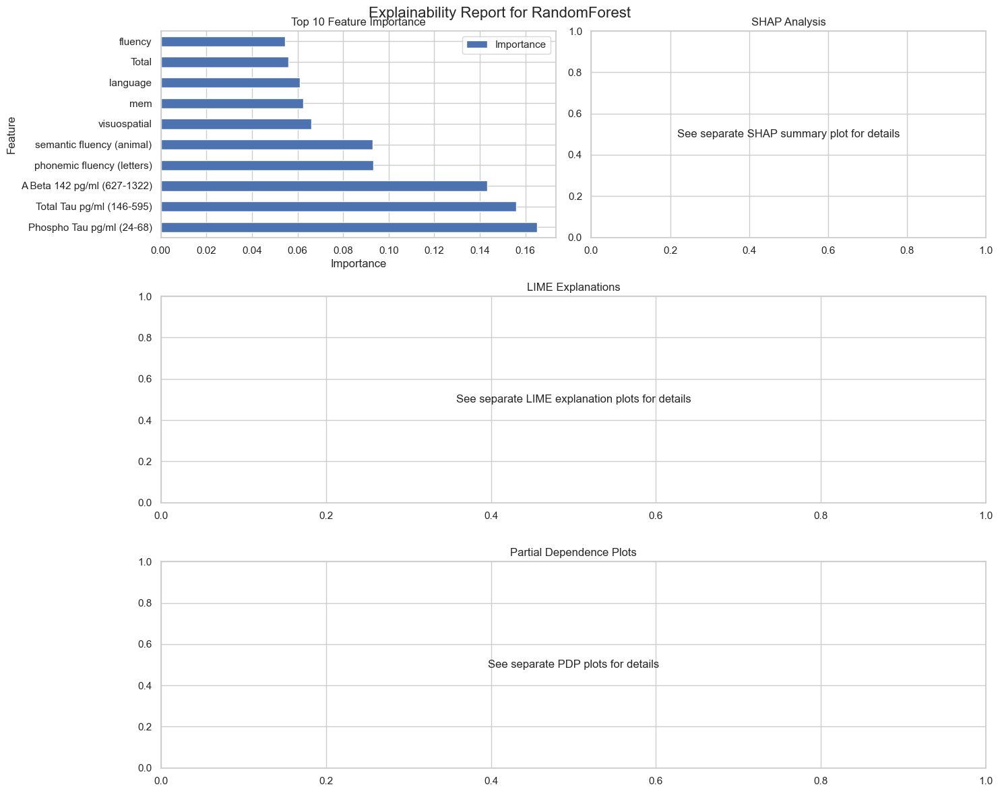

Explainability report complete.
Explainability analysis for RandomForest complete.

Analyzing DecisionTree...

Applying Explainability Techniques to DecisionTree
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

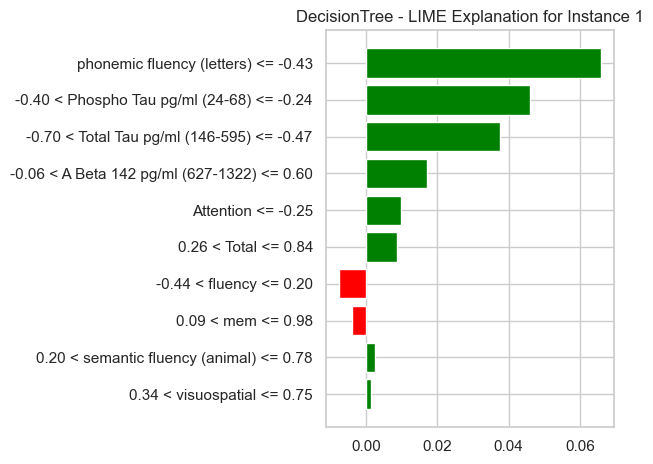

Instance 1:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
  Top features supporting prediction:
    phonemic fluency (letters) <= -0.43: 0.0658
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0460
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0375
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0171
    Attention <= -0.25: 0.0099



<Figure size 1000x600 with 0 Axes>

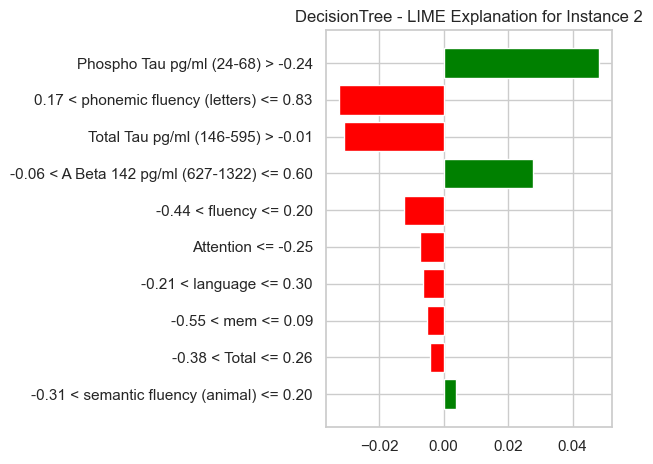

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  Top features supporting prediction:
    Phospho Tau pg/ml (24-68) > -0.24: 0.0484
    0.17 < phonemic fluency (letters) <= 0.83: -0.0325
    Total Tau pg/ml (146-595) > -0.01: -0.0310
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0276
    -0.44 < fluency <= 0.20: -0.0122



<Figure size 1000x600 with 0 Axes>

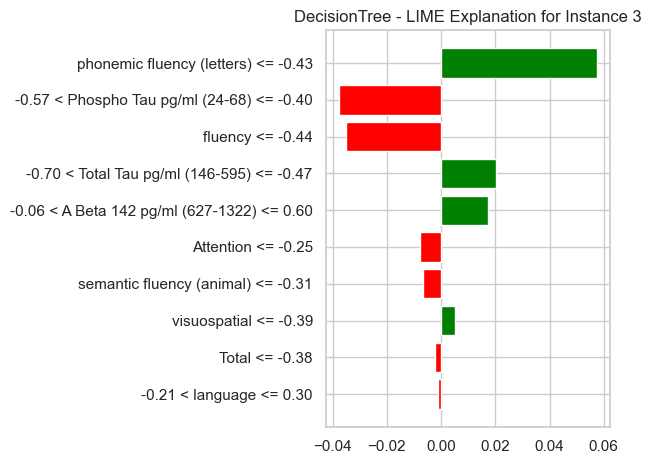

Instance 3:
  True class: PD
  Predicted class: FTD
  Prediction probabilities: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
  Top features supporting prediction:
    phonemic fluency (letters) <= -0.43: 0.0576
    -0.57 < Phospho Tau pg/ml (24-68) <= -0.40: -0.0376
    fluency <= -0.44: -0.0352
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0203
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0173



<Figure size 1000x600 with 0 Axes>

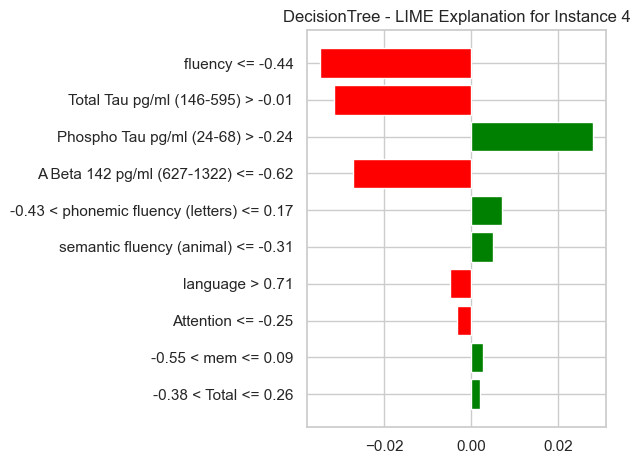

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  Top features supporting prediction:
    fluency <= -0.44: -0.0346
    Total Tau pg/ml (146-595) > -0.01: -0.0315
    Phospho Tau pg/ml (24-68) > -0.24: 0.0279
    A Beta 142 pg/ml (627-1322) <= -0.62: -0.0271
    -0.43 < phonemic fluency (letters) <= 0.17: 0.0071



<Figure size 1000x600 with 0 Axes>

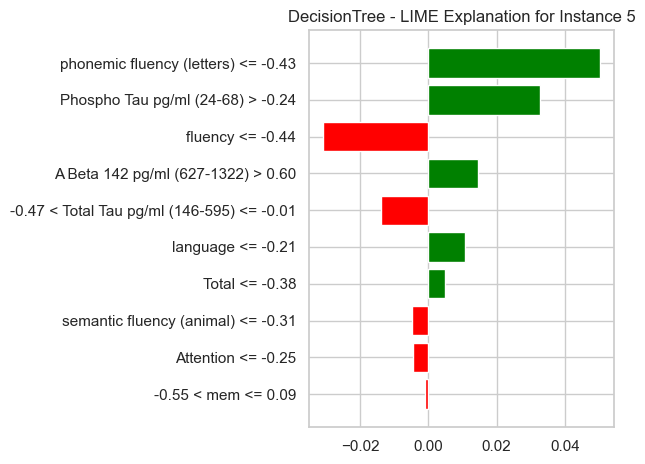

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
  Top features supporting prediction:
    phonemic fluency (letters) <= -0.43: 0.0503
    Phospho Tau pg/ml (24-68) > -0.24: 0.0327
    fluency <= -0.44: -0.0307
    A Beta 142 pg/ml (627-1322) > 0.60: 0.0147
    -0.47 < Total Tau pg/ml (146-595) <= -0.01: -0.0138

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


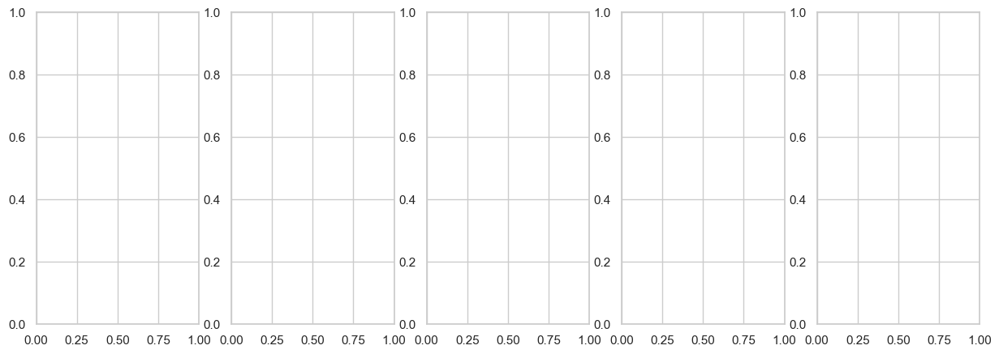

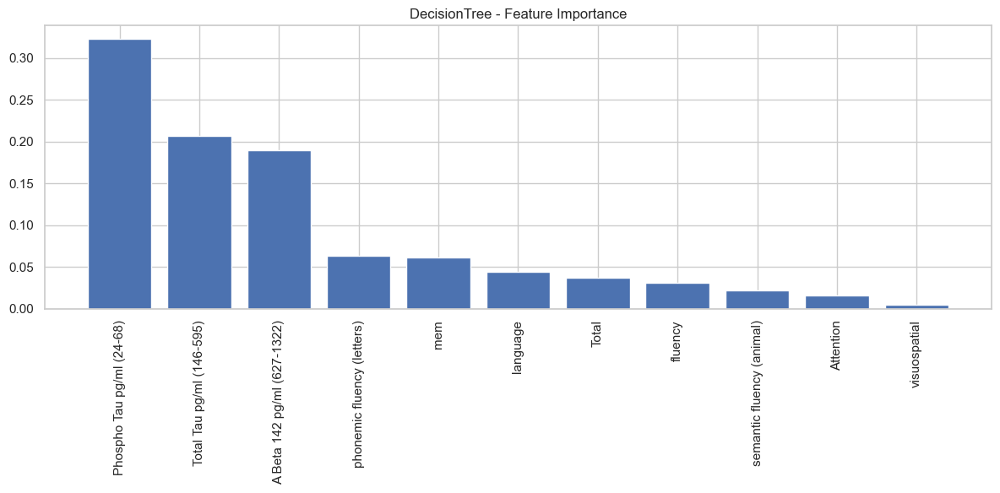

Top 10 Most Important Features:
                       Feature  Importance
0    Phospho Tau pg/ml (24-68)    0.322761
1    Total Tau pg/ml (146-595)    0.206607
2  A Beta 142 pg/ml (627-1322)    0.190098
3   phonemic fluency (letters)    0.063540
4                          mem    0.061161
5                     language    0.044170
6                        Total    0.037372
7                      fluency    0.031451
8    semantic fluency (animal)    0.021733
9                    Attention    0.015914
Feature importance extraction complete.

Creating comprehensive explainability report...


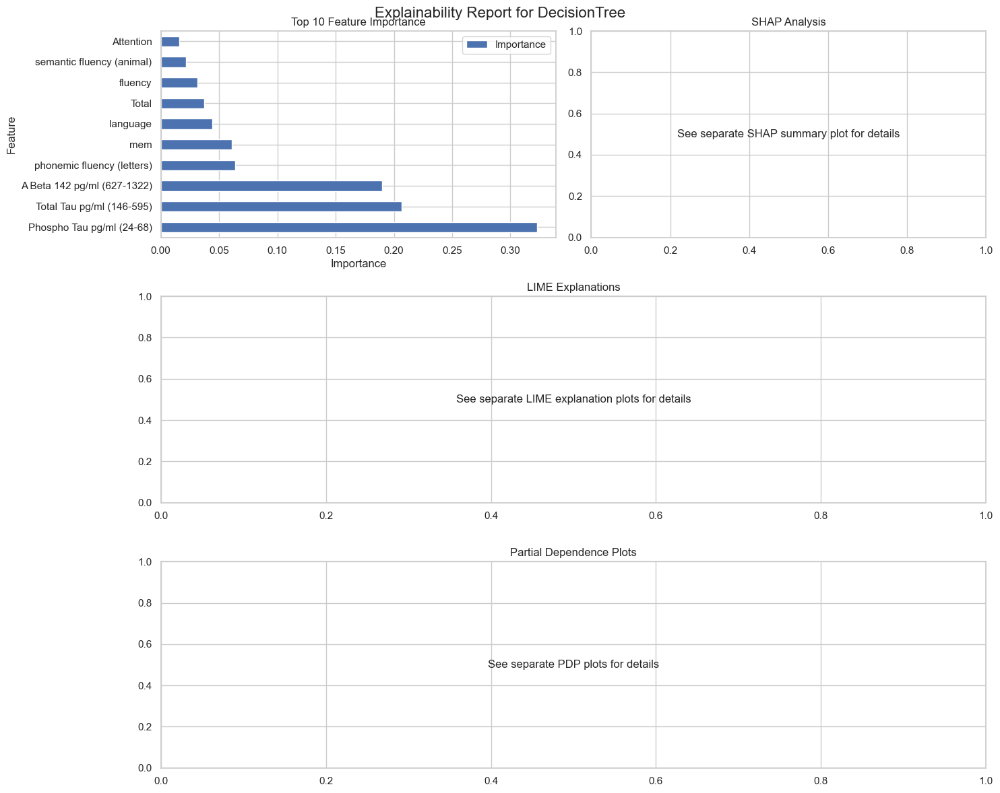

Explainability report complete.
Explainability analysis for DecisionTree complete.

Analyzing SVM...

Applying Explainability Techniques to SVM
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

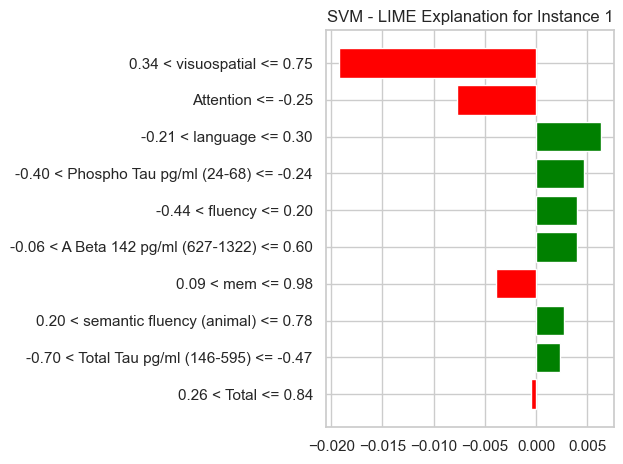

Instance 1:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [0.01848625 0.00197856 0.00293824 0.00625432 0.03124976 0.00198048
 0.10371668 0.00323483 0.01209477 0.00280349 0.02440494 0.02089229
 0.76996541]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0192
    Attention <= -0.25: -0.0078
    -0.21 < language <= 0.30: 0.0063
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0046
    -0.44 < fluency <= 0.20: 0.0040



<Figure size 1000x600 with 0 Axes>

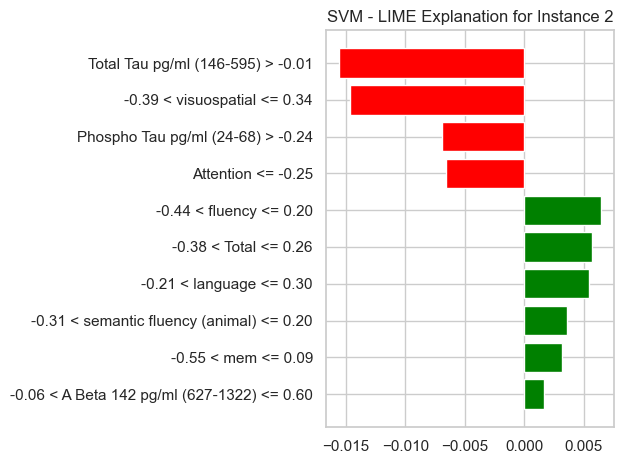

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [9.49059451e-01 2.55234668e-03 2.21152066e-03 6.17843732e-03
 1.64180729e-03 6.14654101e-04 1.42712181e-03 6.90518146e-03
 1.22801969e-02 2.26135303e-03 5.21432220e-04 1.16219327e-02
 2.72456480e-03]
  Top features supporting prediction:
    Total Tau pg/ml (146-595) > -0.01: -0.0156
    -0.39 < visuospatial <= 0.34: -0.0147
    Phospho Tau pg/ml (24-68) > -0.24: -0.0069
    Attention <= -0.25: -0.0065
    -0.44 < fluency <= 0.20: 0.0065



<Figure size 1000x600 with 0 Axes>

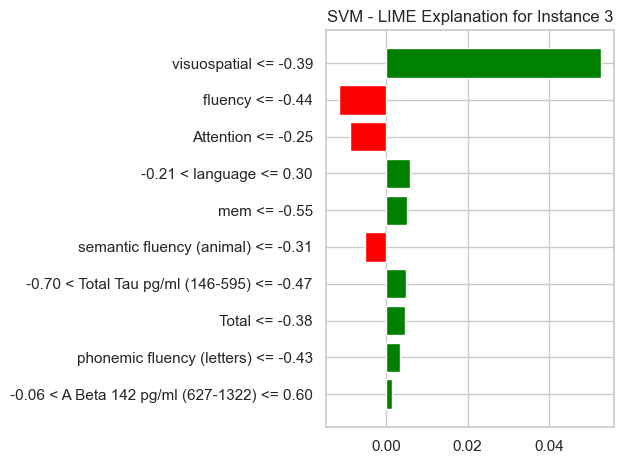

Instance 3:
  True class: PD
  Predicted class: PD
  Prediction probabilities: [0.10647449 0.02344612 0.01659849 0.01866365 0.10311443 0.0093091
 0.17752925 0.01440483 0.09445365 0.19815972 0.0430249  0.17584236
 0.018979  ]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0526
    fluency <= -0.44: -0.0114
    Attention <= -0.25: -0.0087
    -0.21 < language <= 0.30: 0.0059
    mem <= -0.55: 0.0051



<Figure size 1000x600 with 0 Axes>

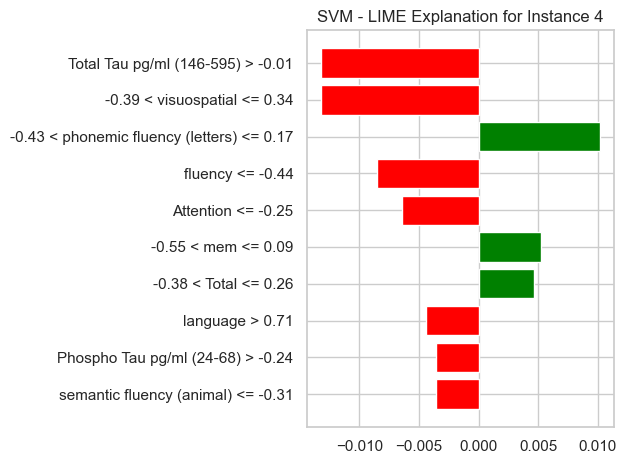

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [9.93842278e-01 1.28329495e-04 1.68452710e-03 3.36667635e-04
 3.88052751e-04 6.14166233e-04 2.69162555e-04 2.06094372e-04
 1.42791342e-03 2.55920821e-04 1.16547163e-04 5.08986811e-04
 2.21353874e-04]
  Top features supporting prediction:
    Total Tau pg/ml (146-595) > -0.01: -0.0132
    -0.39 < visuospatial <= 0.34: -0.0132
    -0.43 < phonemic fluency (letters) <= 0.17: 0.0102
    fluency <= -0.44: -0.0085
    Attention <= -0.25: -0.0064



<Figure size 1000x600 with 0 Axes>

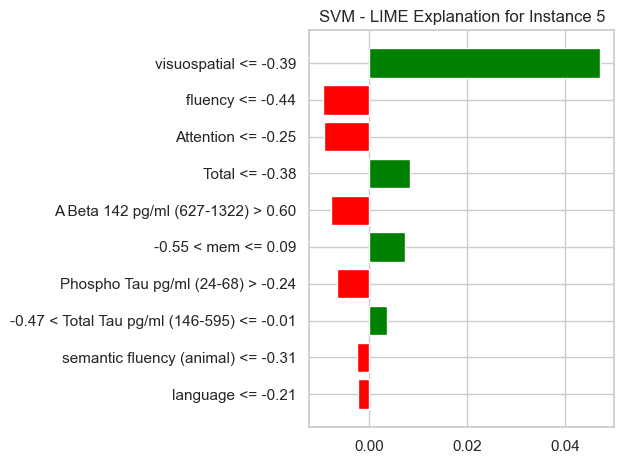

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [0.01781891 0.00148802 0.00360765 0.00345887 0.05222967 0.00209085
 0.00274371 0.00462456 0.05983131 0.00762995 0.0070298  0.00105761
 0.83638909]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0471
    fluency <= -0.44: -0.0093
    Attention <= -0.25: -0.0092
    Total <= -0.38: 0.0083
    A Beta 142 pg/ml (627-1322) > 0.60: -0.0077

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


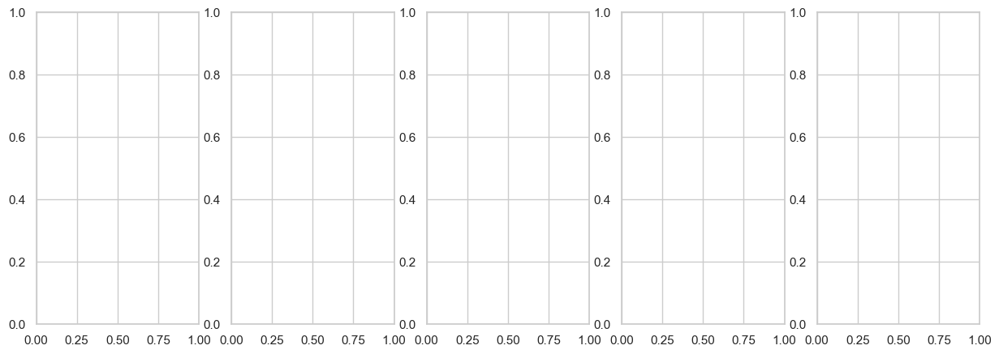

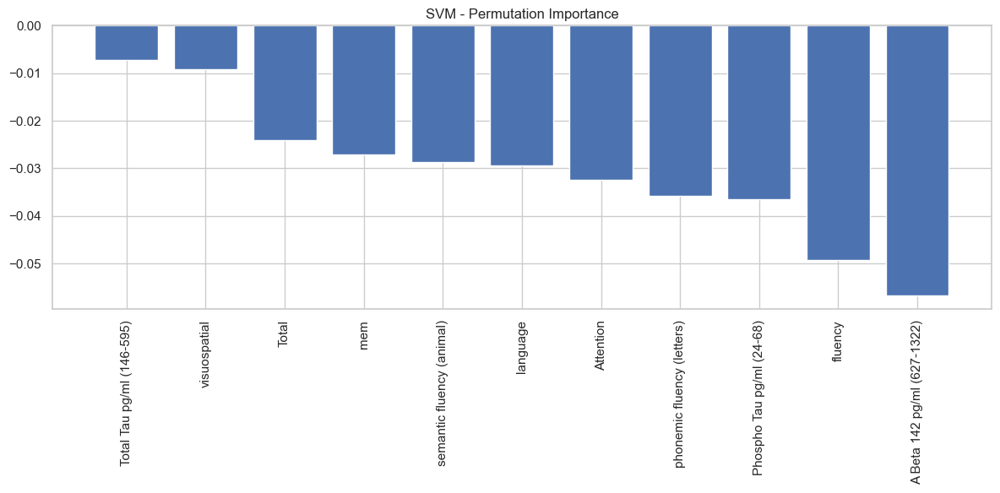

Top 10 Most Important Features:
                      Feature  Importance
0   Total Tau pg/ml (146-595)   -0.007216
1                visuospatial   -0.009192
2                       Total   -0.024141
3                         mem   -0.027062
4   semantic fluency (animal)   -0.028694
5                    language   -0.029381
6                   Attention   -0.032388
7  phonemic fluency (letters)   -0.035739
8   Phospho Tau pg/ml (24-68)   -0.036512
9                     fluency   -0.049227
Feature importance extraction complete.

Creating comprehensive explainability report...


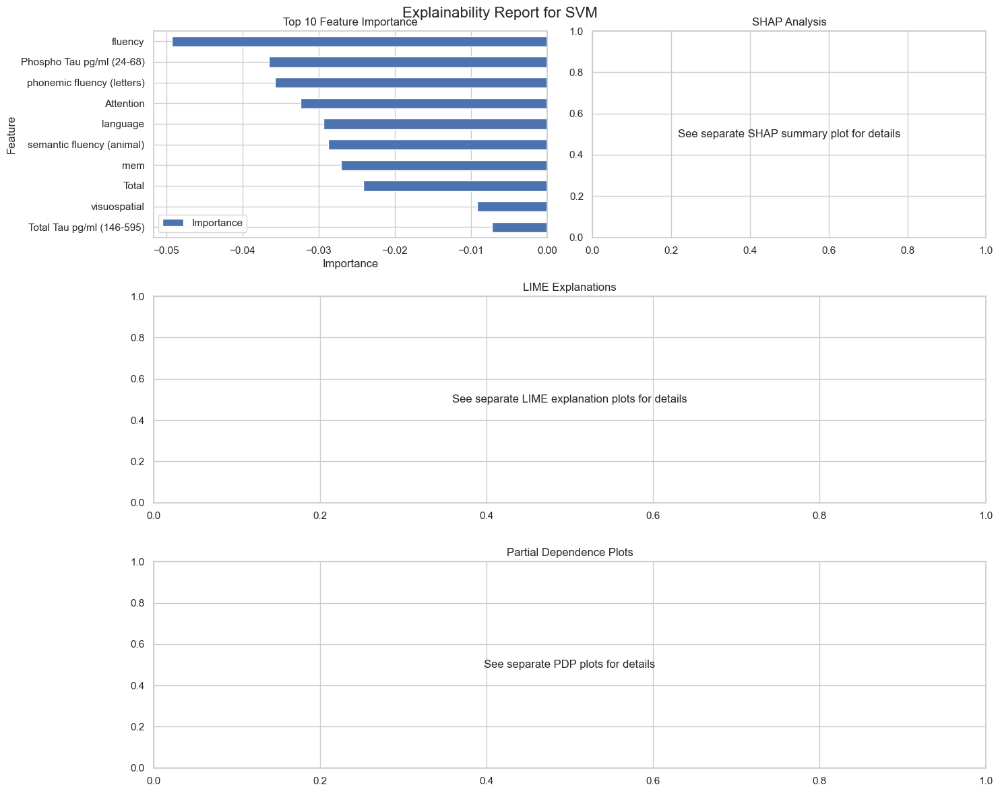

Explainability report complete.
Explainability analysis for SVM complete.

Analyzing NeuralNetwork...

Applying Explainability Techniques to NeuralNetwork
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

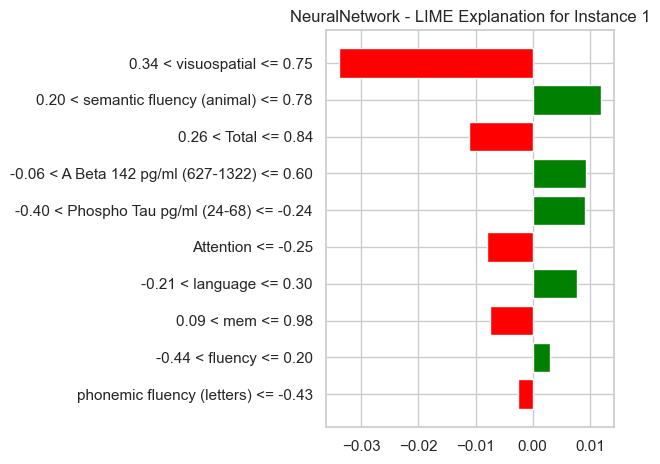

Instance 1:
  True class: multifactorial
  Predicted class: MCI
  Prediction probabilities: [5.05578945e-04 8.77801108e-07 6.84899504e-05 4.76616581e-03
 9.03396172e-02 8.33698458e-07 4.73188408e-01 1.43196309e-06
 3.48884703e-03 4.13448184e-06 1.27561246e-03 1.95656211e-03
 4.24403440e-01]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0338
    0.20 < semantic fluency (animal) <= 0.78: 0.0119
    0.26 < Total <= 0.84: -0.0111
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0094
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0092



<Figure size 1000x600 with 0 Axes>

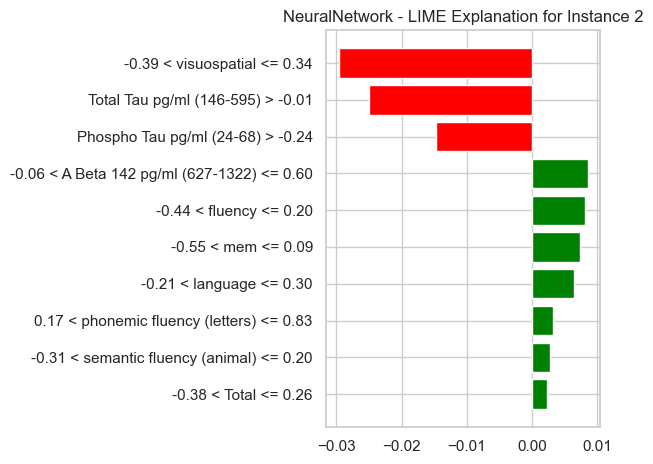

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [9.22255823e-01 1.51519819e-05 1.26646308e-05 7.11902195e-02
 1.38520047e-04 2.68233211e-07 9.36369753e-06 8.26084621e-04
 5.32174216e-03 1.69891427e-11 2.35945428e-09 9.62453200e-08
 2.30063446e-04]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0297
    Total Tau pg/ml (146-595) > -0.01: -0.0251
    Phospho Tau pg/ml (24-68) > -0.24: -0.0148
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0085
    -0.44 < fluency <= 0.20: 0.0081



<Figure size 1000x600 with 0 Axes>

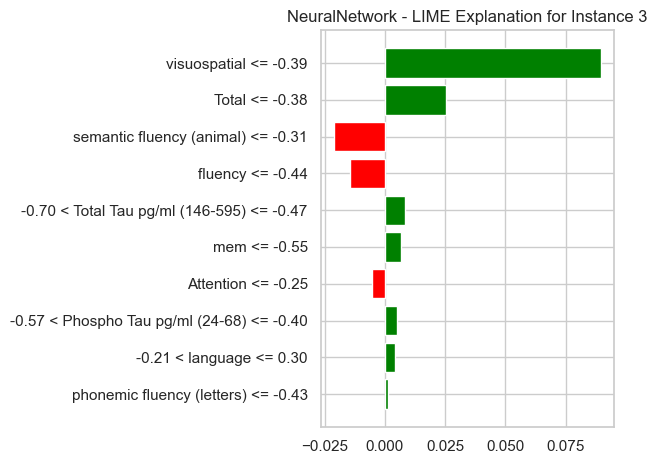

Instance 3:
  True class: PD
  Predicted class: MCI
  Prediction probabilities: [5.56879734e-02 3.59406715e-03 4.03254622e-03 4.40914647e-03
 7.27905267e-02 5.26126223e-05 3.41735897e-01 3.29713114e-05
 3.25559310e-01 3.25866689e-02 1.50278591e-02 1.27940901e-01
 1.65495197e-02]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0895
    Total <= -0.38: 0.0252
    semantic fluency (animal) <= -0.31: -0.0210
    fluency <= -0.44: -0.0143
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0083



<Figure size 1000x600 with 0 Axes>

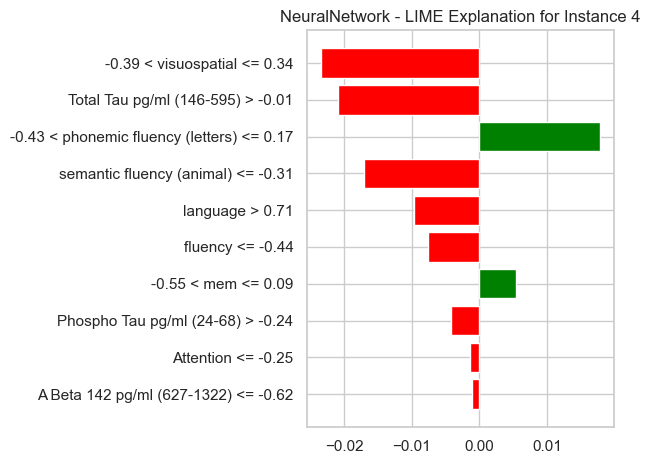

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [9.98810942e-01 2.53198308e-10 9.85187534e-06 1.17314110e-03
 1.19135993e-06 9.85718054e-10 1.93714201e-07 1.37083172e-09
 4.59410574e-06 5.62794386e-18 1.77212282e-11 5.68130532e-11
 8.29906464e-08]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0235
    Total Tau pg/ml (146-595) > -0.01: -0.0209
    -0.43 < phonemic fluency (letters) <= 0.17: 0.0179
    semantic fluency (animal) <= -0.31: -0.0171
    language > 0.71: -0.0096



<Figure size 1000x600 with 0 Axes>

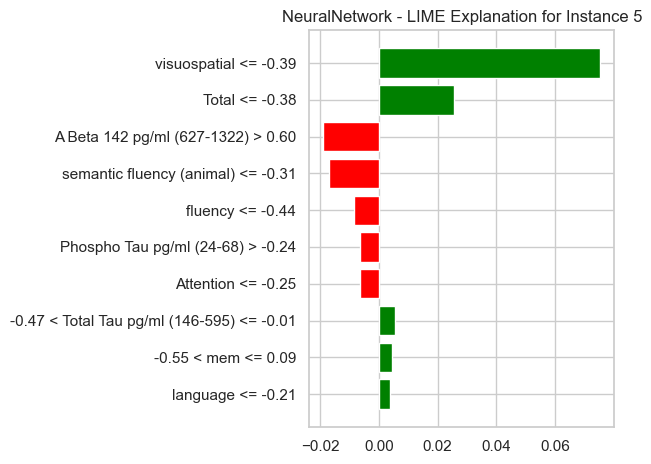

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [1.52364624e-05 3.15921475e-10 8.26473884e-09 1.12682838e-05
 2.76316941e-01 8.82684707e-11 1.03637574e-05 1.42088169e-05
 7.71096367e-03 4.17926349e-05 1.31366254e-05 2.19278440e-11
 7.15866080e-01]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0753
    Total <= -0.38: 0.0255
    A Beta 142 pg/ml (627-1322) > 0.60: -0.0189
    semantic fluency (animal) <= -0.31: -0.0169
    fluency <= -0.44: -0.0085

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


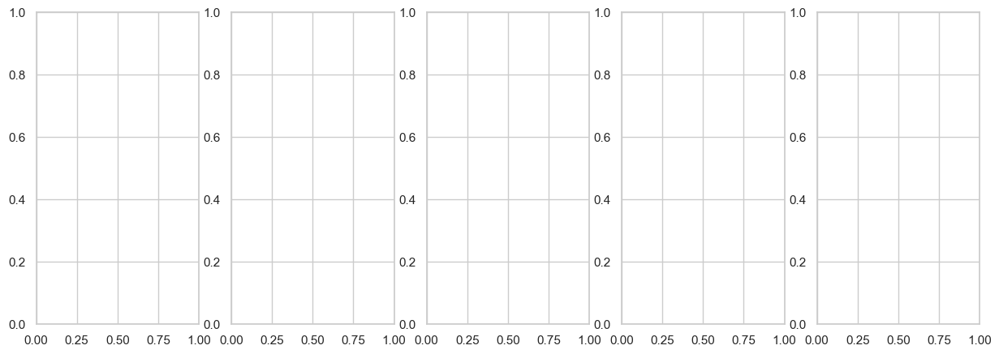

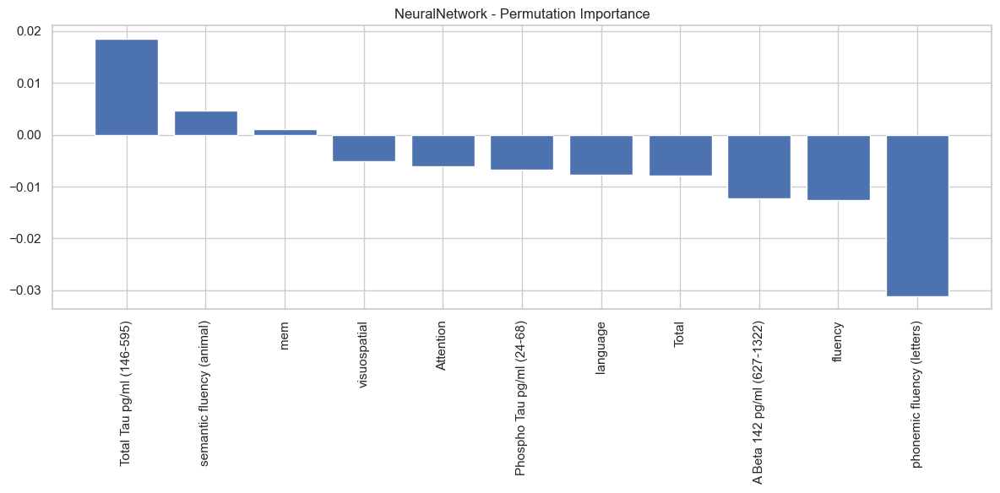

Top 10 Most Important Features:
                       Feature  Importance
0    Total Tau pg/ml (146-595)    0.018557
1    semantic fluency (animal)    0.004725
2                          mem    0.001031
3                 visuospatial   -0.005069
4                    Attention   -0.006014
5    Phospho Tau pg/ml (24-68)   -0.006701
6                     language   -0.007646
7                        Total   -0.007818
8  A Beta 142 pg/ml (627-1322)   -0.012285
9                      fluency   -0.012629
Feature importance extraction complete.

Creating comprehensive explainability report...


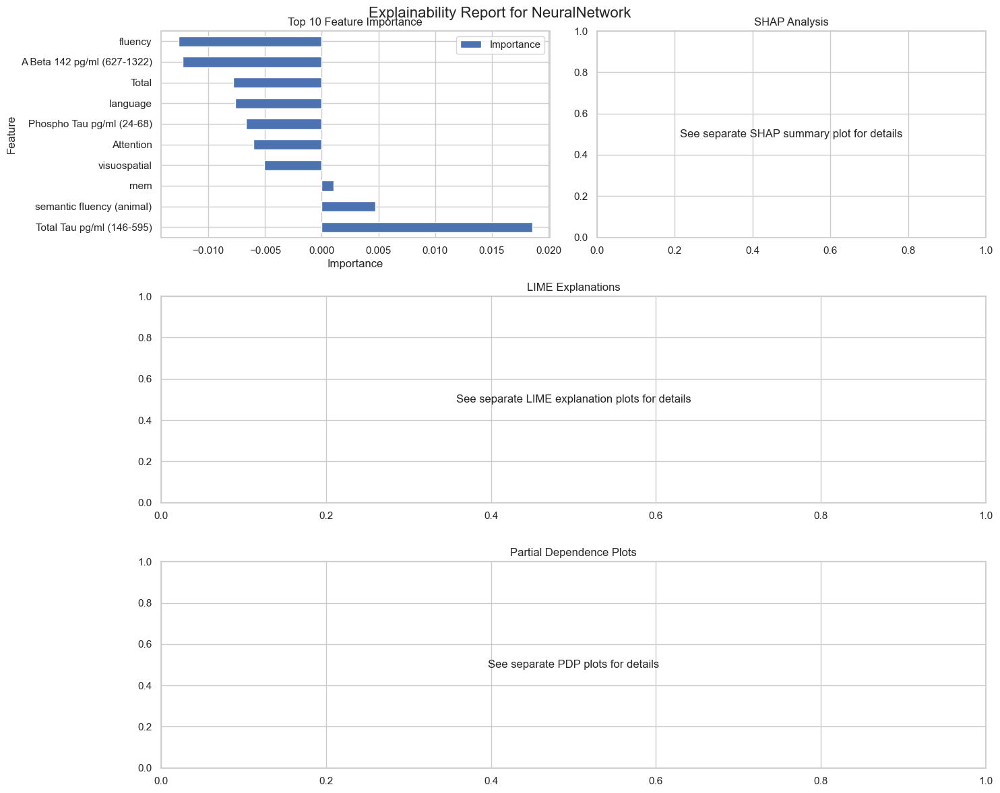

Explainability report complete.
Explainability analysis for NeuralNetwork complete.

Analyzing KNN...

Applying Explainability Techniques to KNN
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

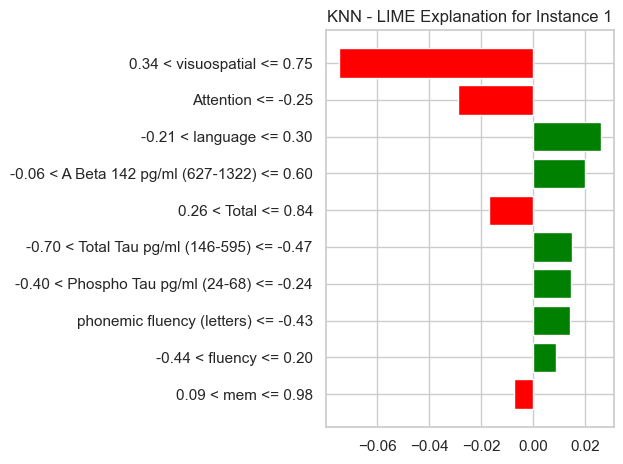

Instance 1:
  True class: multifactorial
  Predicted class: MCI
  Prediction probabilities: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0747
    Attention <= -0.25: -0.0289
    -0.21 < language <= 0.30: 0.0261
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0198
    0.26 < Total <= 0.84: -0.0168



<Figure size 1000x600 with 0 Axes>

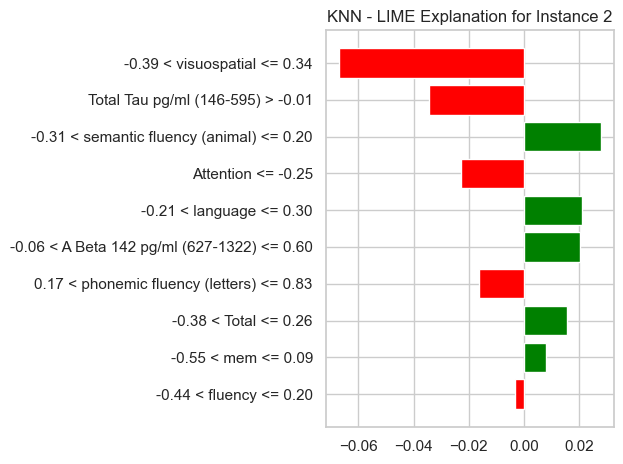

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0669
    Total Tau pg/ml (146-595) > -0.01: -0.0344
    -0.31 < semantic fluency (animal) <= 0.20: 0.0278
    Attention <= -0.25: -0.0228
    -0.21 < language <= 0.30: 0.0209



<Figure size 1000x600 with 0 Axes>

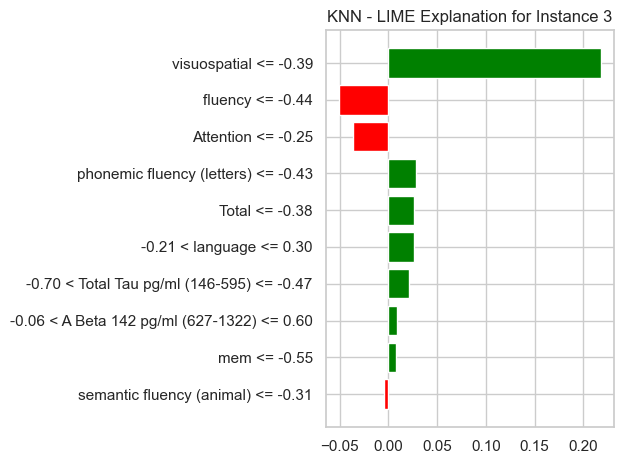

Instance 3:
  True class: PD
  Predicted class: MCI
  Prediction probabilities: [0.        0.        0.        0.        0.        0.        0.6613671
 0.        0.        0.3386329 0.        0.        0.       ]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.2180
    fluency <= -0.44: -0.0505
    Attention <= -0.25: -0.0360
    phonemic fluency (letters) <= -0.43: 0.0279
    Total <= -0.38: 0.0262



<Figure size 1000x600 with 0 Axes>

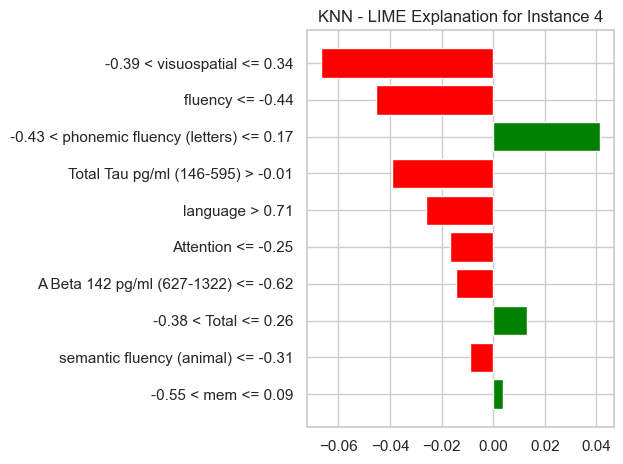

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0669
    fluency <= -0.44: -0.0453
    -0.43 < phonemic fluency (letters) <= 0.17: 0.0414
    Total Tau pg/ml (146-595) > -0.01: -0.0394
    language > 0.71: -0.0262



<Figure size 1000x600 with 0 Axes>

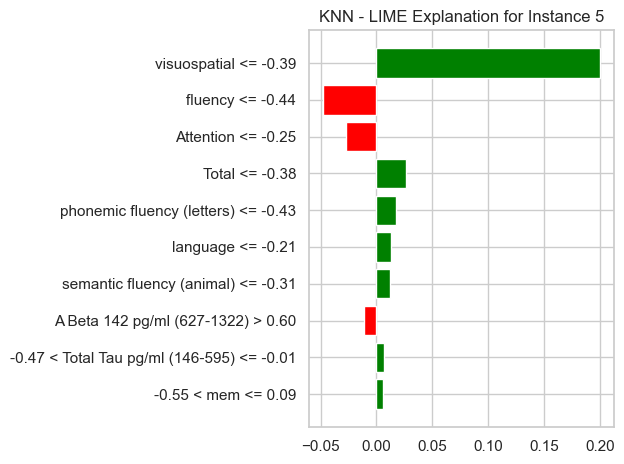

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.2002
    fluency <= -0.44: -0.0475
    Attention <= -0.25: -0.0272
    Total <= -0.38: 0.0260
    phonemic fluency (letters) <= -0.43: 0.0173

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


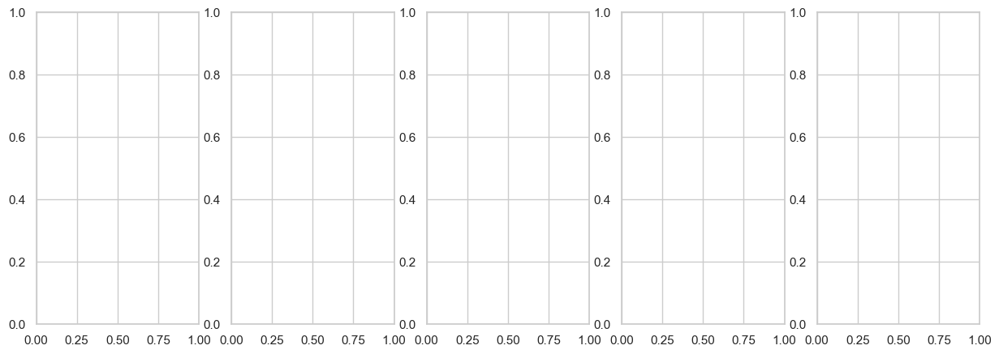

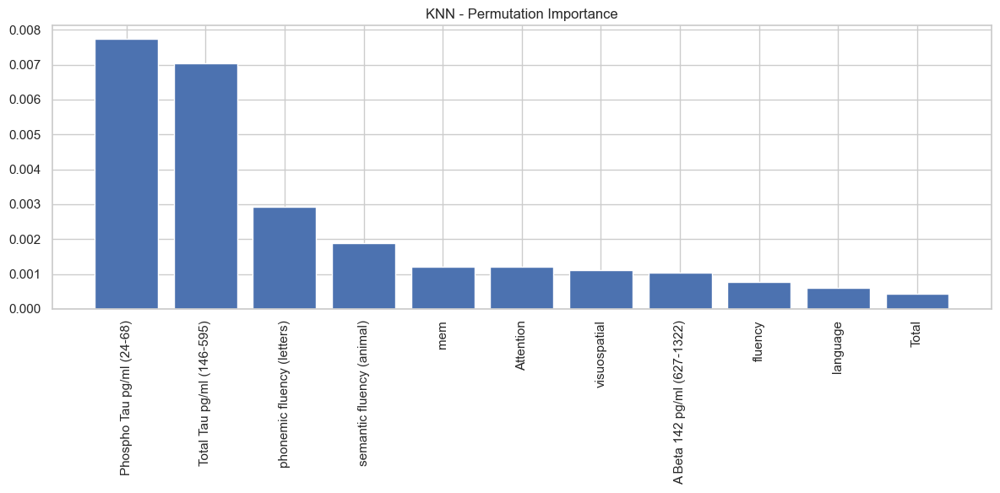

Top 10 Most Important Features:
                       Feature  Importance
0    Phospho Tau pg/ml (24-68)    0.007732
1    Total Tau pg/ml (146-595)    0.007045
2   phonemic fluency (letters)    0.002921
3    semantic fluency (animal)    0.001890
4                          mem    0.001203
5                    Attention    0.001203
6                 visuospatial    0.001117
7  A Beta 142 pg/ml (627-1322)    0.001031
8                      fluency    0.000773
9                     language    0.000601
Feature importance extraction complete.

Creating comprehensive explainability report...


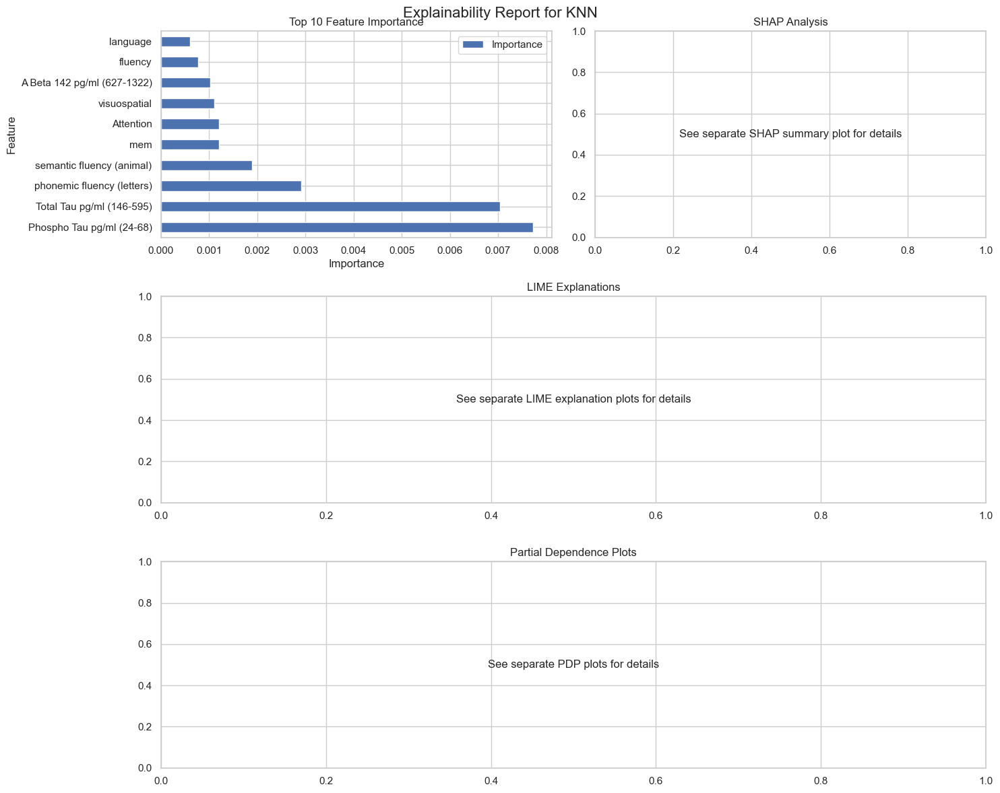

Explainability report complete.
Explainability analysis for KNN complete.

Analyzing StackingEnsemble...

Applying Explainability Techniques to StackingEnsemble
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

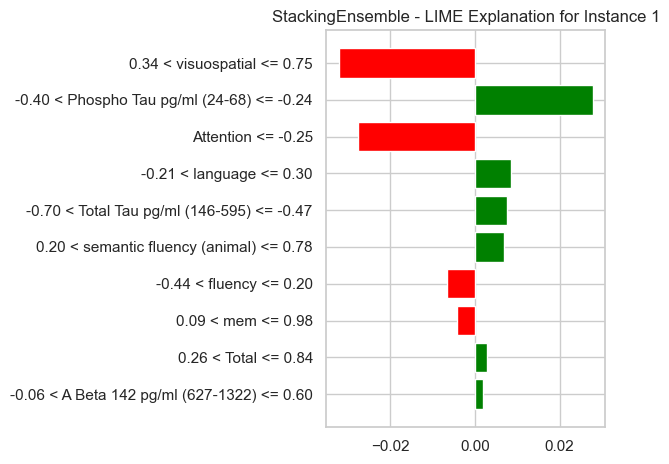

Instance 1:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [3.36304079e-03 6.99411479e-04 8.47934891e-04 1.33517341e-03
 8.58160550e-03 8.92403975e-04 6.92652418e-03 7.82398151e-04
 3.54729721e-03 9.72473991e-04 8.67127306e-04 1.28663274e-03
 9.69897976e-01]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0322
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0278
    Attention <= -0.25: -0.0277
    -0.21 < language <= 0.30: 0.0084
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0077



<Figure size 1000x600 with 0 Axes>

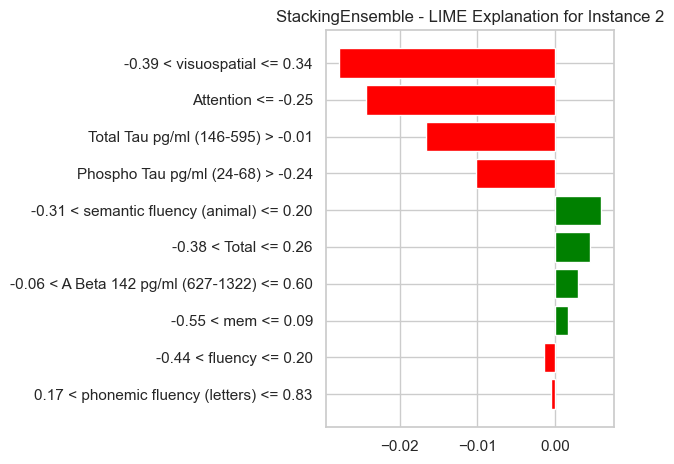

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [9.86648915e-01 3.51724770e-04 4.49197239e-04 5.38320157e-03
 4.12278251e-04 4.50405827e-04 6.46091354e-04 3.98679119e-04
 2.50054384e-03 4.66396528e-04 8.12603604e-04 5.20025424e-04
 9.59937544e-04]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0278
    Attention <= -0.25: -0.0244
    Total Tau pg/ml (146-595) > -0.01: -0.0166
    Phospho Tau pg/ml (24-68) > -0.24: -0.0102
    -0.31 < semantic fluency (animal) <= 0.20: 0.0059



<Figure size 1000x600 with 0 Axes>

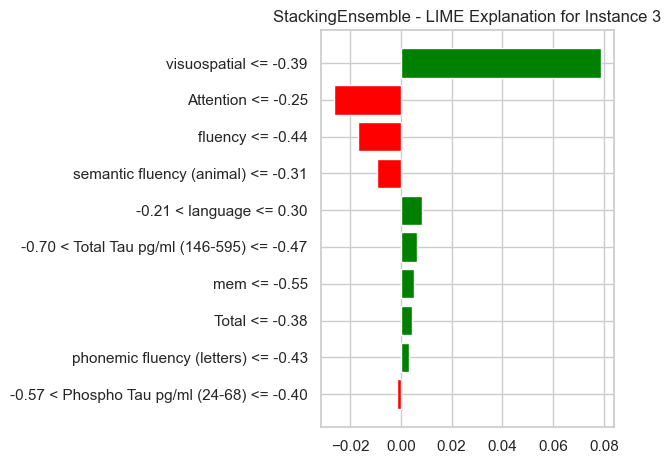

Instance 3:
  True class: PD
  Predicted class: MCI
  Prediction probabilities: [0.03794154 0.00564791 0.00821176 0.06192839 0.06903088 0.00865641
 0.66579191 0.0067687  0.03630467 0.01881695 0.01859438 0.03909119
 0.02321532]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0787
    Attention <= -0.25: -0.0262
    fluency <= -0.44: -0.0168
    semantic fluency (animal) <= -0.31: -0.0095
    -0.21 < language <= 0.30: 0.0085



<Figure size 1000x600 with 0 Axes>

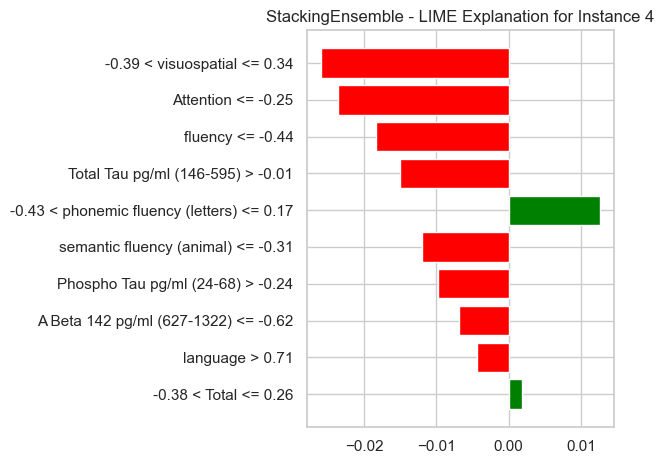

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [9.80004743e-01 3.42956944e-04 5.74073422e-04 1.11777393e-02
 5.20255882e-04 5.39507428e-04 1.08831569e-03 4.79642103e-04
 2.44187336e-03 8.10678345e-04 7.56851428e-04 5.70714590e-04
 6.92648496e-04]
  Top features supporting prediction:
    -0.39 < visuospatial <= 0.34: -0.0260
    Attention <= -0.25: -0.0236
    fluency <= -0.44: -0.0183
    Total Tau pg/ml (146-595) > -0.01: -0.0150
    -0.43 < phonemic fluency (letters) <= 0.17: 0.0126



<Figure size 1000x600 with 0 Axes>

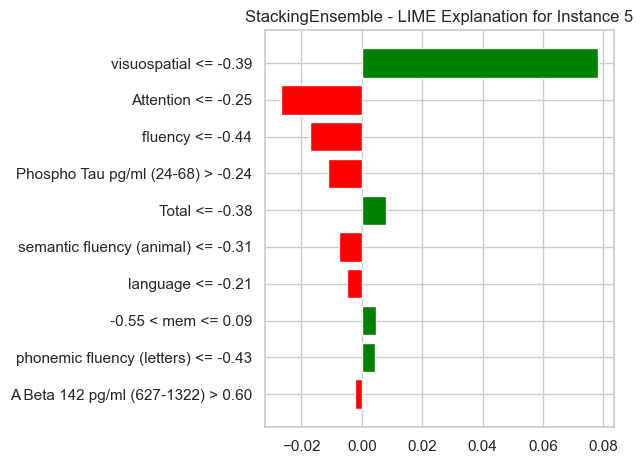

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [4.17341611e-04 9.53621522e-05 1.13784797e-04 1.59641793e-04
 1.47864617e-03 1.20851624e-04 1.24440994e-04 1.02764340e-04
 4.74563306e-04 1.55051884e-04 6.91841664e-05 1.46149022e-04
 9.96542218e-01]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0781
    Attention <= -0.25: -0.0267
    fluency <= -0.44: -0.0171
    Phospho Tau pg/ml (24-68) > -0.24: -0.0112
    Total <= -0.38: 0.0080

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


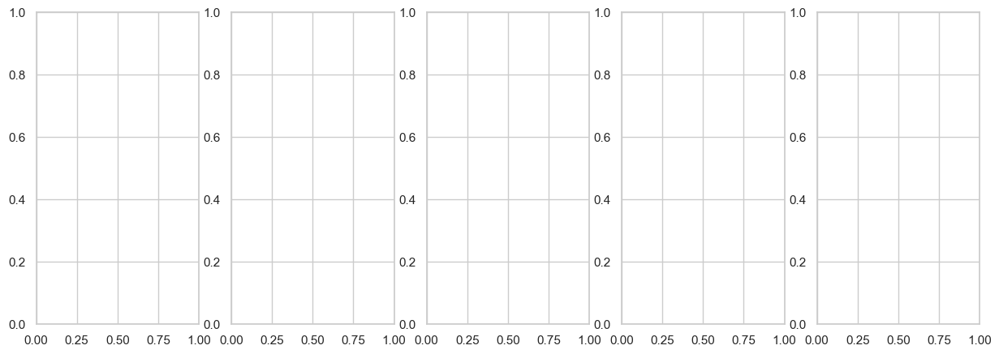

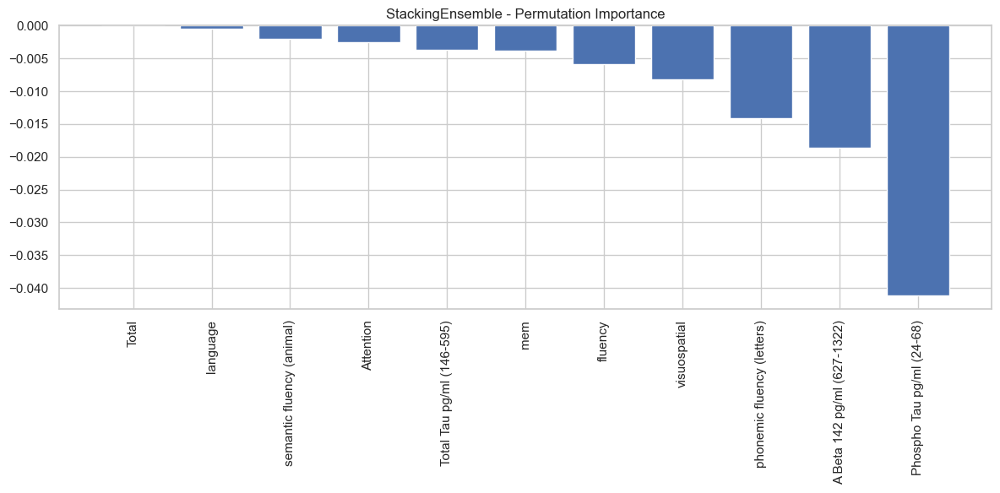

Top 10 Most Important Features:
                       Feature  Importance
0                        Total    0.000000
1                     language   -0.000515
2    semantic fluency (animal)   -0.002062
3                    Attention   -0.002577
4    Total Tau pg/ml (146-595)   -0.003694
5                          mem   -0.003866
6                      fluency   -0.005928
7                 visuospatial   -0.008162
8   phonemic fluency (letters)   -0.014089
9  A Beta 142 pg/ml (627-1322)   -0.018643
Feature importance extraction complete.

Creating comprehensive explainability report...


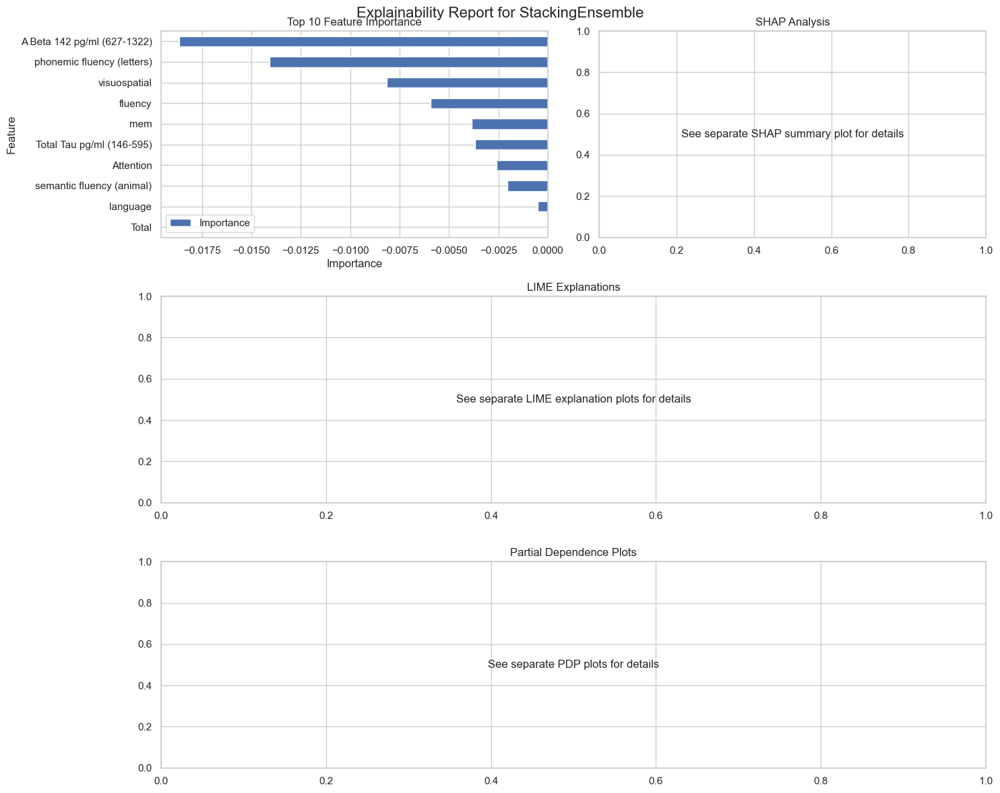

Explainability report complete.
Explainability analysis for StackingEnsemble complete.

Analyzing GaussianNaiveBayes...

Applying Explainability Techniques to GaussianNaiveBayes
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

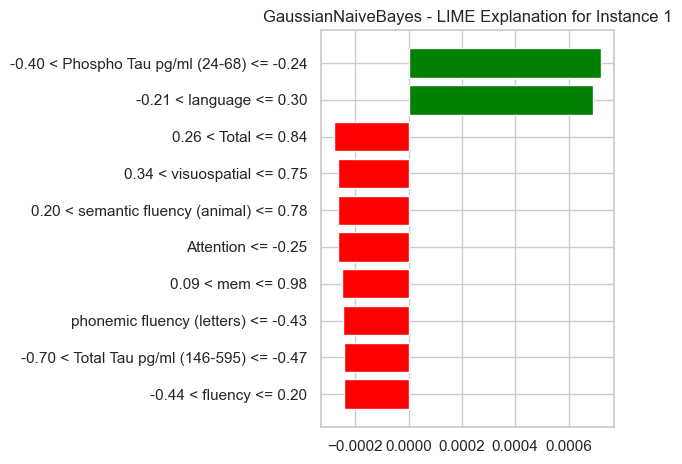

Instance 1:
  True class: multifactorial
  Predicted class: Other neurodegenerations
  Prediction probabilities: [1.72613021e-004 1.37628909e-022 3.76785518e-033 8.39236804e-003
 8.81758799e-002 4.45763735e-131 1.34582827e-001 6.08802716e-008
 3.66020557e-001 2.73433622e-005 4.87007709e-002 1.24724419e-001
 2.29203161e-001]
  Top features supporting prediction:
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0007
    -0.21 < language <= 0.30: 0.0007
    0.26 < Total <= 0.84: -0.0003
    0.34 < visuospatial <= 0.75: -0.0003
    0.20 < semantic fluency (animal) <= 0.78: -0.0003



<Figure size 1000x600 with 0 Axes>

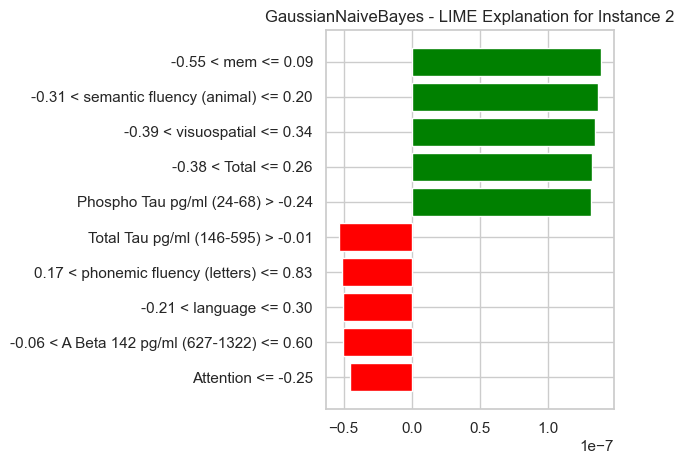

Instance 2:
  True class: AD
  Predicted class: DLB
  Prediction probabilities: [3.67009208e-002 6.70120578e-151 0.00000000e+000 9.63299079e-001
 7.91777248e-015 0.00000000e+000 6.35526687e-131 3.34801515e-272
 3.53305117e-015 1.26159499e-235 7.10031237e-014 1.46452115e-064
 1.29800289e-037]
  Top features supporting prediction:
    -0.55 < mem <= 0.09: 0.0000
    -0.31 < semantic fluency (animal) <= 0.20: 0.0000
    -0.39 < visuospatial <= 0.34: 0.0000
    -0.38 < Total <= 0.26: 0.0000
    Phospho Tau pg/ml (24-68) > -0.24: 0.0000



<Figure size 1000x600 with 0 Axes>

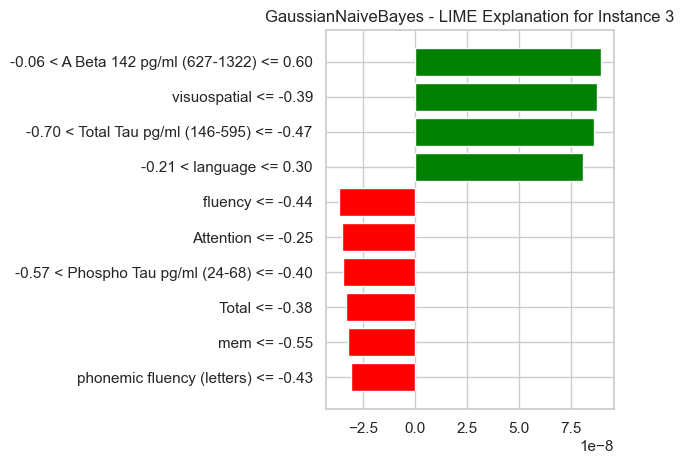

Instance 3:
  True class: PD
  Predicted class: MCI
  Prediction probabilities: [1.51663750e-004 4.12400287e-017 1.19979415e-031 5.10993657e-005
 4.34894285e-002 4.38178856e-178 9.14465093e-001 7.96004534e-026
 8.50399320e-003 7.24107103e-003 5.94779418e-003 9.70081849e-005
 2.00528488e-002]
  Top features supporting prediction:
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0000
    visuospatial <= -0.39: 0.0000
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0000
    -0.21 < language <= 0.30: 0.0000
    fluency <= -0.44: -0.0000



<Figure size 1000x600 with 0 Axes>

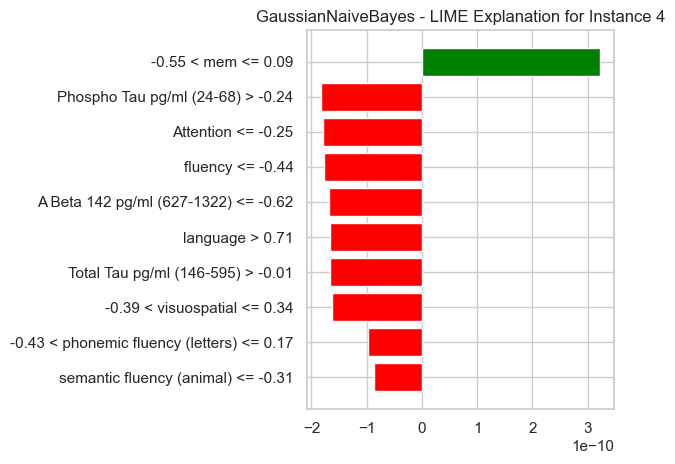

Instance 4:
  True class: AD
  Predicted class: DLB
  Prediction probabilities: [3.10838701e-001 1.99728449e-186 0.00000000e+000 6.89161299e-001
 6.76154233e-016 0.00000000e+000 1.85743582e-146 0.00000000e+000
 1.19942175e-018 3.40109288e-267 2.93375277e-015 1.22054221e-085
 7.89685579e-041]
  Top features supporting prediction:
    -0.55 < mem <= 0.09: 0.0000
    Phospho Tau pg/ml (24-68) > -0.24: -0.0000
    Attention <= -0.25: -0.0000
    fluency <= -0.44: -0.0000
    A Beta 142 pg/ml (627-1322) <= -0.62: -0.0000



<Figure size 1000x600 with 0 Axes>

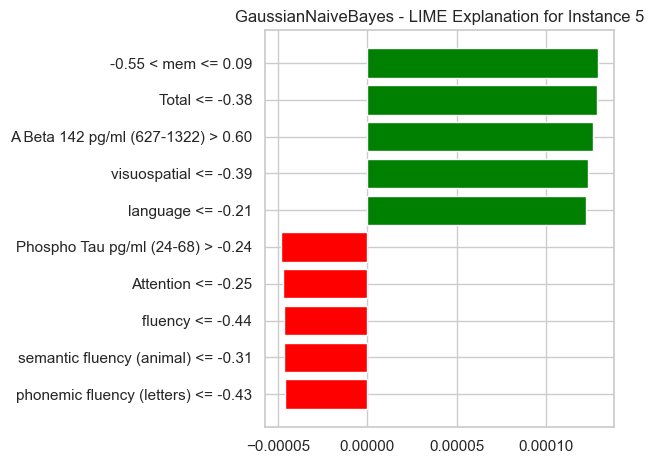

Instance 5:
  True class: multifactorial
  Predicted class: FTD
  Prediction probabilities: [7.02061644e-013 1.56175155e-123 1.96425236e-172 5.74093802e-004
 5.61889175e-001 0.00000000e+000 1.36172970e-024 1.65385156e-069
 1.38478378e-012 5.05683133e-030 4.12125874e-003 1.53382130e-100
 4.33415472e-001]
  Top features supporting prediction:
    -0.55 < mem <= 0.09: 0.0001
    Total <= -0.38: 0.0001
    A Beta 142 pg/ml (627-1322) > 0.60: 0.0001
    visuospatial <= -0.39: 0.0001
    language <= -0.21: 0.0001

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: 'values'

Extracting feature importance...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 48, in apply_pdp_analysis
    feature_values = pdp_result['values'][0]
                     ~~~~~~~~~~^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_bunch.py", line 42, in __getitem__
    return super().__getitem__(key)
           ^^^^^^^^^^^^^^^^^^^^^^^^
KeyError: 'values'


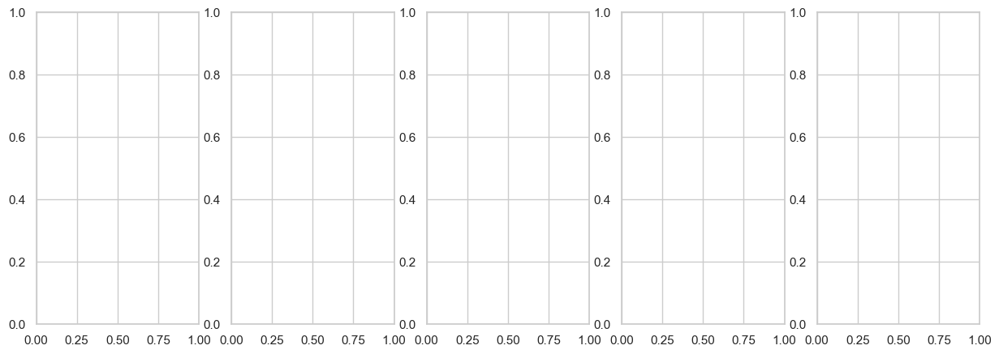

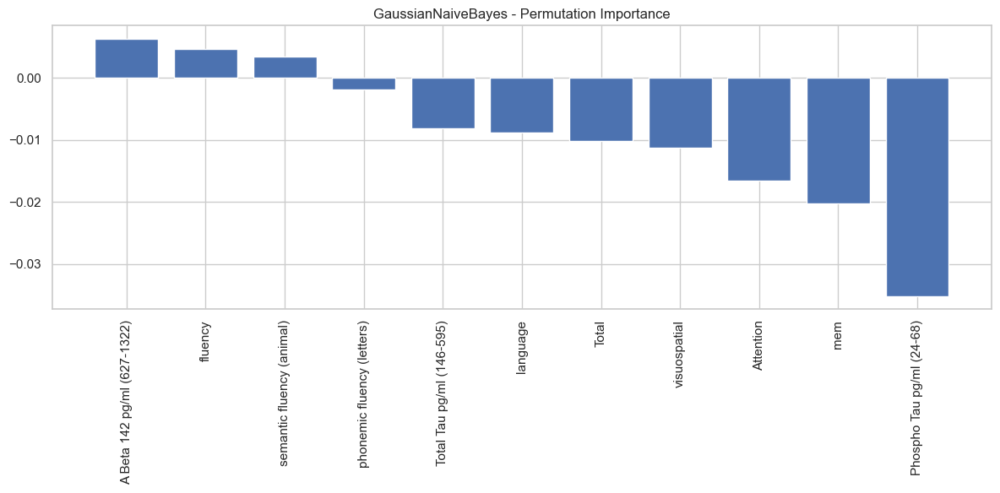

Top 10 Most Important Features:
                       Feature  Importance
0  A Beta 142 pg/ml (627-1322)    0.006357
1                      fluency    0.004639
2    semantic fluency (animal)    0.003522
3   phonemic fluency (letters)   -0.001890
4    Total Tau pg/ml (146-595)   -0.008076
5                     language   -0.008849
6                        Total   -0.010137
7                 visuospatial   -0.011254
8                    Attention   -0.016581
9                          mem   -0.020275
Feature importance extraction complete.

Creating comprehensive explainability report...


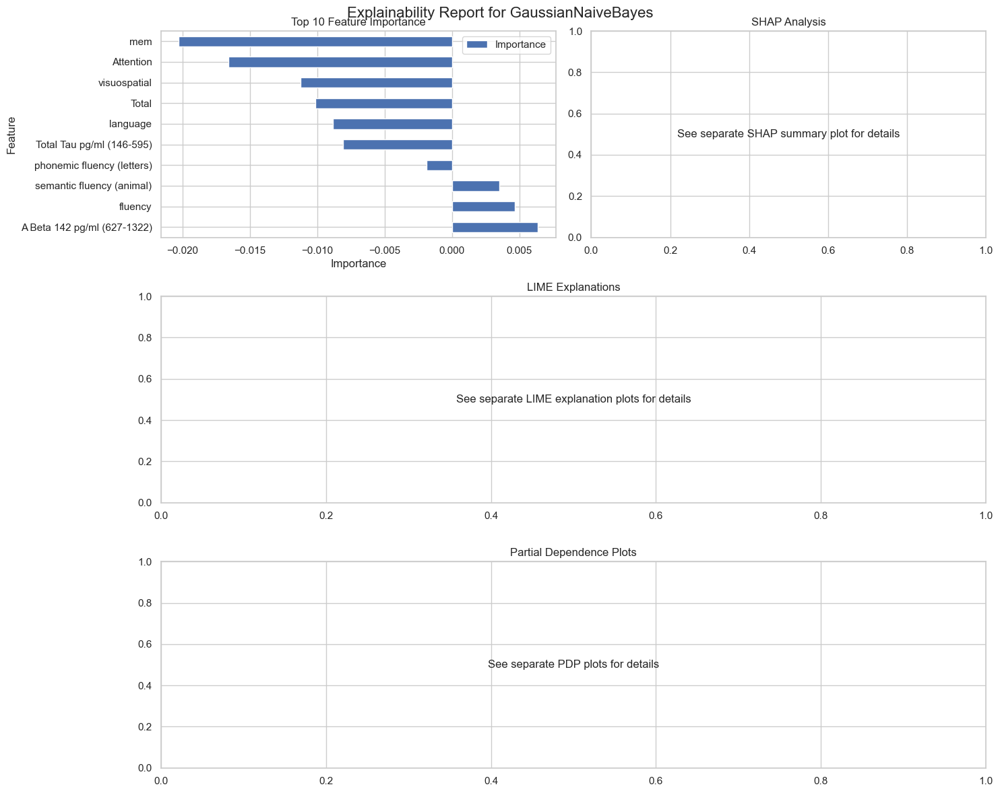

Explainability report complete.
Explainability analysis for GaussianNaiveBayes complete.

Analyzing SelfNormalizingNN...

Applying Explainability Techniques to SelfNormalizingNN
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

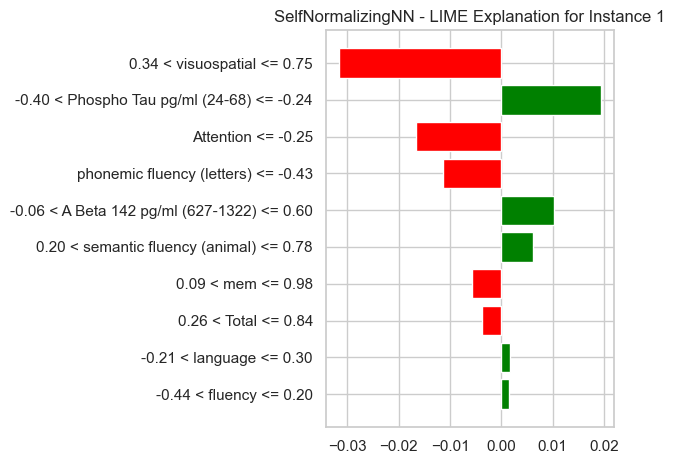

Instance 1:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [5.2481351e-08 4.3445307e-15 6.0474972e-11 6.0962018e-09 2.1373302e-04
 1.2835306e-15 3.0532612e-03 2.1663671e-16 2.6641542e-08 3.8180679e-15
 6.0051470e-09 6.2723933e-07 9.9673223e-01]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0316
    -0.40 < Phospho Tau pg/ml (24-68) <= -0.24: 0.0194
    Attention <= -0.25: -0.0166
    phonemic fluency (letters) <= -0.43: -0.0113
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0103



/Users/adityapurswani/Documents/CogNIDData/Bitan/diagnostic_models.py:1830: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:281.)
  X_tensor = torch.FloatTensor(X)


<Figure size 1000x600 with 0 Axes>

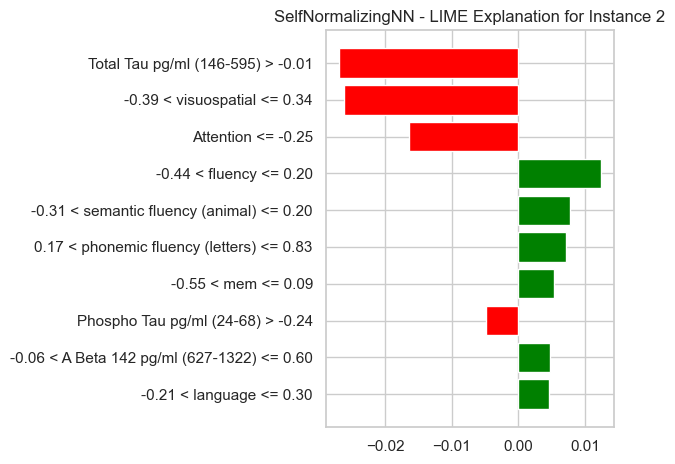

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [1.0000000e+00 2.1295468e-22 1.0089927e-31 8.2081647e-11 3.4776373e-15
 1.8363016e-23 2.1912991e-26 1.1841078e-18 8.6405100e-19 0.0000000e+00
 1.2082714e-21 2.8012333e-30 2.0786434e-24]
  Top features supporting prediction:
    Total Tau pg/ml (146-595) > -0.01: -0.0269
    -0.39 < visuospatial <= 0.34: -0.0261
    Attention <= -0.25: -0.0164
    -0.44 < fluency <= 0.20: 0.0124
    -0.31 < semantic fluency (animal) <= 0.20: 0.0078



<Figure size 1000x600 with 0 Axes>

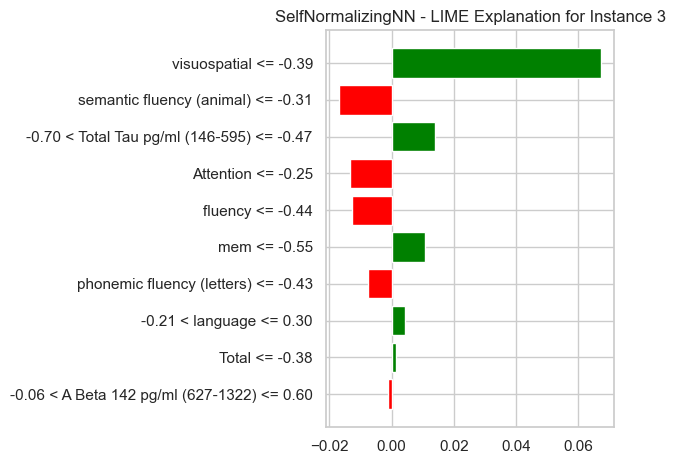

Instance 3:
  True class: PD
  Predicted class: FTD
  Prediction probabilities: [1.02119185e-02 2.66126415e-04 1.88586205e-06 3.83852603e-05
 5.78058422e-01 5.89293328e-12 3.68657231e-01 2.54820179e-07
 2.24234536e-02 8.88347245e-08 6.24691675e-05 2.02718936e-02
 7.76023808e-06]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0673
    semantic fluency (animal) <= -0.31: -0.0169
    -0.70 < Total Tau pg/ml (146-595) <= -0.47: 0.0141
    Attention <= -0.25: -0.0134
    fluency <= -0.44: -0.0127



<Figure size 1000x600 with 0 Axes>

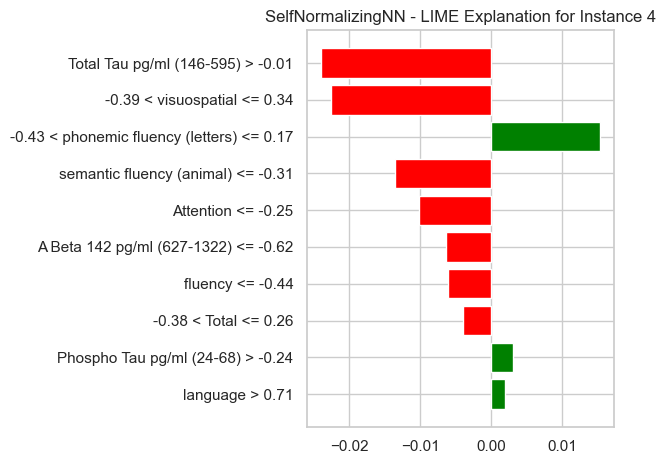

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [1.0000000e+00 2.8970979e-22 2.9385325e-32 9.0572733e-10 7.6064670e-16
 3.9449760e-25 2.1597140e-26 9.1257469e-26 8.0618303e-27 0.0000000e+00
 3.0717778e-24 2.9090956e-42 5.4822294e-29]
  Top features supporting prediction:
    Total Tau pg/ml (146-595) > -0.01: -0.0240
    -0.39 < visuospatial <= 0.34: -0.0225
    -0.43 < phonemic fluency (letters) <= 0.17: 0.0153
    semantic fluency (animal) <= -0.31: -0.0135
    Attention <= -0.25: -0.0103



<Figure size 1000x600 with 0 Axes>

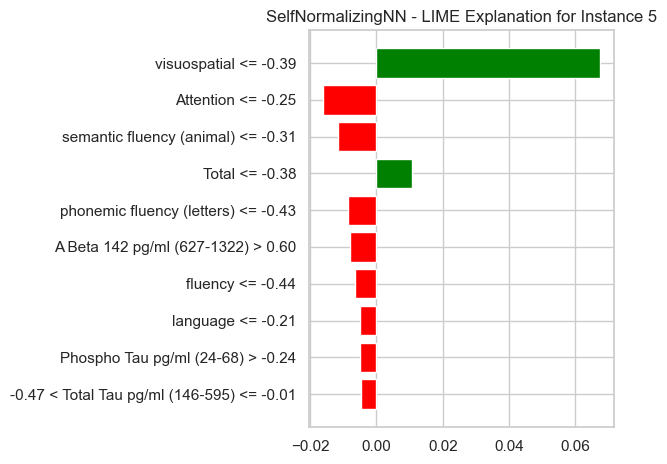

Instance 5:
  True class: multifactorial
  Predicted class: multifactorial
  Prediction probabilities: [3.4357557e-09 4.9704483e-26 3.3192035e-25 6.6533698e-13 9.0997462e-05
 3.4918531e-27 3.1163741e-13 2.4023553e-15 3.6389265e-06 3.2724479e-17
 6.7358070e-07 1.4515122e-27 9.9990463e-01]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0674
    Attention <= -0.25: -0.0160
    semantic fluency (animal) <= -0.31: -0.0116
    Total <= -0.38: 0.0106
    phonemic fluency (letters) <= -0.43: -0.0085

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got <diagnostic_models.build_advanced_neural_network.<locals>.PyTorchModelWrapper object at 0x3288a0a10> instead.

Extracting feature importance...
Error extracting feature importance: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got <diagnostic_models.build_a

Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 25, in apply_pdp_analysis
    result = permutation_importance(model, X_train, np.zeros(X_train.shape[0]),
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_param_validation.py", line 206, in wrapper
    validate_parameter_constraints(
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_param_validation.py", line 98, in validate_parameter_constraints
    raise InvalidParameterError(
sklearn.utils._param_validation.InvalidParameterError: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got <diagnostic_models.build_advanced_neural_network.<locals>.PyTorchModelWrapper object at 0x3288a0a10> instead.
Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts

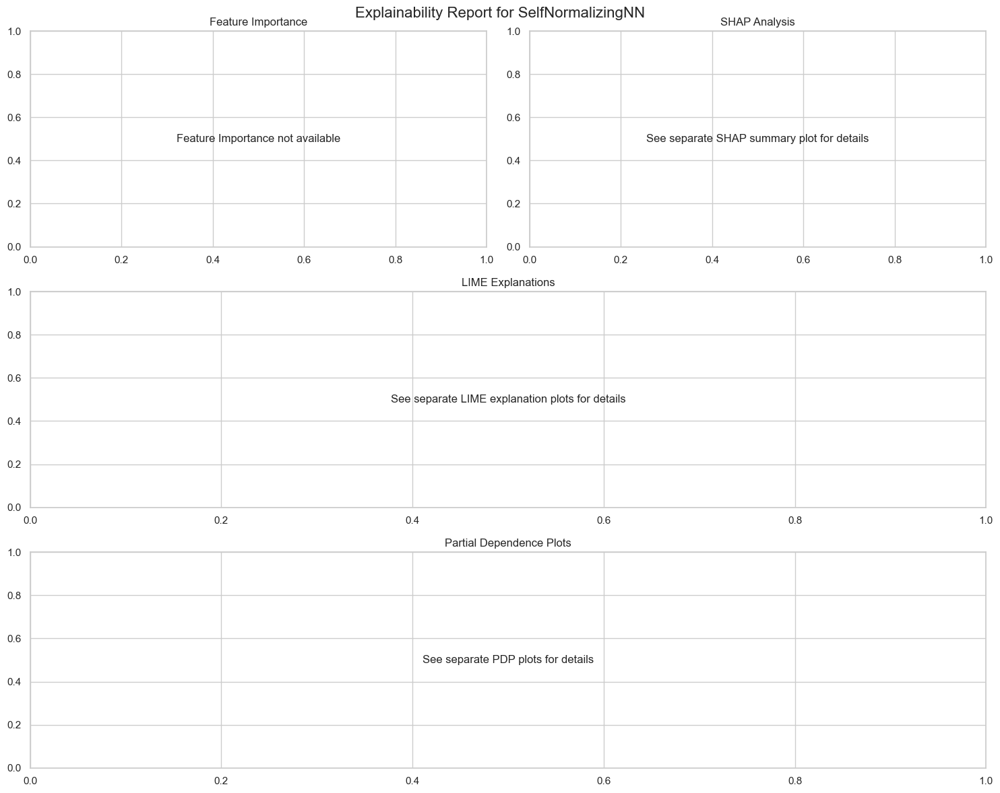

Explainability report complete.
Explainability analysis for SelfNormalizingNN complete.

Analyzing AttentionNN...

Applying Explainability Techniques to AttentionNN
Error in SHAP analysis: Numba needs NumPy 1.24 or less

Applying LIME explainer...


Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2188693135.py", line 6, in apply_shap_analysis
    import shap
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/__init__.py", line 1, in <module>
    from ._explanation import Cohorts, Explanation
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/_explanation.py", line 16, in <module>
    from .utils._clustering import hclust_ordering
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/__init__.py", line 1, in <module>
    from ._clustering import (
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/shap/utils/_clustering.py", line 12, in <module>
    from numba import njit
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__init__.py", line 55, in <module>
    _ensure_critical_deps()
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/numba/__i

<Figure size 1000x600 with 0 Axes>

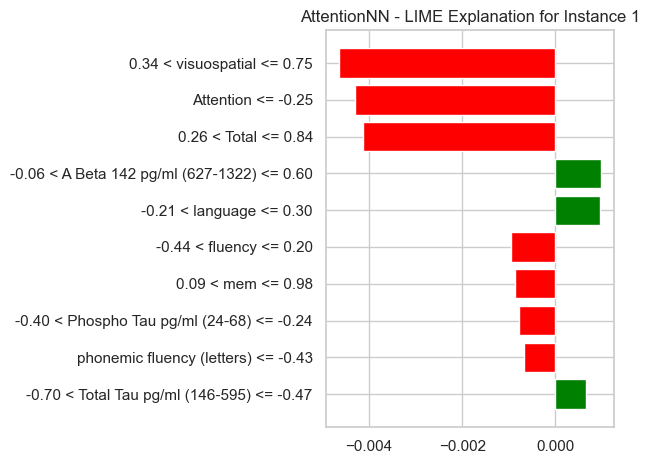

Instance 1:
  True class: multifactorial
  Predicted class: PD
  Prediction probabilities: [1.08692875e-04 5.14681960e-12 9.98024552e-06 8.96994970e-06
 2.83176135e-02 1.22305073e-08 1.58632072e-04 1.47943988e-01
 3.73441204e-02 7.15028584e-01 5.37937433e-02 6.32534176e-03
 1.09602837e-02]
  Top features supporting prediction:
    0.34 < visuospatial <= 0.75: -0.0046
    Attention <= -0.25: -0.0043
    0.26 < Total <= 0.84: -0.0041
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0010
    -0.21 < language <= 0.30: 0.0010



<Figure size 1000x600 with 0 Axes>

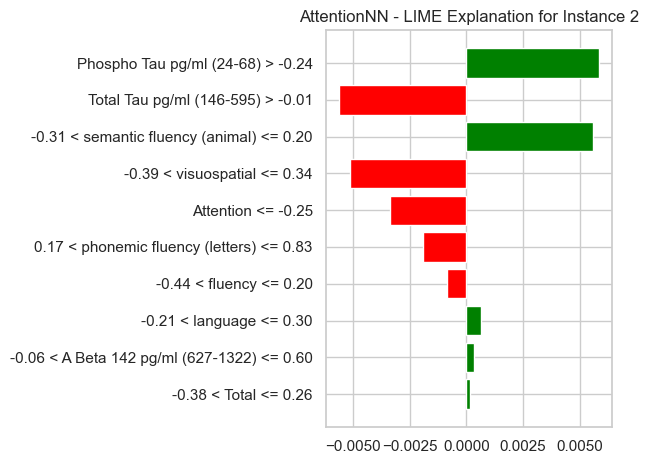

Instance 2:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [6.0304075e-01 5.4006694e-07 2.7754810e-04 3.8748193e-01 3.9999490e-03
 1.0275826e-12 1.0734615e-06 1.6805873e-15 3.5377950e-03 6.1859569e-23
 7.1417774e-13 1.0826893e-11 1.6604034e-03]
  Top features supporting prediction:
    Phospho Tau pg/ml (24-68) > -0.24: 0.0059
    Total Tau pg/ml (146-595) > -0.01: -0.0056
    -0.31 < semantic fluency (animal) <= 0.20: 0.0056
    -0.39 < visuospatial <= 0.34: -0.0052
    Attention <= -0.25: -0.0034



<Figure size 1000x600 with 0 Axes>

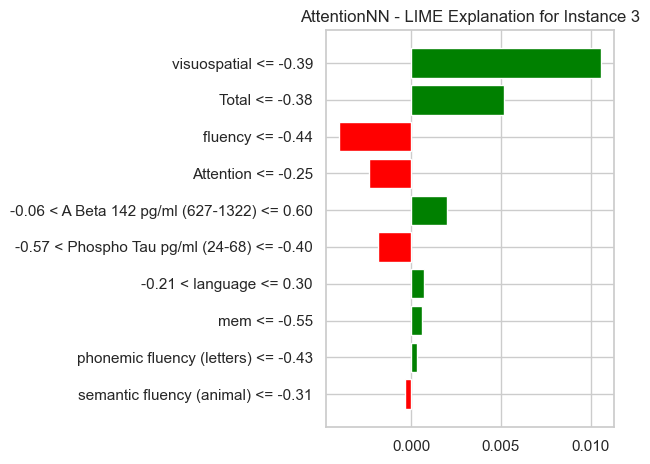

Instance 3:
  True class: PD
  Predicted class: COVID
  Prediction probabilities: [1.2767059e-07 5.9055555e-13 4.9955663e-01 8.2201523e-11 1.1426535e-10
 4.3075502e-02 1.6375607e-12 1.0080474e-07 5.2997582e-02 6.0906891e-11
 2.1515576e-05 4.0434846e-01 5.3513919e-08]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0106
    Total <= -0.38: 0.0052
    fluency <= -0.44: -0.0040
    Attention <= -0.25: -0.0024
    -0.06 < A Beta 142 pg/ml (627-1322) <= 0.60: 0.0020



<Figure size 1000x600 with 0 Axes>

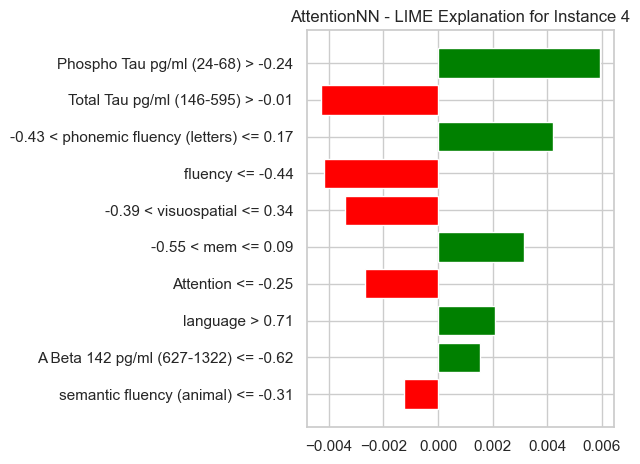

Instance 4:
  True class: AD
  Predicted class: AD
  Prediction probabilities: [6.0478681e-01 8.9607205e-08 2.0526843e-06 3.9493677e-01 2.2696910e-04
 1.6438665e-17 1.1903011e-08 7.3047616e-22 3.6134756e-05 1.3985689e-31
 7.1623419e-18 2.3828142e-17 1.1164185e-05]
  Top features supporting prediction:
    Phospho Tau pg/ml (24-68) > -0.24: 0.0059
    Total Tau pg/ml (146-595) > -0.01: -0.0043
    -0.43 < phonemic fluency (letters) <= 0.17: 0.0042
    fluency <= -0.44: -0.0042
    -0.39 < visuospatial <= 0.34: -0.0034



<Figure size 1000x600 with 0 Axes>

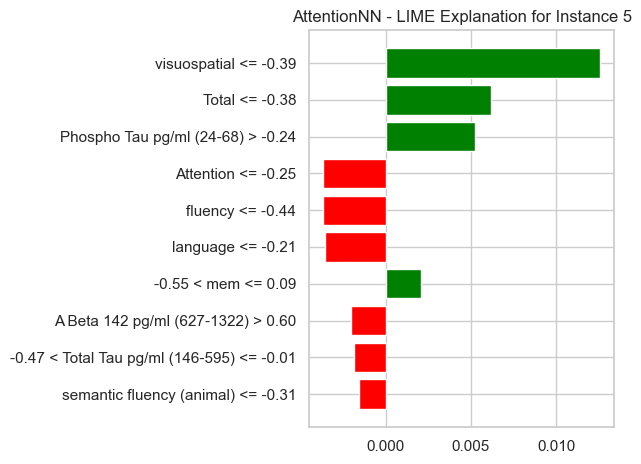

Instance 5:
  True class: multifactorial
  Predicted class: No diagnosis
  Prediction probabilities: [5.8819953e-21 1.1105571e-40 3.6560705e-16 1.2313702e-25 3.7402065e-14
 1.2739915e-17 7.3763726e-23 9.9999130e-01 3.0222193e-07 1.4573476e-06
 3.9173521e-12 6.9479106e-06 4.7879679e-18]
  Top features supporting prediction:
    visuospatial <= -0.39: 0.0126
    Total <= -0.38: 0.0062
    Phospho Tau pg/ml (24-68) > -0.24: 0.0053
    Attention <= -0.25: -0.0037
    fluency <= -0.44: -0.0037

LIME analysis complete.

Generating Partial Dependence Plots...
Error in PDP analysis: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got <diagnostic_models.build_advanced_neural_network.<locals>.PyTorchModelWrapper object at 0x14221a250> instead.

Extracting feature importance...
Error extracting feature importance: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got <diagnostic_models.build_advanced_neural_network.

Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts140000gn/T/ipykernel_76040/2529280246.py", line 25, in apply_pdp_analysis
    result = permutation_importance(model, X_train, np.zeros(X_train.shape[0]),
            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_param_validation.py", line 206, in wrapper
    validate_parameter_constraints(
  File "/Users/adityapurswani/anaconda3/lib/python3.11/site-packages/sklearn/utils/_param_validation.py", line 98, in validate_parameter_constraints
    raise InvalidParameterError(
sklearn.utils._param_validation.InvalidParameterError: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got <diagnostic_models.build_advanced_neural_network.<locals>.PyTorchModelWrapper object at 0x14221a250> instead.
Traceback (most recent call last):
  File "/var/folders/ty/hss55w0s09d7zrn_nz0zts

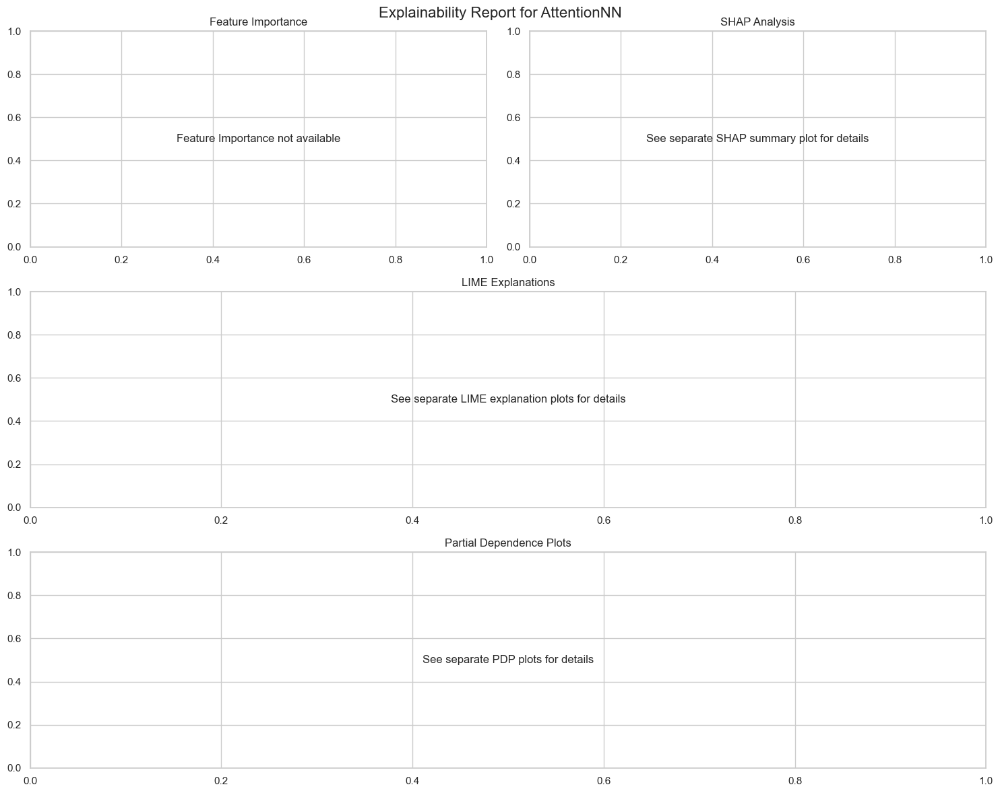

Explainability report complete.
Explainability analysis for AttentionNN complete.

Model Comparison (Accuracy):
                Model  Accuracy   ROC_AUC
0             XGBoost  0.816092  0.974199
6    StackingEnsemble  0.816092  0.970777
1        RandomForest  0.804598  0.937099
8   SelfNormalizingNN  0.770115  0.944995
3                 SVM  0.758621  0.957519
2        DecisionTree  0.747126  0.830936
4       NeuralNetwork  0.735632  0.951041
5                 KNN  0.701149  0.870646
9         AttentionNN  0.505747  0.879784
7  GaussianNaiveBayes  0.482759  0.916424

Model Comparison (ROC AUC):
                Model  Accuracy   ROC_AUC
0             XGBoost  0.816092  0.974199
6    StackingEnsemble  0.816092  0.970777
3                 SVM  0.758621  0.957519
4       NeuralNetwork  0.735632  0.951041
8   SelfNormalizingNN  0.770115  0.944995
1        RandomForest  0.804598  0.937099
7  GaussianNaiveBayes  0.482759  0.916424
9         AttentionNN  0.505747  0.879784
5                 K

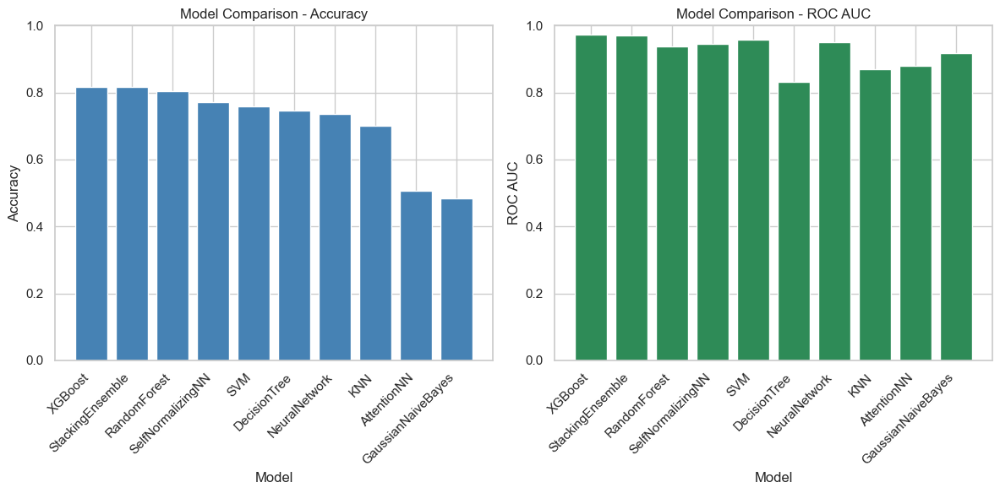

ValueError: too many values to unpack (expected 2)

In [22]:
if __name__ == "__main__":
    # Path to your imputed data
    data_path = 'cognid_knn_imputed_with_variation.xlsx'
    
    # Target column (diagnosis classification)
    target_column = 'Completed Diagnosis'
    
    # Features to use (these should match the imputed columns)
    feature_columns = [
        'Total Tau pg/ml (146-595)', 
        'Phospho Tau pg/ml (24-68)', 
        'A Beta 142 pg/ml (627-1322)', 
        'Total', 
        'Attention', 
        'mem', 
        'fluency', 
        'language', 
        'visuospatial', 
        'phonemic fluency (letters)', 
        'semantic fluency (animal)'
    ]
    
    # Run all models and get comparison
    models_results, comparison = main(
        data_path=data_path,
        target_column=target_column,
        feature_columns=feature_columns,
        models_to_run=['xgboost', 'rf', 'dt', 'svm', 'nn', 'knn', 'stack', 'gnb', 'snn', 'att'],  # Run all models
        test_size=0.2,
        use_adasyn=True,
        adasyn_neighbors=6,
        random_state=42
    )
    
    # Alternatively, run only specific models
    # models_results, comparison = main(
    #     data_path=data_path,
    #     target_column=target_column,
    #     feature_columns=feature_columns,
    #     models_to_run=['xgboost', 'rf'],  # Only run XGBoost and Random Forest
    #     test_size=0.3,
    #     use_adasyn=True,
    #     random_state=42
    # )